# **Báo cáo phân tích xu hướng đánh gí tiêu chí của người dùng dựa trên dữ liệu đánh giá của người dùng.**

> Điểm số đánh giá xu hướng được tính bằng **số lần tiêu chí được đánh giá** chia cho **tổng số lần đánh giá** của khách sạn.

**Ví dụ:**
* Khách sạn A, có 10 lượt đánh giá. trong đó có 5 lượt đánh giá nói về tiêu chí `Vị trí & môi trường` vậy xu hướng đánh giá tiêu chí này là $\frac{5}{10} = 0.5$

**Số loại các tiêu chí đánh giá là.**
* Vị trí & môi trường
* Phòng nghỉ & tiện nghi
* Sạch sẽ
* Dịch vụ & nhân viên
* Wi-Fi
* Ẩm thực
* Cơ sở vật chất
* An ninh
* Giá trị


## import thư viện

In [1]:
import json
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from datetime import datetime
import re
import unicodedata
import os
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import acf, pacf, adfuller, kpss
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.regression.linear_model import OLS
import statsmodels.api as sm
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import shapiro
from pymannkendall import original_test
from scipy.stats import mannwhitneyu
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')  # Bỏ qua cảnh báo từ KPSS

## load data

In [12]:
with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\hotel_data_room.json", 'r', encoding='utf-8') as f:
    hotel_data_room = json.load(f)
room_data = []
for key in hotel_data_room:
    room_data.append({
        'id_room': key['room_id'],
        'id': key['id'],
        'original_price': key['original_price'],
        'name': key['name'],
    })

def drop_duplicates(data):
    seen = set()
    result = []
    for item in data:
        #key = (item['id'], item['original_price'], item['name'])
        key = (item['id'], item['name'])
        if key not in seen:
            seen.add(key)
            result.append(item)
    return result
room_data = drop_duplicates(room_data)


with open("D:\\graduate_dissertation\\final\\dataset\\info_hotel\\feature_star_rating.json", 'r', encoding='utf-8') as f:
    feature_star_rating = json.load(f)
star_data = []
for key in feature_star_rating:
    star_data.append({
        'id': key['id'],
        'stars_rating': key['stars_rating']
    })

with open("hotel_review_score.json", 'r', encoding='utf-8') as f:
    reviewer_data = json.load(f)

def extract_month_year(date_str):
    
    # Loại bỏ các ký tự không cần thiết và chuẩn hóa chuỗi
    date_str = date_str.replace("·", "").replace("Ngày đánh giá:", "").strip()
    
    # Tìm tháng và năm bằng regex, hỗ trợ cả "tháng X năm Y" và "tháng X/Y"
    match = re.search(r'tháng\s*(\d{1,2})\s*(?:năm\s*(\d{4})|\/(\d{4}))', date_str, re.IGNORECASE)
    if match:
        month = match.group(1)  # Lấy tháng
        year = match.group(2) or match.group(3)  # Lấy năm từ "năm Y" hoặc "/Y"
        # Tạo đối tượng datetime (mặc định ngày là 1)
        date_obj = datetime(int(year), int(month), 1)
        return date_obj
    else:
        return None
    
for data in reviewer_data:
    data['date'] = extract_month_year(data['date'])
    

In [13]:
# Xử lý lọc và đổi tên khóa
processed_data = [
    {**{k: v for k, v in d.items() if k != 'id_hotel'}, 'id': d['id_hotel']}
    for d in reviewer_data if d['criteria']
]
len(processed_data)
reviewer_data = pd.DataFrame(processed_data)

In [14]:
reviewer_data

,id_review,country,room,state,rating,criteria,date,id
0,2367e2c2-8bb2-4a79-bc48-034fde283649,Việt Nam,Bungalow Deluxe Nhìn Ra Khu Vườn,Nhóm,Đạt điểm 10,"[[Phòng nghỉ & tiện nghi, Positive], [Cơ sở vậ...",2023-09-01,10000593
1,590605ee-34ba-4223-b132-22e25c298289,Việt Nam,Bungalow Nhìn ra vườn,Phòng gia đình,Đạt điểm 10,"[[Vị trí & môi trường, Positive], [Ẩm thực, Mi...",2023-09-01,10000593
2,4ca654b6-bd02-4546-8cf3-8411fca210b4,Việt Nam,Bungalow Deluxe Nhìn Ra Khu Vườn,Phòng gia đình,Đạt điểm 10,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-08-01,10000593
3,ff16e849-b2f6-4f33-a7db-2151ba37b0e3,Việt Nam,Suite Gia Đình,Phòng gia đình,"Đạt điểm 8,0","[[Vị trí & môi trường, Positive], [Dịch vụ & n...",2023-06-01,10000593
4,d3353974-b78f-438a-a639-8244e83eda71,Việt Nam,Bungalow Nhìn ra vườn,Nhóm,Đạt điểm 10,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-07-01,10000593
...,...,...,...,...,...,...,...,...
878618,f3ead9f1-1fc9-46fa-b0f9-4f9118ef99d4,Nga,Studio Superior,Khách lẻ,"Đạt điểm 8,0","[[Ẩm thực, Negative]]",2024-10-01,9905173
878619,373ff137-bd7b-4dc4-83ac-6a3dbc28076b,Việt Nam,Phòng Deluxe Giường Đôi Có Ban Công,Nhóm,"Đạt điểm 6,0","[[Phòng nghỉ & tiện nghi, Mixed], [Vị trí & mô...",2023-07-01,9929665
878620,98a60352-31b6-4af9-9678-2b8ddec575a4,Turkmenistan,Studio Deluxe Có Giường Cỡ King,Nhóm,"Đạt điểm 3,0","[[Dịch vụ & nhân viên, Negative], [Cơ sở vật c...",2024-03-01,9934373
878621,5bca4791-e27d-4b17-9217-72f530be9665,Nga,Phòng Superior Giường Đôi Có Ban Công Nhìn Ra ...,Phòng gia đình,"Đạt điểm 6,0","[[Cơ sở vật chất, Neutral], [Phòng nghỉ & tiện...",2024-07-01,9940451


In [5]:
print(f'Số lượng review người dùng sao khi đánh giá:', len(reviewer_data))

Số lượng review người dùng sao khi đánh giá: 878623


In [6]:
star_data[0]

{'id': '10000593', 'stars_rating': 3}

In [7]:
room_data[0]

{'id_room': 'RD1000059301',
 'id': '10000593',
 'original_price': 'VND 1.832.536',
 'name': 'Bungalow Nhìn ra vườn'}

In [8]:


def normalize_price(price_str):
    """Chuyển đổi giá từ 'VND 1.832.536' sang số nguyên."""
    if pd.isna(price_str) or price_str is None:
        return None
    price_str = re.sub(r'[^\d]', '', str(price_str))
    try:
        return int(price_str)
    except ValueError:
        return None

def normalize_text(text):
    """Chuẩn hóa NFC cho văn bản."""
    if pd.isna(text) or text is None:
        return None
    return unicodedata.normalize('NFC', str(text).strip().lower())

def analyze_confidence_intervals(star_data, room_data, reviewer_data):
    """Tính khoảng tin cậy, Bootstrap, Subsampling_SD cho 3 cụm."""

    
    # Chuẩn hóa dữ liệu
    star_df = pd.DataFrame(star_data)
    room_df = pd.DataFrame(room_data)
    reviewer_df = pd.DataFrame(reviewer_data)
    
    star_df['id'] = star_df['id'].astype(str)
    room_df['id'] = room_df['id'].astype(str)
    reviewer_df['id_hotel'] = reviewer_df['id_hotel'].astype(str)
    room_df['name_normalized'] = room_df['name'].apply(normalize_text)
    reviewer_df['room_normalized'] = reviewer_df['room'].apply(normalize_text)
    room_df['original_price'] = room_df['original_price'].apply(normalize_price)
    
    # Loại bỏ None
    star_df = star_df.dropna(subset=['id', 'stars_rating'])
    room_df = room_df.dropna(subset=['id', 'name_normalized', 'original_price'])
    reviewer_df = reviewer_df.dropna(subset=['id_hotel', 'room_normalized', 'criteria', 'date'])
    
    # Merge room_data và reviewer_data
    merged_room_reviewer = pd.merge(
        room_df[['id', 'name_normalized', 'original_price']],
        reviewer_df[['id_hotel', 'room_normalized', 'criteria', 'date']],
        left_on=['id', 'name_normalized'],
        right_on=['id_hotel', 'room_normalized'],
        how='inner'
    )
    print(f"\nSố bản ghi sau merge room và reviewer: {len(merged_room_reviewer)}")
    
    # Merge với star_data
    merged_df = pd.merge(
        merged_room_reviewer[['id', 'room_normalized', 'original_price', 'criteria', 'date']],
        star_df[['id', 'stars_rating']],
        on='id',
        how='inner'
    )
    print(f"Số bản ghi sau merge với star_data: {len(merged_df)}")
    merged_df.to_csv("merged_df.csv", index=False)
    return merged_df

def analyze_confidence_intervals_star(star_data, reviewer_data):
    """Tính khoảng tin cậy, Bootstrap, Subsampling_SD cho 3 cụm."""

    
    # Chuẩn hóa dữ liệu
    star_df = pd.DataFrame(star_data)
    #room_df = pd.DataFrame(room_data)
    reviewer_df = pd.DataFrame(reviewer_data)
    
    star_df['id'] = star_df['id'].astype(str)
    #room_df['id'] = room_df['id'].astype(str)
    reviewer_df['id_hotel'] = reviewer_df['id'].astype(str)
    #room_df['name_normalized'] = room_df['name'].apply(normalize_text)
    reviewer_df['room_normalized'] = reviewer_df['room'].apply(normalize_text)
    #room_df['original_price'] = room_df['original_price'].apply(normalize_price)
    
    # Loại bỏ None
    star_df = star_df.dropna(subset=['id', 'stars_rating'])
    #room_df = room_df.dropna(subset=['id', 'name_normalized', 'original_price'])
    reviewer_df = reviewer_df.dropna(subset=['id_hotel', 'room_normalized', 'criteria', 'date'])
    

    
    # Merge với star_data
    merged_df = pd.merge(
        reviewer_df[['id_hotel', 'room_normalized', 'criteria', 'date']],
        star_df[['id', 'stars_rating']],
        left_on=['id_hotel'],
        right_on=['id'],
        how='inner'
    )
    print(f"Số bản ghi sau merge với star_data: {len(merged_df)}")
    merged_df.to_csv("merged_df.csv", index=False)
    return merged_df


In [9]:

merged_df_star = analyze_confidence_intervals_star(star_data, reviewer_data)
merged_df_star

Số bản ghi sau merge với star_data: 638202


,id_hotel,room_normalized,criteria,date,id,stars_rating
0,10000593,bungalow deluxe nhìn ra khu vườn,"[[Phòng nghỉ & tiện nghi, Positive], [Cơ sở vậ...",2023-09-01,10000593,3.0
1,10000593,bungalow nhìn ra vườn,"[[Vị trí & môi trường, Positive], [Ẩm thực, Mi...",2023-09-01,10000593,3.0
2,10000593,bungalow deluxe nhìn ra khu vườn,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-08-01,10000593,3.0
3,10000593,suite gia đình,"[[Vị trí & môi trường, Positive], [Dịch vụ & n...",2023-06-01,10000593,3.0
4,10000593,bungalow nhìn ra vườn,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-07-01,10000593,3.0
...,...,...,...,...,...,...
638197,9952428,căn hộ 1 phòng ngủ,"[[Dịch vụ & nhân viên, Mixed], [Phòng nghỉ & t...",2023-08-01,9952428,3.0
638198,9952428,căn hộ 1 phòng ngủ,"[[Cơ sở vật chất, Mixed], [Phòng nghỉ & tiện n...",2023-05-01,9952428,3.0
638199,9952428,căn hộ 1 phòng ngủ,"[[Cơ sở vật chất, Positive], [Ẩm thực, Negativ...",2024-02-01,9952428,3.0
638200,5386288,căn hộ 3 phòng ngủ,"[[Phòng nghỉ & tiện nghi, Positive], [Cơ sở vậ...",2023-07-01,5386288,4.0


In [10]:
merged_df = analyze_confidence_intervals(star_data, reviewer_data)
merged_df

TypeError: analyze_confidence_intervals() missing 1 required positional argument: 'reviewer_data'

In [8]:
merged_df

,id,room_normalized,original_price,criteria,date,stars_rating
0,10000593,bungalow nhìn ra vườn,1832536.0,"[[Vị trí & môi trường, Positive], [Ẩm thực, Mi...",2023-09-01,3.0
1,10000593,bungalow nhìn ra vườn,1832536.0,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-07-01,3.0
2,10000593,bungalow nhìn ra vườn,1832536.0,"[[Sạch sẽ, Negative], [Phòng nghỉ & tiện nghi,...",2024-04-01,3.0
3,10000593,bungalow nhìn ra vườn,1832536.0,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2025-02-01,3.0
4,10000593,bungalow nhìn ra vườn,1832536.0,"[[Phòng nghỉ & tiện nghi, Positive], [Vị trí &...",2025-02-01,3.0
...,...,...,...,...,...,...
542401,9991755,căn hộ 3 phòng ngủ,5600000.0,"[[Phòng nghỉ & tiện nghi, Positive], [Sạch sẽ,...",2023-09-01,4.0
542402,9991755,căn hộ 3 phòng ngủ,5600000.0,"[[Ẩm thực, Positive], [Phòng nghỉ & tiện nghi,...",2024-06-01,4.0
542403,9991755,căn hộ 3 phòng ngủ,5600000.0,"[[Phòng nghỉ & tiện nghi, Negative], [Cơ sở vậ...",2024-04-01,4.0
542404,9991755,căn hộ 3 phòng ngủ,5600000.0,"[[Phòng nghỉ & tiện nghi, Mixed], [Cơ sở vật c...",2023-07-01,4.0


## **Phân tích theo thời gian**

### **Quá trình thực hiện**

#### **Chuẩn bị dữ liệu**
1. Thêm cột year_month để nhóm dữ liệu theo tháng dựa trên cột date.

2. Nhóm dữ liệu theo year_month trước, sau đó tiếp tục nhóm theo id_hotel trong mỗi tháng.

3. Tính tỷ lệ tiêu chí cho từng khách sạn trong mỗi cụm thời gian (tháng).

4. Loại bỏ các khách sạn có ít hơn review_count (mặc định là 10) đánh giá trong mỗi tháng.

5. Gộp tất cả kết quả từ các tháng lại thành một DataFrame duy nhất, sắp xếp theo year_month và id_hotel.

**Output:**


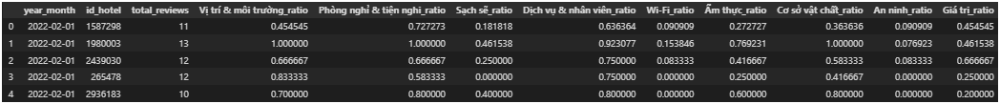

#### **Phân tích số liệu**

Biểu đồ đánh giá tổng quan về số lượng khách sạn và tổng số đánh giá mỗi tháng.

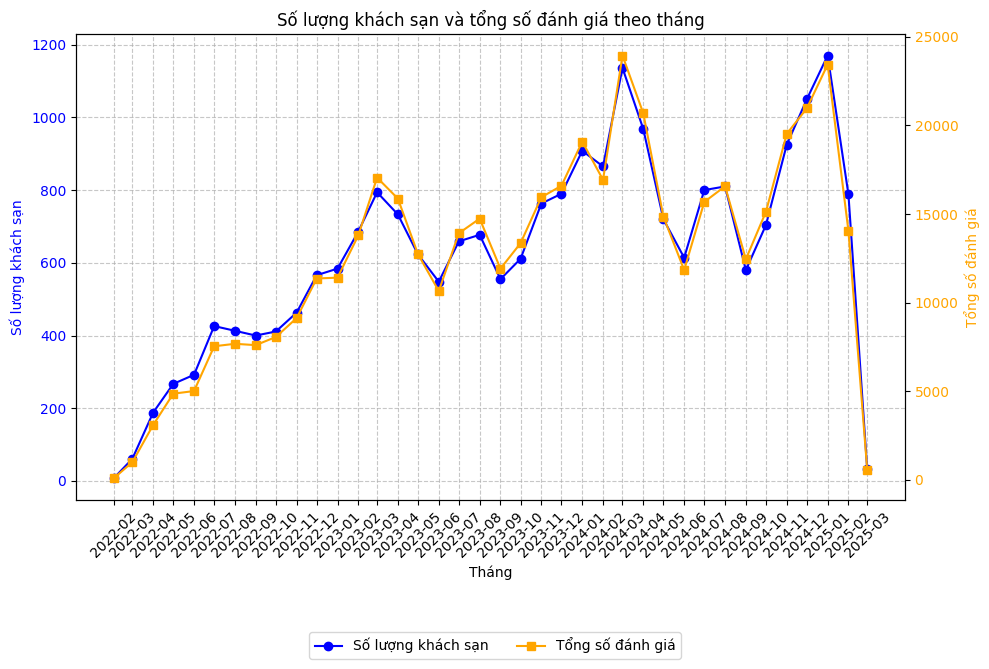

**Nhận xét**: 
Nhận thấy các tháng từ 02/2022 - 04/2022 có dữ liệu đánh giá mỗi tháng khá ít. có vẽ như khi nay các khách sạn tại Việt Nam vẫn chưa có tiếp cận nhiều đến nề tảng trang web này (hoặc cũng có thể đây là giới hạn dẽ liệu của trang web. không hiện các đánh giá thấp hơn của khách sạn.)

Tương tự vào tháng 03/2025 dữ liệu rất ít là vì dữ liệu được thu thập vào đầu tháng 3 nên không đầy đủ.

$=>$ Nên quyết định **loại bỏ** các tháng **02/2022 - 04/2022** và tháng **03/2025** ra khỏi dữ liệu để có thể đánh giá trực quan.

#### **Phân tích xu độ lệch chuẩn của dữ liệu**

Với mục đích là kiểm tra xem các giá trị xu hướng tại một đơn vị thời gian có thật sự đại diện được dữ liệu mẫu hay không, có ý nghĩa thống kê hay không.

Thực hiện tính giá trị `mean` kèm theo `CI_Lower` và `CI_Upper`, để cũng cố thêm nhận xét ta sử dụng thêm phương pháp `bootstrap` kềm theo `Bootstrap_CI_Lower`, `Bootstrap_CI_Upper` với khoảng tin cậy là 95%

**Output:**

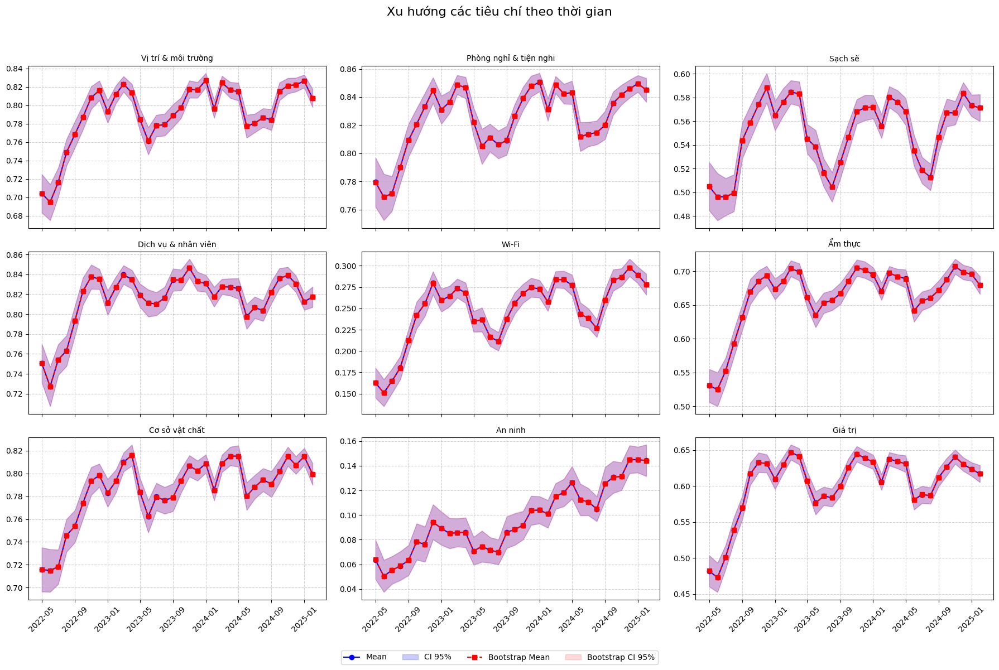

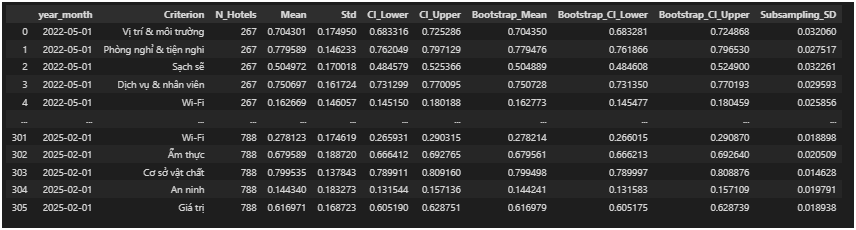

**Nhận xét:**
* Nhận thấy rằng giao động của khoảng tin cậy chỉ giao động trong khoảng < 0.04
* Kiểm tra thêm boostrap thì thấy rằng giá trị giá trị của hai cái chỉ dao động trong khoảng < 0.0001

$=>$ Điều này nhận thấy rằng nó dữ liệu này có thể đại diện cho dữ liệu mẫu.

#### **Phân tích xu hướng của dữ liệu theo thời gian của từng tiêu chí**

> Mục tiêu của nghiên cứu này là phân tích xu hướng, mùa vụ, tính độc lập và các mẫu hình trong đánh giá của khách hàng đối với các tiêu chí dịnh vụ khách sạn.

> Dựa trên dữ liệu chuỗi thời gian từ tháng 04/2022 đến tháng 02/2025.

##### **Phương pháp phân tích**

1. **Phân tích xu hướng.**
* Hồi quy tuyến tính: Kiểm tra xu hướng tăng/giảm.

    $=>$ Tất cả tiêu chí có xu hướng **tăng**.

* Hồi quy đa thức bậc 2: Kiểm tra xu hướng phi tuyến.
    > Phù hợp để phát hiện xu hướng đơn gián và phức tạp.

    $=>$ Xu hướng không hoàn toàn tuyến tính. có tăng nhanh ở giai đoạn đầu, rồi chậm lại. 

* Mann-Kendall: Kiểm định phi tham số để xác nhận xu hướng.
    > Bổ sung kiểm định phi tham số, ít nhạy với outlier.

    $=>$ Mann-Kendall ít nhạy hơn hồi quy, nhưng xác nhận xu hướng tăng ở các tiêu chí quan trọng. `An ninh`, `Wi-Fi`, `Cơ sở vật chất`, `Ẩm thực`, `Vị trí & môi trường`, `Phòng nghỉ & tiện nghi`


* Kiểm tra giải định hồi quy: Shapiro-Wilk cho phân phối chuẩn, Breusch-Pargan cho phương sai đồng nhất.

    * Phân phối chuẩn: Tất cả tiêu chí thỏa mãn (True), đảm bảo hồi quy đáng tin cậy.
    * Phương sai đồng nhất: Chỉ `An ninh` thỏa mãn (True); các tiêu chí khác có phương sai không đồng nhất (False).

    * $=>$ Hồi quy tuyến tính phù hợp, nhưng phương sai không đồng nhất.


2. **Phân tích mùa vụ.**

* STL Decomposition: Phân rã chuỗi thành xu hướng, mùa vụ, và phần dư với chu kỳ 12 và 6 tháng.

    * Chu kỳ 12 tháng.
        * Tất cả tiêu chí có mùa vụ.
        * Mùa vụ mạnh nhất: `Sạch sẽ` (0.9759), `Dịch vụ & nhân viên` (0.8652), `Giá trị` (0.8510).
        * Mùa vụ yếu nhất: `An ninh` (0.1202).

    * Chu kỳ 6 tháng:
        * Hầu hết tiêu chí có mùa vụ (True), trừ `Cơ sở vật chất` và `An ninh` (False).
        * Mùa vụ mạnh nhất: `Vị trí & môi trường` (0.2289), `Giá trị` (0.2022).

    * $=>$ Mùa vụ 12 tháng rõ ràng, đặc biệt ở `Sạch sẽ` và `Dịch vụ & nhân viên`. 

    
* ACF/PACF: Kiểm tra tư tương quan tại lag 12.

    * $=>$ Mùa vụ 12 tháng chưa được xác nhận qua ACF, có thể do dữ liệu chưa đủ 3 chu kỳ đầy đủ.

3. **Kiểm tra tính độc lập.**
* Ljung-Box: Kiểm tra chuỗi cố phải nhiễu trắng.

    $=>$ Đánh giá không ngẫu nhiên, có tự tương quan mạnh, do xu hướng và mùa vụ.


* Durbin-Waston: Kiểm tra tương quan phần dư.

    $=>$ Xác nhận tự tương quan, phù hợp với chuỗi thời gian có xu hướng/mùa vụ.

4. **Kiểm tra tính dừng.**

    $=>$ Hầu hết tiêu chí dừng, phù hợp cho mô hình hóa. `An ninh`, `Wi-Fi`, `Cơ sở vật chất` không dừng, do xu hướng tăng mạnh.

5. **Tương quan.**

6. **A/B Testing**





#### **Phân tích tỷ lệ của tiêu chí đánh giá khách sạn theo thời gian.**

> Mục tiêu của nghiên cứu là kiểm tra tính ổn định, độc lập theo thời gian, và tính đại diện của tỷ lệ các tiêu chí đánh giá khách sạn.

> Tỷ lệ được tính bằng cách lấy tỷ lệ trung bình (Mean) của mỗi tiêu chí chia cho tổng Mean của tất cả tiêu chí trong cùng tháng.



##### **Phương pháp phân tích.**

1. **Kiểm định tính ổn định.**
> Nếu tỷ lệ không đổi, điều này cho thấy khách hàng phân bổ đánh giá giữa các tiêu chí một cách nhất quán, bất kể thời gian, phản ánh cấu trúc ổn định của kỳ vọng khách hàng.

* ANOVA:  Tỷ lệ của `Cơ sở vật chất`, `Phòng nghỉ & tiện nghi`, `Sạch sẽ`, `Vị trí & môi trường`, và `Wi-Fi` ổn định qua các năm. An ninh có sự thay đổi mạnh nhất, do xu hướng cải thiện (tăng từ 0.0139 lên 0.0260).

2. **Kiểm định tính độc lập.**
> Tỷ lệ độc lập theo thời gian (không tự tương quan) cho thấy đánh giá không bị ảnh hưởng bởi các tháng trước, hỗ trợ giả thuyết ngẫu nhiên.

* Ljung-Box: Tỷ lệ của `Giá trị`, `Vị trí & môi trường`, và `Ẩm thực` gần như độc lập, không có tự tương quan đáng kể. Các tiêu chí khác có tự tương quan, do xu hướng tăng (như `An ninh`) hoặc mùa vụ (như `Sạch sẽ`)

3. **Kiểm định tính dừng.**

* ADF, KPSS: Hầu hết tiêu chí có chuỗi tỷ lệ dừng (theo ADF và KPSS), hỗ trợ tính ổn định. `An ninh` và `Wi-Fi` không dừng (ADF), do xu hướng tăng mạnh.

4. **Đánh giá tính đại diện.**

* Proportion_Mean: Cao nhất ở `Phòng nghỉ & tiện nghi` (0.1520), thấp nhất ở `An ninh` (0.0186).
* Proportion_Std: Nhỏ (0.0012–0.0040), cho thấy biến thiên thấp.
* Khoảng tin cậy: Hẹp, ví dụ: `Vị trí & môi trường` (0.1462–0.1471), do mẫu lớn.

    $=>$ Tỷ lệ đại diện tốt cho dữ liệu, với độ chính xác cao và biến thiên nhỏ, phản ánh hành vi đánh giá ổn định của khách hàng.

### **Nhận xét**

### **Kết luận**

### **code**

#### **Chuẩn bị dữ liệu**

In [11]:
# Xử lý lọc và đổi tên khóa
processed_data = [
    {**{k: v for k, v in d.items() if k != 'id_hotel'}, 'id': d['id_hotel']}
    for d in reviewer_data if d['criteria']
]

TypeError: string indices must be integers, not 'str'

In [10]:
len(processed_data)

878623

In [11]:
reviewer_data = pd.DataFrame(processed_data)

In [16]:
reviewer_data.to_csv("reviewer_data.csv", index=False)

In [15]:
reviewer_data

,id_review,country,room,state,rating,criteria,date,id
0,2367e2c2-8bb2-4a79-bc48-034fde283649,Việt Nam,Bungalow Deluxe Nhìn Ra Khu Vườn,Nhóm,Đạt điểm 10,"[[Phòng nghỉ & tiện nghi, Positive], [Cơ sở vậ...",2023-09-01,10000593
1,590605ee-34ba-4223-b132-22e25c298289,Việt Nam,Bungalow Nhìn ra vườn,Phòng gia đình,Đạt điểm 10,"[[Vị trí & môi trường, Positive], [Ẩm thực, Mi...",2023-09-01,10000593
2,4ca654b6-bd02-4546-8cf3-8411fca210b4,Việt Nam,Bungalow Deluxe Nhìn Ra Khu Vườn,Phòng gia đình,Đạt điểm 10,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-08-01,10000593
3,ff16e849-b2f6-4f33-a7db-2151ba37b0e3,Việt Nam,Suite Gia Đình,Phòng gia đình,"Đạt điểm 8,0","[[Vị trí & môi trường, Positive], [Dịch vụ & n...",2023-06-01,10000593
4,d3353974-b78f-438a-a639-8244e83eda71,Việt Nam,Bungalow Nhìn ra vườn,Nhóm,Đạt điểm 10,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-07-01,10000593
...,...,...,...,...,...,...,...,...
878618,f3ead9f1-1fc9-46fa-b0f9-4f9118ef99d4,Nga,Studio Superior,Khách lẻ,"Đạt điểm 8,0","[[Ẩm thực, Negative]]",2024-10-01,9905173
878619,373ff137-bd7b-4dc4-83ac-6a3dbc28076b,Việt Nam,Phòng Deluxe Giường Đôi Có Ban Công,Nhóm,"Đạt điểm 6,0","[[Phòng nghỉ & tiện nghi, Mixed], [Vị trí & mô...",2023-07-01,9929665
878620,98a60352-31b6-4af9-9678-2b8ddec575a4,Turkmenistan,Studio Deluxe Có Giường Cỡ King,Nhóm,"Đạt điểm 3,0","[[Dịch vụ & nhân viên, Negative], [Cơ sở vật c...",2024-03-01,9934373
878621,5bca4791-e27d-4b17-9217-72f530be9665,Nga,Phòng Superior Giường Đôi Có Ban Công Nhìn Ra ...,Phòng gia đình,"Đạt điểm 6,0","[[Cơ sở vật chất, Neutral], [Phòng nghỉ & tiện...",2024-07-01,9940451


In [20]:
import pandas as pd
import numpy as np
import os
from datetime import datetime

def calculate_criteria_ratios_by_month(df, output_dir='output', review_count=10):
    """Tính tỷ lệ cho mỗi tiêu chí theo id khách sạn và theo tháng, lưu kết quả."""
    # Tạo thư mục đầu ra nếu chưa tồn tại
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Danh sách tiêu chí
    criteria_list = [
        'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên',
        'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị'
    ]
    
    # Chuyển cột date thành định dạng datetime
    df['date'] = pd.to_datetime(df['date'])
    
    # Tạo cột year_month để nhóm theo tháng
    df['year_month'] = df['date'].dt.to_period('M')
    
    # Khởi tạo danh sách để lưu kết quả
    all_ratios = []
    
    # Nhóm theo year_month
    for year_month, month_group in tqdm(df.groupby('year_month'), total = len(df.groupby('year_month'))):
        # Tính tổng số review theo id trong tháng đó
        total_reviews = month_group.groupby('id').size().reset_index(name='total_reviews')
        
        # Tính số lần mỗi tiêu chí được nhắc đến theo id trong tháng
        ratios = []
        for id_hotel, group in month_group.groupby('id'):
            # Lấy thông tin price và stars_rating (lấy giá trị đầu tiên)
            #price = group['original_price'].iloc[0]
            #stars = group['stars_rating'].iloc[0]
            total = total_reviews[total_reviews['id'] == id_hotel]['total_reviews'].iloc[0]
            
            # Đếm số lần mỗi tiêu chí xuất hiện
            counts = {crit: 0 for crit in criteria_list}
            for _, row in group.iterrows():
                # Xử lý cột criteria (danh sách các cặp [tiêu chí, cảm xúc])
                for crit, _ in row['criteria']:
                    if crit in criteria_list:
                        counts[crit] += 1
            
            # Tạo hàng kết quả
            ratio_row = {
                'year_month': year_month.to_timestamp(),
                'id_hotel': id_hotel,
                #'original_price': price,
                #'stars_rating': stars,
                'total_reviews': total
            }
            for crit in criteria_list:
                ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else np.nan
            ratios.append(ratio_row)
        
        # Tạo DataFrame kết quả cho tháng này
        ratios_df = pd.DataFrame(ratios)
        # Lọc các dòng có total_reviews >= review_count
        filtered_df = ratios_df[ratios_df['total_reviews'] >= review_count].reset_index(drop=True)
        all_ratios.append(filtered_df)
    
    # Gộp tất cả các kết quả
    final_df = pd.concat(all_ratios, ignore_index=True)
    
    # Sắp xếp theo year_month và id_hotel
    final_df = final_df.sort_values(['year_month', 'id_hotel']).reset_index(drop=True)
    
    # Lưu kết quả vào file CSV
    output_path = os.path.join(output_dir, 'hotel_criteria_ratios_by_month.csv')
    final_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả vào: {output_path}")
    
    return final_df

ratios_df = calculate_criteria_ratios_by_month(reviewer_data)

100%|██████████| 54/54 [03:40<00:00,  4.08s/it]



Đã lưu kết quả vào: output\hotel_criteria_ratios_by_month.csv


In [21]:
ratios_df

,year_month,id_hotel,total_reviews,Vị trí & môi trường_ratio,Phòng nghỉ & tiện nghi_ratio,Sạch sẽ_ratio,Dịch vụ & nhân viên_ratio,Wi-Fi_ratio,Ẩm thực_ratio,Cơ sở vật chất_ratio,An ninh_ratio,Giá trị_ratio
0,2022-02-01,1587298,11,0.454545,0.727273,0.181818,0.636364,0.090909,0.272727,0.363636,0.090909,0.454545
1,2022-02-01,1980003,13,1.000000,1.000000,0.461538,0.923077,0.153846,0.769231,1.000000,0.076923,0.461538
2,2022-02-01,2439030,12,0.666667,0.666667,0.250000,0.750000,0.083333,0.416667,0.583333,0.083333,0.666667
3,2022-02-01,265478,12,0.833333,0.583333,0.000000,0.750000,0.000000,0.250000,0.416667,0.000000,0.250000
4,2022-02-01,2936183,10,0.700000,0.800000,0.400000,0.800000,0.000000,0.600000,0.800000,0.000000,0.200000
...,...,...,...,...,...,...,...,...,...,...,...,...
23582,2025-03-01,8486511,16,0.687500,0.750000,0.562500,0.875000,0.250000,0.750000,0.875000,0.000000,0.812500
23583,2025-03-01,8746201,12,0.833333,0.750000,0.333333,1.000000,0.250000,0.583333,0.833333,0.000000,0.666667
23584,2025-03-01,8851644,30,0.433333,0.766667,0.333333,0.633333,0.066667,0.166667,0.500000,0.000000,0.166667
23585,2025-03-01,9770799,21,0.619048,0.428571,0.238095,0.476190,0.142857,0.285714,0.761905,0.000000,0.523810


#### **Phân tích số liệu**

In [18]:
import pandas as pd
import os

def analyze_hotels_and_reviews_by_month(df, output_dir='output'):
    """Phân tích số lượng khách sạn và tổng số đánh giá mỗi tháng."""
    # Tạo thư mục đầu ra nếu chưa tồn tại
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Nhóm theo year_month, đếm số khách sạn và tính tổng số đánh giá
    analysis_df = df.groupby('year_month').agg(
        num_hotels=('id_hotel', 'nunique'),
        total_reviews=('total_reviews', 'sum')
    ).reset_index()
    
    # Sắp xếp theo year_month
    analysis_df = analysis_df.sort_values('year_month')
    
    # Lưu kết quả vào file CSV
    output_path = os.path.join(output_dir, 'hotels_and_reviews_by_month.csv')
    analysis_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả phân tích vào: {output_path}")
    
    return analysis_df



In [19]:
# Chạy hàm với dữ liệu mẫu
analysis_df = analyze_hotels_and_reviews_by_month(ratios_df)
analysis_df

NameError: name 'ratios_df' is not defined

In [17]:
    # Loại bỏ các dòng có year_month là '2022-02-01', '2022-03-01', và '2025-03-01'
exclude_dates = ['2022-02-01', '2022-03-01', '2022-04-01', '2025-03-01']
filtered_df = analysis_df[~analysis_df['year_month'].isin(exclude_dates)].copy()

# Chuyển year_month thành định dạng datetime và sắp xếp
filtered_df['year_month'] = pd.to_datetime(filtered_df['year_month'])
filtered_df = filtered_df.sort_values('year_month')

NameError: name 'analysis_df' is not defined

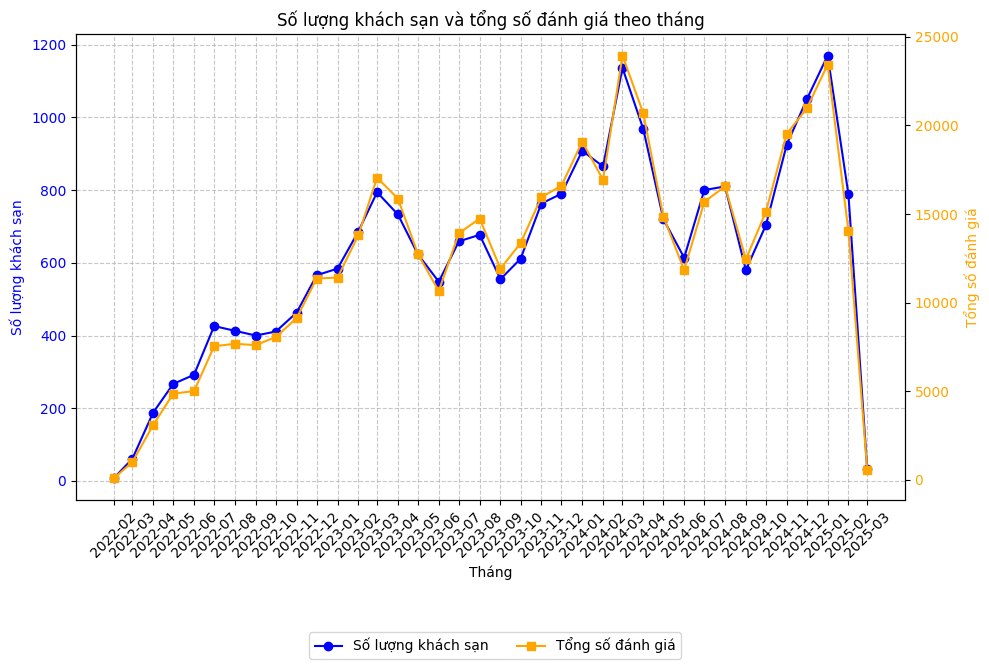


Đã lưu biểu đồ vào: output\hotels_and_reviews_plot.png


In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import os

def visualize_hotels_and_reviews(filtered_df, output_dir='output'):
    """Loại bỏ các dòng cụ thể và trực quan hóa số lượng khách sạn và tổng số đánh giá theo tháng."""
    # Tạo thư mục đầu ra nếu chưa tồn tại
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    

    
    # Tạo biểu đồ
    fig, ax1 = plt.subplots(figsize=(10, 6))
    
    # Vẽ đường cho num_hotels trên trục y bên trái
    ax1.plot(filtered_df['year_month'], filtered_df['num_hotels'], color='blue', label='Số lượng khách sạn', marker='o')
    ax1.set_xlabel('Tháng')
    ax1.set_ylabel('Số lượng khách sạn', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Tạo trục y bên phải cho total_reviews
    ax2 = ax1.twinx()
    ax2.plot(filtered_df['year_month'], filtered_df['total_reviews'], color='orange', label='Tổng số đánh giá', marker='s')
    ax2.set_ylabel('Tổng số đánh giá', color='orange')
    ax2.tick_params(axis='y', labelcolor='orange')
    
    # Tiêu đề và chú thích
    plt.title('Số lượng khách sạn và tổng số đánh giá theo tháng')
    fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=2)
    
    # Định dạng trục x để hiển thị năm-tháng
    ax1.set_xticks(filtered_df['year_month'])
    ax1.set_xticklabels(filtered_df['year_month'].dt.strftime('%Y-%m'), rotation=45)
    
    # Tối ưu hóa bố cục
    fig.tight_layout()
    
    # Lưu biểu đồ
    output_path = os.path.join(output_dir, 'hotels_and_reviews_plot.png')
    plt.show()
    plt.close()
    print(f"\nĐã lưu biểu đồ vào: {output_path}")
    
    return filtered_df


# Chạy hàm
filtered_df = visualize_hotels_and_reviews(analysis_df)

#### **Phân tích độ lệch chuẩn của dữ liệu**


Đã lưu kết quả vào: output\confidence_results_by_month_filtered.csv


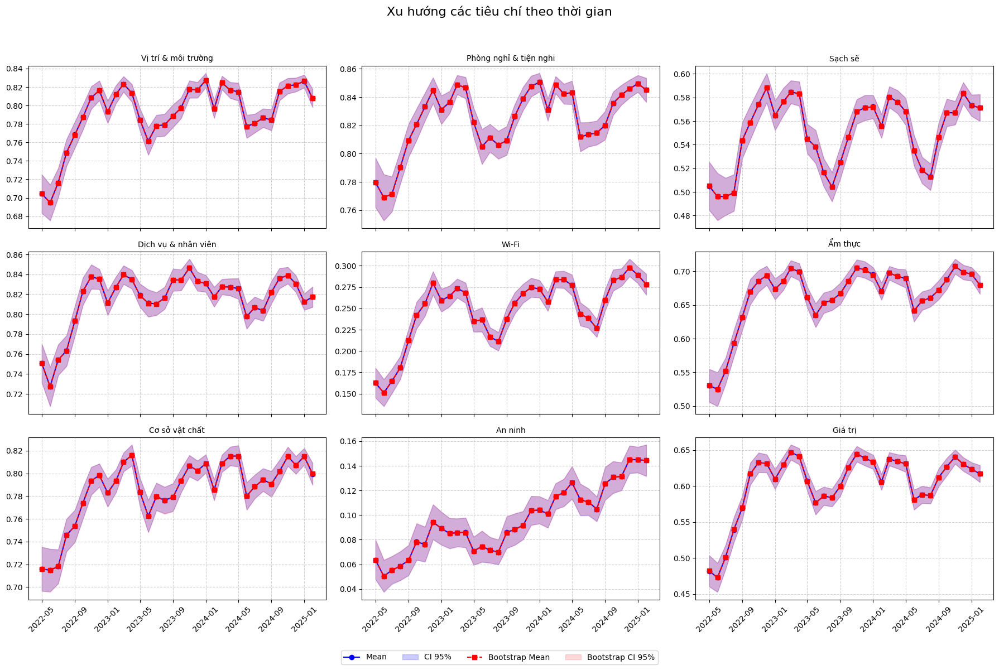


=== Kết quả nghiên cứu ===
    year_month               Criterion  N_Hotels    Mean     Std  CI_Lower  \
0   2022-05-01     Vị trí & môi trường       267  0.7043  0.1750    0.6833   
1   2022-05-01  Phòng nghỉ & tiện nghi       267  0.7796  0.1462    0.7620   
2   2022-05-01                 Sạch sẽ       267  0.5050  0.1700    0.4846   
3   2022-05-01     Dịch vụ & nhân viên       267  0.7507  0.1617    0.7313   
4   2022-05-01                   Wi-Fi       267  0.1627  0.1461    0.1451   
..         ...                     ...       ...     ...     ...       ...   
301 2025-02-01                   Wi-Fi       788  0.2781  0.1746    0.2659   
302 2025-02-01                 Ẩm thực       788  0.6796  0.1887    0.6664   
303 2025-02-01          Cơ sở vật chất       788  0.7995  0.1378    0.7899   
304 2025-02-01                 An ninh       788  0.1443  0.1833    0.1315   
305 2025-02-01                 Giá trị       788  0.6170  0.1687    0.6052   

     CI_Upper  Bootstrap_Mean  Boot

In [17]:
import pandas as pd
import numpy as np
import os
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

def bootstrap_ci(data, n_iterations=10000, ci=95):
    """Tính trung bình Bootstrap và khoảng tin cậy."""
    means = []
    n = len(data)
    if n < 2:
        return np.nan, np.nan, np.nan
    for _ in range(n_iterations):
        sample = np.random.choice(data, size=n, replace=True)
        means.append(np.mean(sample))
    
    mean_bootstrap = np.mean(means)
    lower = np.percentile(means, (100 - ci) / 2)
    upper = np.percentile(means, 100 - (100 - ci) / 2)
    return mean_bootstrap, lower, upper

def subsampling_sd(data, n_iterations=1000, subsample_ratio=0.1):
    """Tính độ lệch chuẩn của trung bình từ mẫu con."""
    means = []
    n = int(len(data) * subsample_ratio)
    if n < 2:
        return np.nan
    for _ in range(n_iterations):
        sample = np.random.choice(data, size=n, replace=False)
        means.append(np.mean(sample))
    
    return np.std(means, ddof=1)

def analyze_confidence_intervals_by_month(df, output_dir='output'):
    """Tính CI và Bootstrap cho các cột _ratio theo từng tháng và vẽ biểu đồ đường."""
    # Tạo thư mục đầu ra
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Loại bỏ các dòng có year_month trong danh sách
    exclude_dates = ['2022-02-01', '2022-03-01', '2022-04-01', '2025-03-01']
    df = df[~df['year_month'].isin(exclude_dates)].copy()
    
    # Danh sách cột _ratio
    ratio_columns = [
        'Vị trí & môi trường_ratio', 'Phòng nghỉ & tiện nghi_ratio',
        'Sạch sẽ_ratio', 'Dịch vụ & nhân viên_ratio',
        'Wi-Fi_ratio', 'Ẩm thực_ratio',
        'Cơ sở vật chất_ratio', 'An ninh_ratio', 'Giá trị_ratio'
    ]
    
    # Chuyển year_month thành datetime
    df['year_month'] = pd.to_datetime(df['year_month'])
    
    # Khởi tạo danh sách lưu kết quả
    all_results = []
    
    # Nhóm theo year_month
    for year_month, group in df.groupby('year_month'):
        results = []
        for col in ratio_columns:
            data = group[col].dropna()
            if len(data) > 1:
                # Khoảng tin cậy chuẩn
                mean = np.mean(data)
                std = np.std(data, ddof=1)
                se = std / np.sqrt(len(data))
                ci_lower, ci_upper = stats.norm.interval(0.95, loc=mean, scale=se)
                
                # Bootstrap
                mean_bootstrap, bootstrap_lower, bootstrap_upper = bootstrap_ci(data)
                
                # Subsampling_SD
                subsampling_std = subsampling_sd(data)
                
                results.append({
                    'year_month': year_month,
                    'Criterion': col.replace('_ratio', ''),
                    'N_Hotels': len(data),
                    'Mean': mean,
                    'Std': std,
                    'CI_Lower': ci_lower,
                    'CI_Upper': ci_upper,
                    'Bootstrap_Mean': mean_bootstrap,
                    'Bootstrap_CI_Lower': bootstrap_lower,
                    'Bootstrap_CI_Upper': bootstrap_upper,
                    'Subsampling_SD': subsampling_std
                })
            else:
                print(f"\nTháng {year_month.strftime('%Y-%m')}, tiêu chí {col}: Không đủ dữ liệu để tính.")
        
        # Tạo DataFrame kết quả cho tháng này
        month_results = pd.DataFrame(results)
        all_results.append(month_results)
    
    # Gộp tất cả kết quả
    results_df = pd.concat(all_results, ignore_index=True)
    
    # Lưu kết quả vào CSV
    output_path = os.path.join(output_dir, 'confidence_results_by_month_filtered.csv')
    results_df.to_csv(output_path, index=False)
    print(f"\nĐã lưu kết quả vào: {output_path}")
    
    # Vẽ biểu đồ đường cho từng tiêu chí
    # Tạo figure với lưới subplots (3 hàng x 3 cột cho 9 tiêu chí)
    criteria = results_df['Criterion'].unique()
    n_criteria = len(criteria)
    n_cols = 3
    n_rows = int(np.ceil(n_criteria / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12), sharex=True)
    axes = axes.flatten()  # Chuyển thành mảng 1D để dễ duyệt

    for idx, criterion in enumerate(criteria):
        ax = axes[idx]
        criterion_data = results_df[results_df['Criterion'] == criterion].sort_values('year_month')
        
        # Vẽ Mean và CI thường
        ax.plot(criterion_data['year_month'], criterion_data['Mean'], 
                marker='o', label='Mean', color='blue', linestyle='-')
        ax.fill_between(criterion_data['year_month'], 
                        criterion_data['CI_Lower'], 
                        criterion_data['CI_Upper'], 
                        color='blue', alpha=0.2)
        
        # Vẽ Bootstrap
        ax.plot(criterion_data['year_month'], criterion_data['Bootstrap_Mean'], 
                marker='s', label='Bootstrap Mean', color='red', linestyle='--')
        ax.fill_between(criterion_data['year_month'], 
                        criterion_data['Bootstrap_CI_Lower'], 
                        criterion_data['Bootstrap_CI_Upper'], 
                        color='red', alpha=0.15)
        
        ax.set_title(criterion, fontsize=10)
        ax.tick_params(axis='x', rotation=45)
        ax.grid(True, linestyle='--', alpha=0.6)

    # Xóa subplot dư nếu có
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    # Chú thích và layout
    fig.suptitle('Xu hướng các tiêu chí theo thời gian', fontsize=16)
    fig.legend(['Mean', 'CI 95%', 'Bootstrap Mean', 'Bootstrap CI 95%'], 
            loc='lower center', ncol=4, bbox_to_anchor=(0.5, -0.01))
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Chừa chỗ cho tiêu đề và legend

    # Lưu và hiển thị
    plt.savefig(os.path.join(output_dir, 'all_trends_filtered.png'))
    plt.show()

    
    return results_df


# Chạy hàm
try:
    results_df = analyze_confidence_intervals_by_month(ratios_df)
    print("\n=== Kết quả nghiên cứu ===")
    print(results_df.round(4))
except Exception as e:
    print(f"\nLỗi: {str(e)}")

In [18]:
results_df

,year_month,Criterion,N_Hotels,Mean,Std,CI_Lower,CI_Upper,Bootstrap_Mean,Bootstrap_CI_Lower,Bootstrap_CI_Upper,Subsampling_SD
0,2022-05-01,Vị trí & môi trường,267,0.704301,0.174950,0.683316,0.725286,0.704375,0.683559,0.725142,0.032022
1,2022-05-01,Phòng nghỉ & tiện nghi,267,0.779589,0.146233,0.762049,0.797129,0.779595,0.761814,0.796449,0.028255
2,2022-05-01,Sạch sẽ,267,0.504972,0.170018,0.484579,0.525366,0.505107,0.484972,0.525406,0.032184
3,2022-05-01,Dịch vụ & nhân viên,267,0.750697,0.161724,0.731299,0.770095,0.750566,0.731453,0.770008,0.029825
4,2022-05-01,Wi-Fi,267,0.162669,0.146057,0.145150,0.180188,0.162748,0.145378,0.180310,0.027324
...,...,...,...,...,...,...,...,...,...,...,...
301,2025-02-01,Wi-Fi,788,0.278123,0.174619,0.265931,0.290315,0.278127,0.265817,0.290742,0.018594
302,2025-02-01,Ẩm thực,788,0.679589,0.188720,0.666412,0.692765,0.679636,0.666468,0.692758,0.020050
303,2025-02-01,Cơ sở vật chất,788,0.799535,0.137843,0.789911,0.809160,0.799566,0.789859,0.809053,0.014862
304,2025-02-01,An ninh,788,0.144340,0.183273,0.131544,0.157136,0.144323,0.131697,0.157156,0.020148


#### **Phân tích xu hướng của dữ liệu theo thời gian của từng tiêu chí**

##### chưa bỏ tháng

In [ ]:
exclude_dates = ['2022-02-01', '2022-03-01', '2022-04-01', '2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2025-03-01']
results_df_drop_month = ratios_df[~ratios_df['year_month'].isin(exclude_dates)].copy()

In [16]:


def calculate_summary_stats(df):
    """Tính toán thống kê tóm tắt từ dữ liệu gốc cho mỗi tiêu chí theo tháng."""
    # Danh sách các tiêu chí
    criteria_cols = [col for col in df.columns if '_ratio' in col]
    criteria = [col.replace('_ratio', '') for col in criteria_cols]
    
    # Tạo danh sách để lưu kết quả
    summary_data = []
    
    # Nhóm theo year_month
    grouped = df.groupby('year_month')
    
    for month, group in grouped:
        n_hotels = len(group)
        for criterion, col in zip(criteria, criteria_cols):
            ratios = group[col].dropna()
            if len(ratios) > 0:
                mean = ratios.mean()
                std = ratios.std()
                # Tính khoảng tin cậy 95%
                se = std / np.sqrt(len(ratios))
                ci_lower, ci_upper = stats.t.interval(0.95, len(ratios)-1, loc=mean, scale=se)
                # Bootstrap mean và CI
                bootstrap_means = [np.mean(np.random.choice(ratios, size=len(ratios), replace=True)) for _ in range(1000)]
                bootstrap_mean = np.mean(bootstrap_means)
                bootstrap_ci_lower, bootstrap_ci_upper = np.percentile(bootstrap_means, [2.5, 97.5])
                # Subsampling SD
                subsampling_sd = np.std(bootstrap_means)
                
                summary_data.append({
                    'year_month': month,
                    'Criterion': criterion,
                    'N_Hotels': n_hotels,
                    'Mean': mean,
                    'Std': std,
                    'CI_Lower': ci_lower,
                    'CI_Upper': ci_upper,
                    'Bootstrap_Mean': bootstrap_mean,
                    'Bootstrap_CI_Lower': bootstrap_ci_lower,
                    'Bootstrap_CI_Upper': bootstrap_ci_upper,
                    'Subsampling_SD': subsampling_sd
                })
    
    return pd.DataFrame(summary_data)

def analyze_time_series_patterns_enhanced(results_df, output_dir='output', periods=[12, 6]):
    """Phân tích xu hướng, mùa vụ, tính độc lập và mẫu hình của các tiêu chí theo thời gian."""
    # Tạo thư mục đầu ra
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Đảm bảo year_month là datetime
    results_df['year_month'] = pd.to_datetime(results_df['year_month'])
    
    # Danh sách tiêu chí
    criteria = results_df['Criterion'].unique()
    
    # Khởi tạo danh sách lưu kết quả kiểm định
    test_results = []
    
    # Phân tích tương quan giữa các tiêu chí
    pivot_df = results_df.pivot_table(index='year_month', columns='Criterion', values='Mean')
    correlation_matrix = pivot_df.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
    plt.title('Ma trận tương quan giữa các tiêu chí')
    plt.tight_layout()
    corr_plot_path = os.path.join(output_dir, 'criteria_correlation_heatmap.png')
    plt.show()
    plt.close()
    
    # A/B testing giữa 2022 và 2023
    ab_test_results = []
    for criterion in criteria:
        df_criterion = results_df[results_df['Criterion'] == criterion]
        data_2022 = df_criterion[df_criterion['year_month'].dt.year == 2022]['Mean'].dropna()
        data_2023 = df_criterion[df_criterion['year_month'].dt.year == 2023]['Mean'].dropna()
        if len(data_2022) > 0 and len(data_2023) > 0:
            stat, p_value = mannwhitneyu(data_2022, data_2023, alternative='two-sided')
            ab_test_results.append({
                'Criterion': criterion,
                'MannWhitneyU_Stat': stat,
                'P_Value': p_value,
                'Mean_2022': data_2022.mean(),
                'Mean_2023': data_2023.mean()
            })
    
    ab_test_df = pd.DataFrame(ab_test_results)
    ab_test_path = os.path.join(output_dir, 'ab_test_results.csv')
    ab_test_df.to_csv(ab_test_path, index=False)
    
    for criterion in criteria:
        # Lọc dữ liệu cho tiêu chí
        df_criterion = results_df[results_df['Criterion'] == criterion].sort_values('year_month')
        if len(df_criterion) < 3:
            continue
        
        # Chuẩn bị dữ liệu
        time_series = df_criterion['Mean'].values
        time_index = df_criterion['year_month']
        n = len(time_series)
        
        # 1. Hồi quy tuyến tính
        time_numeric = np.arange(n)
        X = sm.add_constant(time_numeric)
        model = OLS(time_series, X).fit()
        slope = model.params[1]
        p_value_slope = model.pvalues[1]
        trend_linear = 'Tăng' if slope > 0 and p_value_slope < 0.05 else 'Giảm' if slope < 0 and p_value_slope < 0.05 else 'Không rõ'
        
        # Hồi quy đa thức bậc 2
        X_poly = sm.add_constant(np.column_stack((time_numeric, time_numeric**2)))
        model_poly = OLS(time_series, X_poly).fit()
        p_value_poly = model_poly.pvalues[2]
        
        # Kiểm tra giả định phần dư
        shapiro_pvalue = shapiro(model.resid)[1]
        resid_normality = shapiro_pvalue > 0.05
        bp_test = het_breuschpagan(model.resid, X)
        resid_homoscedasticity = bp_test[1] > 0.05
        
        # 2. Kiểm tra Mann-Kendall
        mk_result = original_test(time_series)
        trend_mk = mk_result.trend
        p_value_mk = mk_result.p
        
        # 3. Phân rã STL cho các chu kỳ
        seasonal_results = {}
        for period in periods:
            if n >= 2 * period:
                try:
                    stl = STL(time_series, period=period, robust=True).fit()
                    seasonal_strength = np.var(stl.seasonal) / np.var(time_series)
                    has_seasonality = seasonal_strength > 0.1
                    seasonal_results[period] = {'strength': seasonal_strength, 'has_seasonality': has_seasonality, 'stl': stl}
                except:
                    seasonal_results[period] = {'strength': np.nan, 'has_seasonality': False, 'stl': None}
            else:
                seasonal_results[period] = {'strength': np.nan, 'has_seasonality': False, 'stl': None}
        
        # 4. Kiểm tra tự tương quan (ACF) và PACF
        acf_values, acf_confint = acf(time_series, nlags=min(12, n-1), alpha=0.05)
        pacf_values, pacf_confint = pacf(time_series, nlags=min(12, n-1), alpha=0.05)
        acf_lag12 = acf_values[12] if len(acf_values) > 12 else np.nan
        acf_lag12_significant = abs(acf_lag12) > acf_confint[12, 1] / 1.96 if len(acf_confint) > 12 else False
        
        # 5. Kiểm tra Durbin-Watson
        dw_stat = durbin_watson(model.resid)
        dw_interpretation = 'Tự tương quan dương' if dw_stat < 1.5 else 'Tự tương quan âm' if dw_stat > 2.5 else 'Gần độc lập'
        
        # 6. Kiểm tra Ljung-Box
        lb_results = acorr_ljungbox(time_series, lags=[min(12, n-1)], return_df=True)
        lb_pvalue = lb_results['lb_pvalue'].iloc[-1]
        lb_independent = lb_pvalue > 0.05
        
        # 7. Kiểm tra tính dừng (ADF và KPSS)
        adf_result = adfuller(time_series)
        adf_pvalue = adf_result[1]
        adf_stationary = adf_pvalue < 0.05
        kpss_result = kpss(time_series, regression='c')
        kpss_stat = kpss_result[0]
        kpss_pvalue = kpss_result[1]
        kpss_stationary = kpss_pvalue > 0.05
        
        # Lưu kết quả
        result = {
            'Criterion': criterion,
            'Trend_Linear': trend_linear,
            'Slope_Linear': slope,
            'P_Value_Linear': p_value_slope,
            'P_Value_Poly': p_value_poly,
            'Resid_Normality': resid_normality,
            'Resid_Homoscedasticity': resid_homoscedasticity,
            'Trend_MannKendall': trend_mk,
            'P_Value_MK': p_value_mk,
            'ACF_Lag12': acf_lag12,
            'ACF_Lag12_Significant': acf_lag12_significant,
            'Durbin_Watson': dw_stat,
            'DW_Interpretation': dw_interpretation,
            'Ljung_Box_PValue': lb_pvalue,
            'Independent': lb_independent,
            'ADF_PValue': adf_pvalue,
            'ADF_Stationary': adf_stationary,
            'KPSS_PValue': kpss_pvalue,
            'KPSS_Stationary': kpss_stationary
        }
        for period in periods:
            result[f'Seasonal_Strength_Period_{period}'] = seasonal_results[period]['strength']
            result[f'Has_Seasonality_Period_{period}'] = seasonal_results[period]['has_seasonality']
        test_results.append(result)
        
        # Vẽ biểu đồ phân tích
        plt.figure(figsize=(12, 12))
        
        # Chuỗi thời gian và xu hướng
        plt.subplot(5, 1, 1)
        plt.plot(time_index, time_series, marker='o', label='Mean')
        plt.plot(time_index, model.fittedvalues, linestyle='--', label='Xu hướng tuyến tính')
        plt.fill_between(time_index, df_criterion['CI_Lower'], df_criterion['CI_Upper'], alpha=0.2, label='95% CI')
        plt.title(f'{criterion}: Chuỗi thời gian và xu hướng')
        plt.xlabel('Tháng')
        plt.ylabel('Tỷ lệ trung bình')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        
        # Thành phần mùa vụ STL
        for i, period in enumerate(periods, 2):
            if seasonal_results[period]['stl'] is not None:
                plt.subplot(5, 1, i)
                plt.plot(time_index, seasonal_results[period]['stl'].seasonal, marker='s', label=f'Seasonal (Period={period})')
                plt.title(f'Thành phần mùa vụ (STL, Period={period})')
                plt.xlabel('Tháng')
                plt.ylabel('Seasonal')
                plt.xticks(rotation=45)
                plt.grid(True)
                plt.legend()
        
        # ACF
        plt.subplot(5, 1, 4)
        plt.stem(range(min(13, n)), acf_values[:min(13, n)], basefmt=' ')
        plt.fill_between(range(min(13, n)), acf_confint[:min(13, n), 0] - acf_values[:min(13, n)], 
                         acf_confint[:min(13, n), 1] - acf_values[:min(13, n)], alpha=0.2)
        plt.axhline(0, color='black', linestyle='--')
        plt.title('Tự tương quan (ACF)')
        plt.xlabel('Lag')
        plt.ylabel('ACF')
        plt.grid(True)
        
        # PACF
        plt.subplot(5, 1, 5)
        plt.stem(range(min(13, n)), pacf_values[:min(13, n)], basefmt=' ')
        plt.fill_between(range(min(13, n)), pacf_confint[:min(13, n), 0] - pacf_values[:min(13, n)], 
                         pacf_confint[:min(13, n), 1] - pacf_values[:min(13, n)], alpha=0.2)
        plt.axhline(0, color='black', linestyle='--')
        plt.title('Tự tương quan từng phần (PACF)')
        plt.xlabel('Lag')
        plt.ylabel('PACF')
        plt.grid(True)
        
        plt.tight_layout()
        plot_path = os.path.join(output_dir, f'time_series_analysis_{criterion.replace(" ", "_")}.png')
        plt.show()
        plt.close()
    
    # Tạo DataFrame kết quả
    results_summary = pd.DataFrame(test_results)
    
    # Lưu kết quả vào CSV
    output_path = os.path.join(output_dir, 'time_series_result_enhanced.csv')
    results_summary.to_csv(output_path, index=False)
    
    # Vẽ biểu đồ tổng hợp
    plt.figure(figsize=(12, 6))
    for criterion in criteria:
        df_criterion = results_df[results_df['Criterion'] == criterion].sort_values('year_month')
        if len(df_criterion) >= 2:
            plt.plot(df_criterion['year_month'], df_criterion['Mean'], marker='o', label=criterion)
    plt.title('Xu hướng của tất cả các tiêu chí theo thời gian')
    plt.xlabel('Tháng')
    plt.ylabel('Tỷ lệ trung bình')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    all_criteria_plot_path = os.path.join(output_dir, 'all_criteria_plot.pdf')
    plt.show()
    plt.close()
    
    return results_summary, correlation_matrix, ab_test_df




In [ ]:
results_df = calculate_summary_stats(results_df_drop_month)


summary_df, corr_matrix, ab_test_df = analyze_time_series_patterns_enhanced(results_df, periods=[12, 6])


In [40]:
display(summary_df.round(4))

,Criterion,Trend_Linear,Slope_Linear,P_Value_Linear,P_Value_Poly,Resid_Normality,Resid_Homoscedasticity,Trend_MannKendall,P_Value_MK,ACF_Lag12,...,Ljung_Box_PValue,Independent,ADF_PValue,ADF_Stationary,KPSS_PValue,KPSS_Stationary,Seasonal_Strength_Period_12,Has_Seasonality_Period_12,Seasonal_Strength_Period_6,Has_Seasonality_Period_6
0,Vị trí & môi trường,Tăng,0.0020,0.0003,0.0037,True,False,increasing,0.0015,0.2990,...,0.0000,False,0.0011,True,0.0569,True,0.7274,True,0.2289,True
1,Phòng nghỉ & tiện nghi,Tăng,0.0013,0.0007,0.0291,True,False,increasing,0.0020,0.3893,...,0.0000,False,0.0187,True,0.0843,True,0.7921,True,0.1210,True
2,Sạch sẽ,Tăng,0.0010,0.0442,0.2320,True,False,no trend,0.1030,0.4694,...,0.0000,False,0.6315,False,0.1000,True,0.9759,True,0.1651,True
3,Dịch vụ & nhân viên,Tăng,0.0013,0.0043,0.0001,True,False,no trend,0.2241,0.1315,...,0.0007,False,0.0008,True,0.0976,True,0.8652,True,0.1892,True
4,Wi-Fi,Tăng,0.0026,0.0000,0.0266,True,False,increasing,0.0000,0.3091,...,0.0000,False,0.8281,False,0.0385,False,0.6815,True,0.1014,True
5,Ẩm thực,Tăng,0.0028,0.0003,0.0003,True,False,increasing,0.0053,0.2219,...,0.0001,False,0.0323,True,0.0614,True,0.7863,True,0.1751,True
6,Cơ sở vật chất,Tăng,0.0019,0.0000,0.0009,True,False,increasing,0.0001,0.2364,...,0.0002,False,0.0637,False,0.0251,False,0.5968,True,0.0991,False
7,An ninh,Tăng,0.0025,0.0000,0.0370,True,True,increasing,0.0000,0.0982,...,0.0000,False,0.9062,False,0.0100,False,0.1202,True,0.0364,False
8,Giá trị,Tăng,0.0023,0.0016,0.0006,True,False,no trend,0.0504,0.2499,...,0.0001,False,0.0247,True,0.0866,True,0.8510,True,0.2022,True


In [41]:
print(summary_df.round(4))

                Criterion Trend_Linear  Slope_Linear  P_Value_Linear  \
0     Vị trí & môi trường         Tăng        0.0020          0.0003   
1  Phòng nghỉ & tiện nghi         Tăng        0.0013          0.0007   
2                 Sạch sẽ         Tăng        0.0010          0.0442   
3     Dịch vụ & nhân viên         Tăng        0.0013          0.0043   
4                   Wi-Fi         Tăng        0.0026          0.0000   
5                 Ẩm thực         Tăng        0.0028          0.0003   
6          Cơ sở vật chất         Tăng        0.0019          0.0000   
7                 An ninh         Tăng        0.0025          0.0000   
8                 Giá trị         Tăng        0.0023          0.0016   

   P_Value_Poly  Resid_Normality  Resid_Homoscedasticity Trend_MannKendall  \
0        0.0037             True                   False        increasing   
1        0.0291             True                   False        increasing   
2        0.2320             True             

In [45]:
for key in summary_df:
    print(summary_df[key])
    print("\n")

0       Vị trí & môi trường
1    Phòng nghỉ & tiện nghi
2                   Sạch sẽ
3       Dịch vụ & nhân viên
4                     Wi-Fi
5                   Ẩm thực
6            Cơ sở vật chất
7                   An ninh
8                   Giá trị
Name: Criterion, dtype: object


0    Tăng
1    Tăng
2    Tăng
3    Tăng
4    Tăng
5    Tăng
6    Tăng
7    Tăng
8    Tăng
Name: Trend_Linear, dtype: object


0    0.002015
1    0.001265
2    0.001022
3    0.001332
4    0.002564
5    0.002754
6    0.001918
7    0.002493
8    0.002345
Name: Slope_Linear, dtype: float64


0    2.504746e-04
1    7.415485e-04
2    4.417134e-02
3    4.274045e-03
4    1.777885e-05
5    3.478624e-04
6    9.786836e-06
7    7.756352e-15
8    1.603846e-03
Name: P_Value_Linear, dtype: float64


0    0.003745
1    0.029077
2    0.232039
3    0.000063
4    0.026582
5    0.000327
6    0.000876
7    0.036988
8    0.000628
Name: P_Value_Poly, dtype: float64


0    True
1    True
2    True
3    True
4    True
5    True
6 

In [32]:
corr_matrix.round(4)


Criterion,An ninh,Cơ sở vật chất,Dịch vụ & nhân viên,Giá trị,Phòng nghỉ & tiện nghi,Sạch sẽ,Vị trí & môi trường,Wi-Fi,Ẩm thực
Criterion,,,,,,,,,
An ninh,1.0000,0.7336,0.5175,0.6023,0.6913,0.5767,0.6801,0.7927,0.6357
Cơ sở vật chất,0.7336,1.0000,0.8919,0.9538,0.9451,0.8030,0.9698,0.9425,0.9646
Dịch vụ & nhân viên,0.5175,0.8919,1.0000,0.9634,0.8608,0.7748,0.9189,0.8797,0.9598
Giá trị,0.6023,0.9538,0.9634,1.0000,0.9455,0.8607,0.9767,0.9408,0.9922
Phòng nghỉ & tiện nghi,0.6913,0.9451,0.8608,0.9455,1.0000,0.9306,0.9708,0.9611,0.9387
Sạch sẽ,0.5767,0.8030,0.7748,0.8607,0.9306,1.0000,0.8635,0.9057,0.8230
Vị trí & môi trường,0.6801,0.9698,0.9189,0.9767,0.9708,0.8635,1.0000,0.9561,0.9811
Wi-Fi,0.7927,0.9425,0.8797,0.9408,0.9611,0.9057,0.9561,1.0000,0.9402
Ẩm thực,0.6357,0.9646,0.9598,0.9922,0.9387,0.8230,0.9811,0.9402,1.0000


In [33]:

ab_test_df.round(4)


,Criterion,MannWhitneyU_Stat,P_Value,Mean_2022,Mean_2023
0,Vị trí & môi trường,21.0,0.0387,0.7556,0.7971
1,Phòng nghỉ & tiện nghi,23.0,0.0574,0.8023,0.8275
2,Sạch sẽ,32.0,0.2380,0.5327,0.5520
3,Dịch vụ & nhân viên,25.0,0.0825,0.7855,0.8264
4,Wi-Fi,23.0,0.0574,0.2060,0.2500
5,Ẩm thực,20.0,0.0314,0.6101,0.6774
6,Cơ sở vật chất,15.0,0.0096,0.7518,0.7905
7,An ninh,19.0,0.0252,0.0675,0.0835
8,Giá trị,22.0,0.0473,0.5556,0.6157


##### bỏ các tháng

In [15]:
exclude_dates = ['2022-02-01', '2022-03-01', '2022-04-01', '2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2025-03-01']
results_df_drop_month = ratios_df[~ratios_df['year_month'].isin(exclude_dates)].copy()

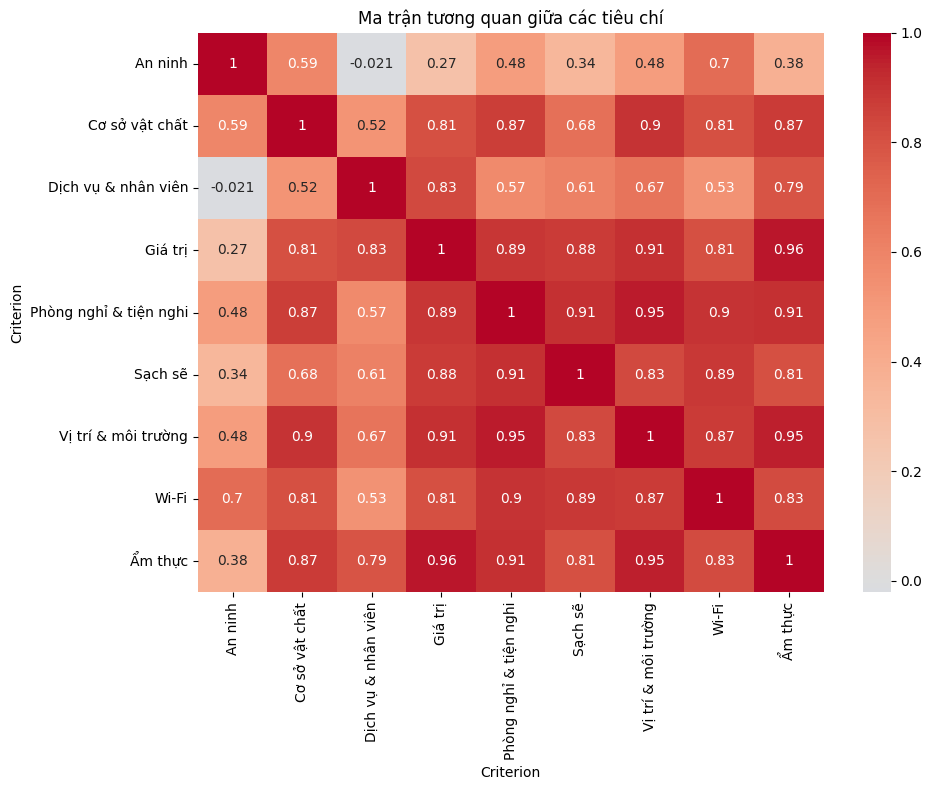

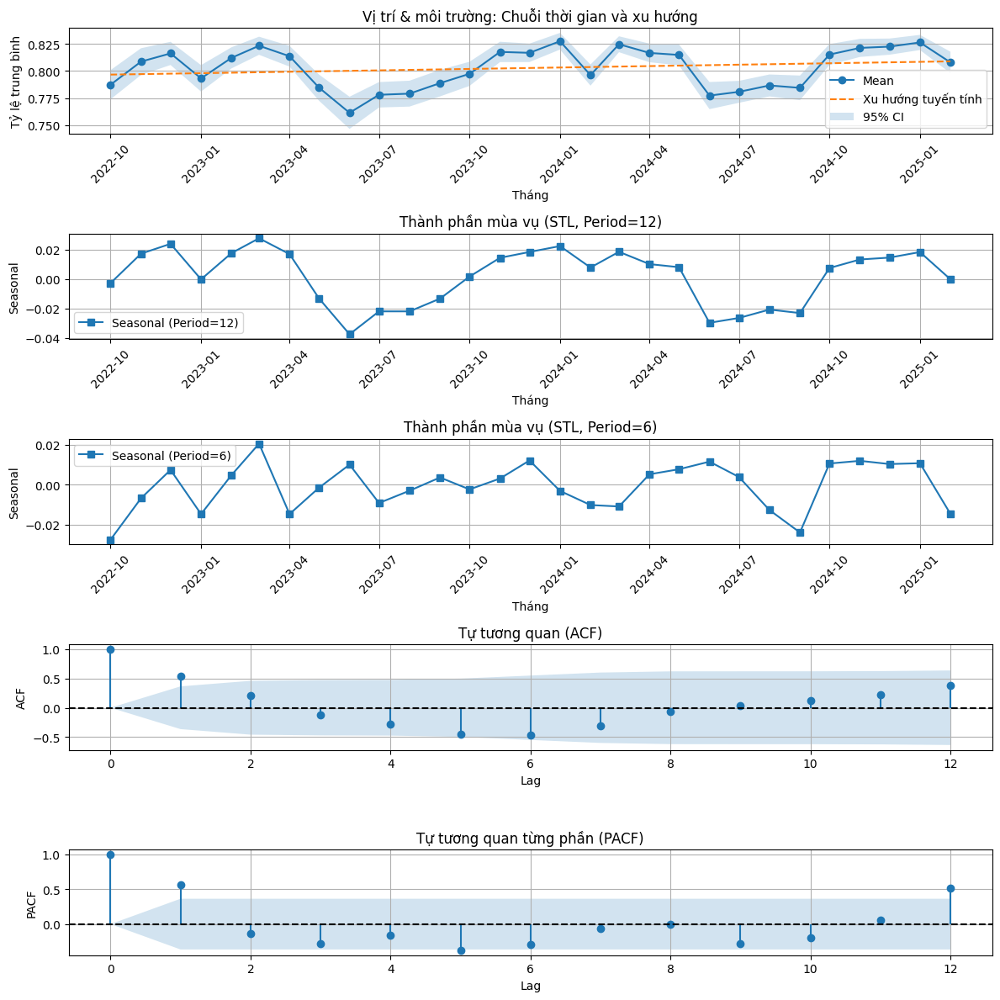

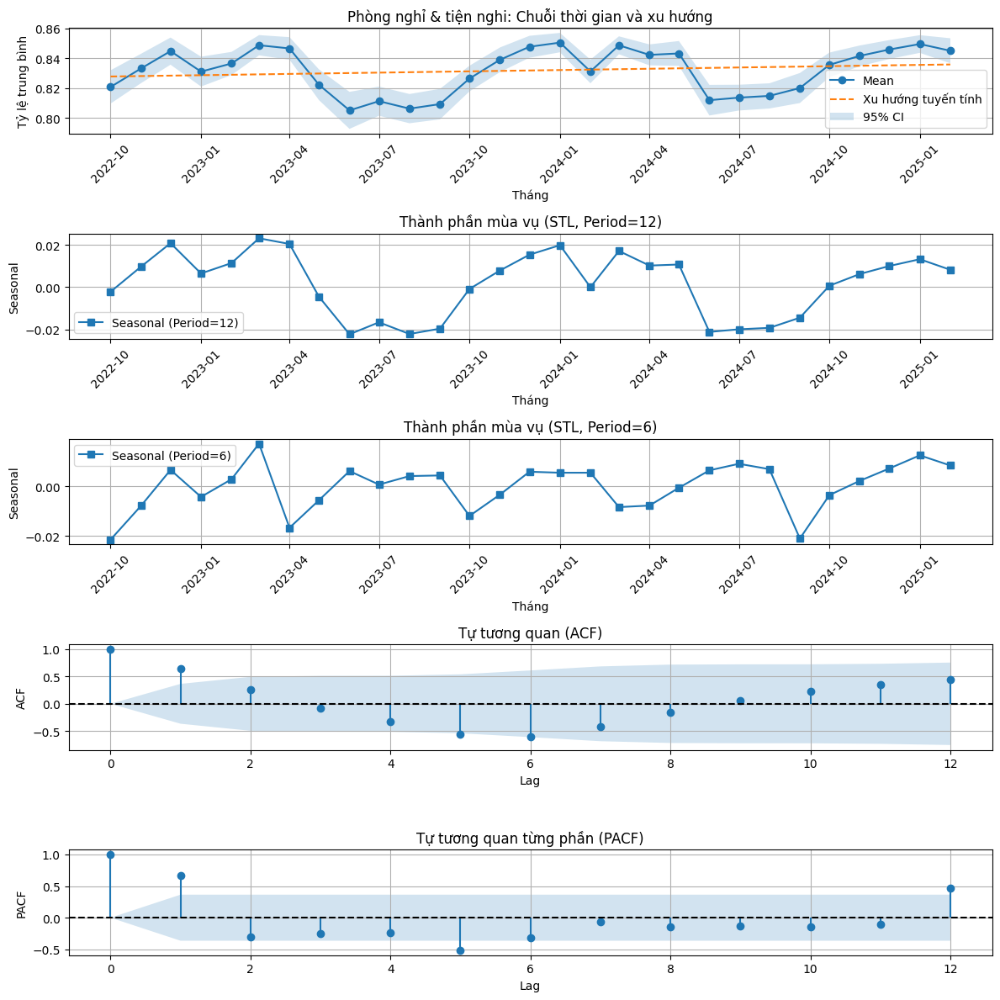

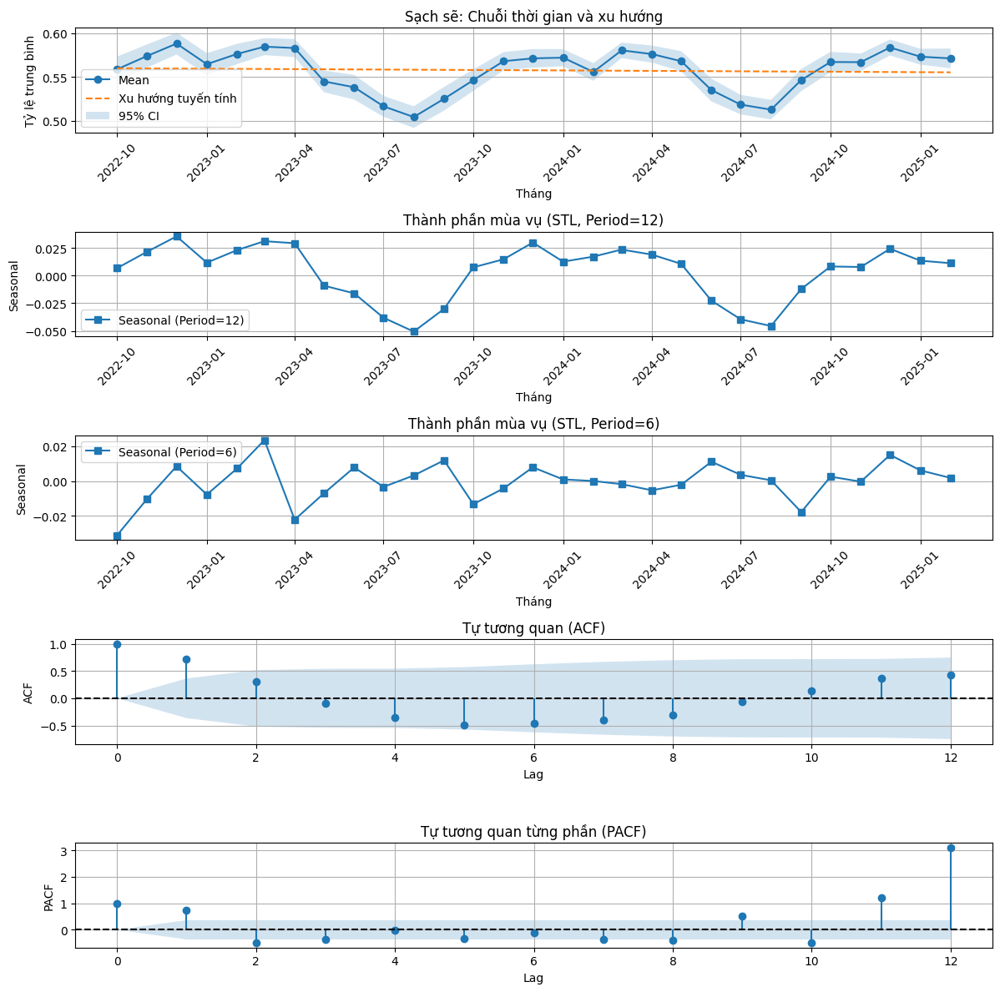

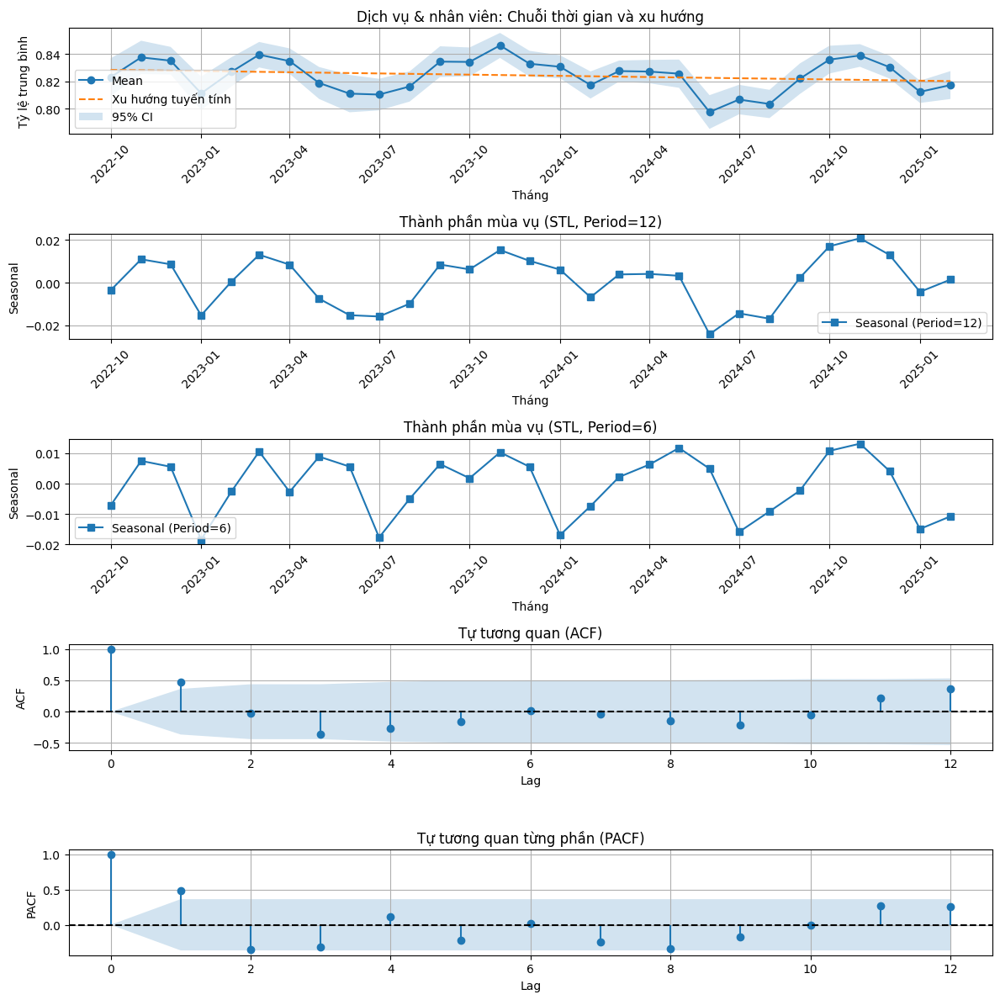

...

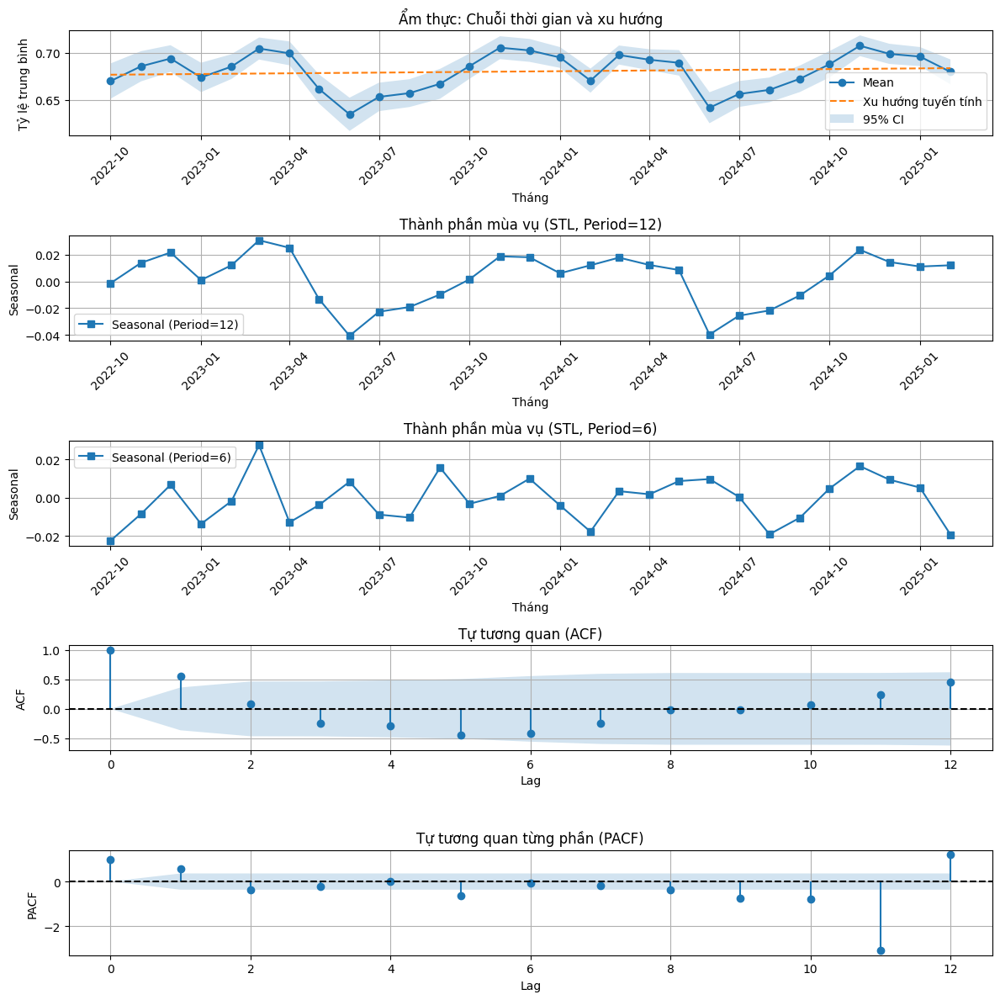

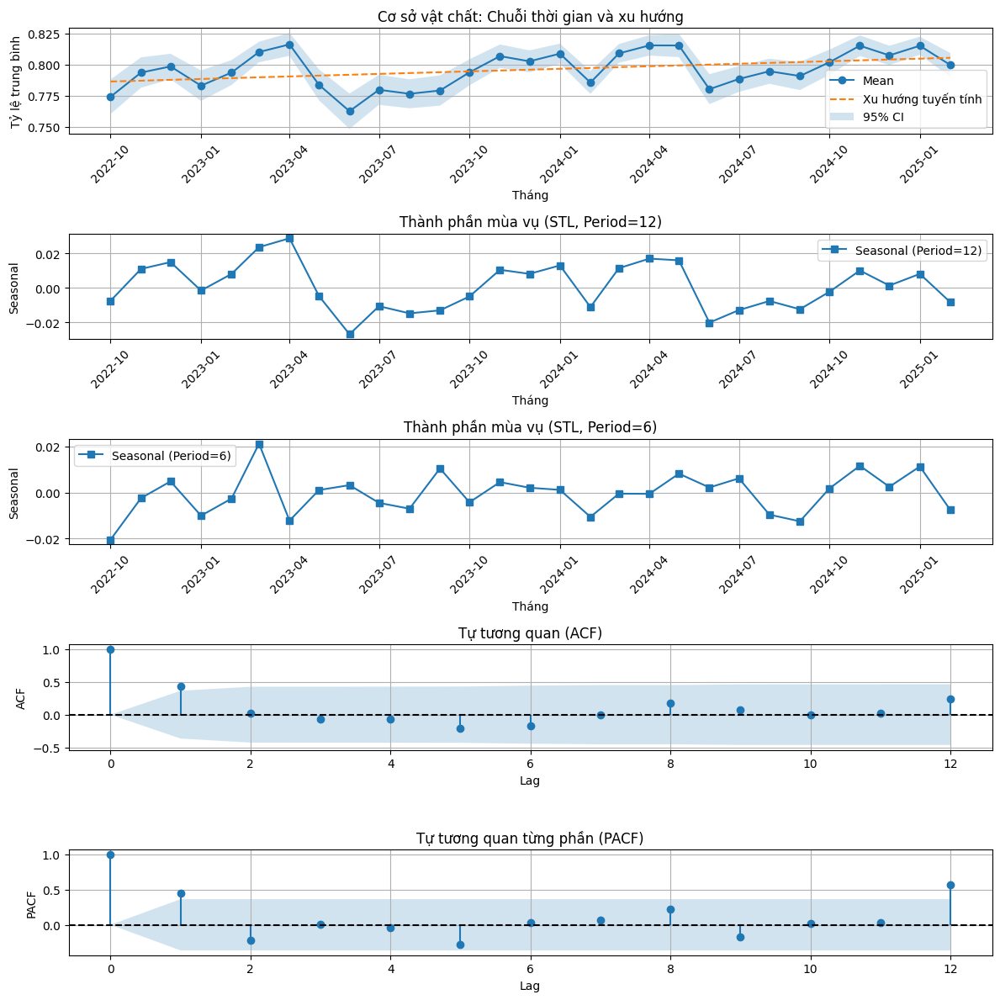

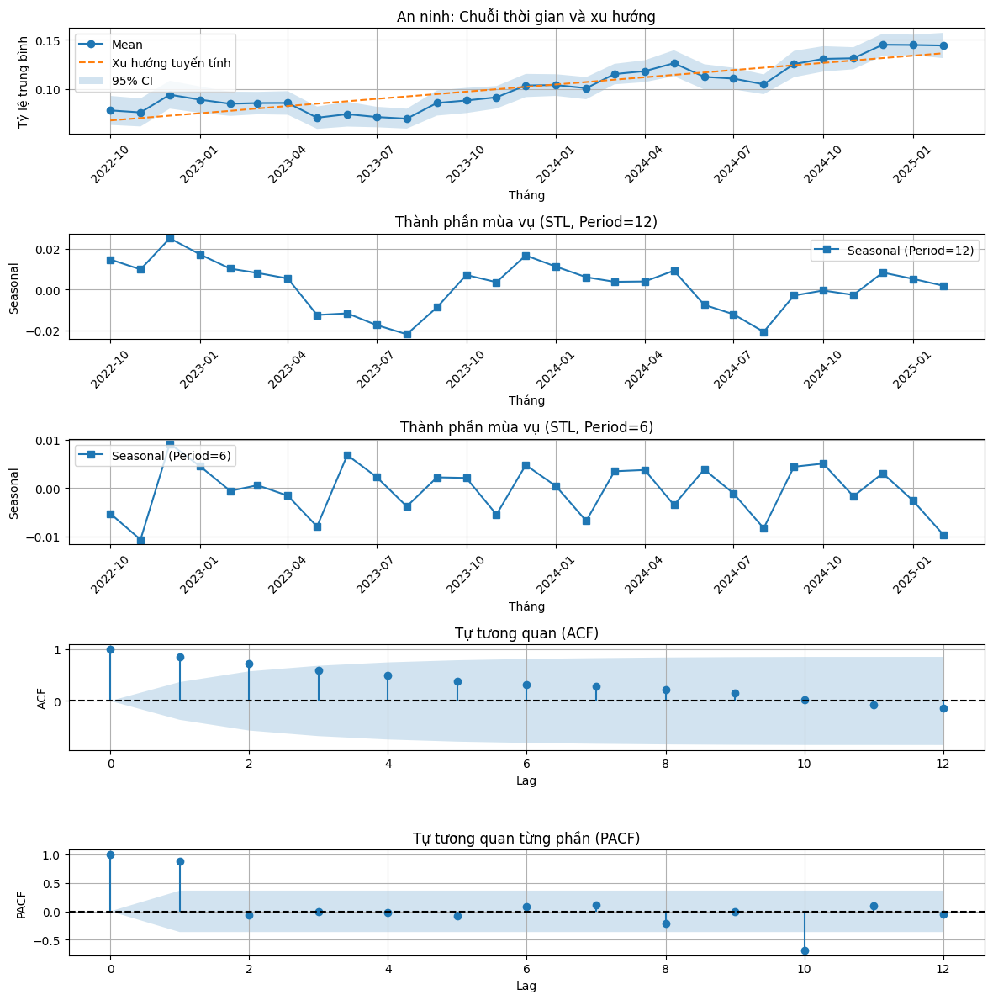

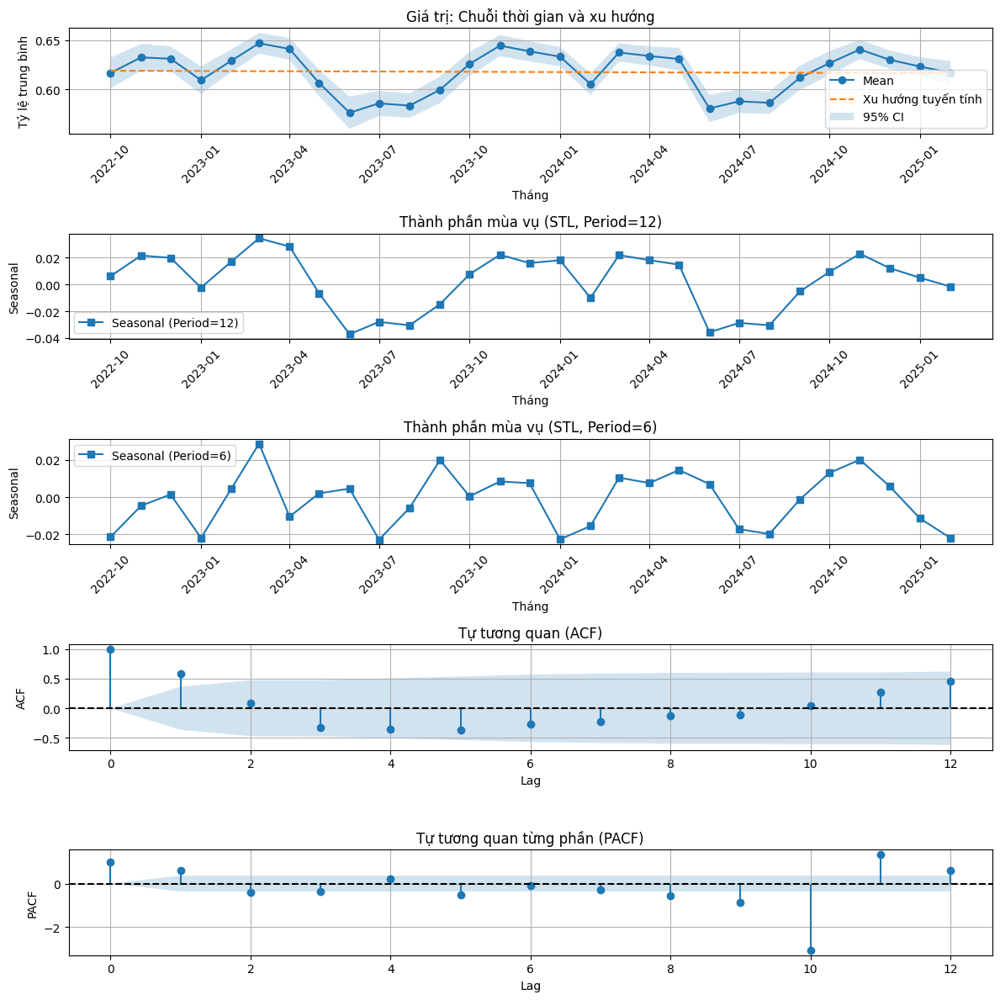

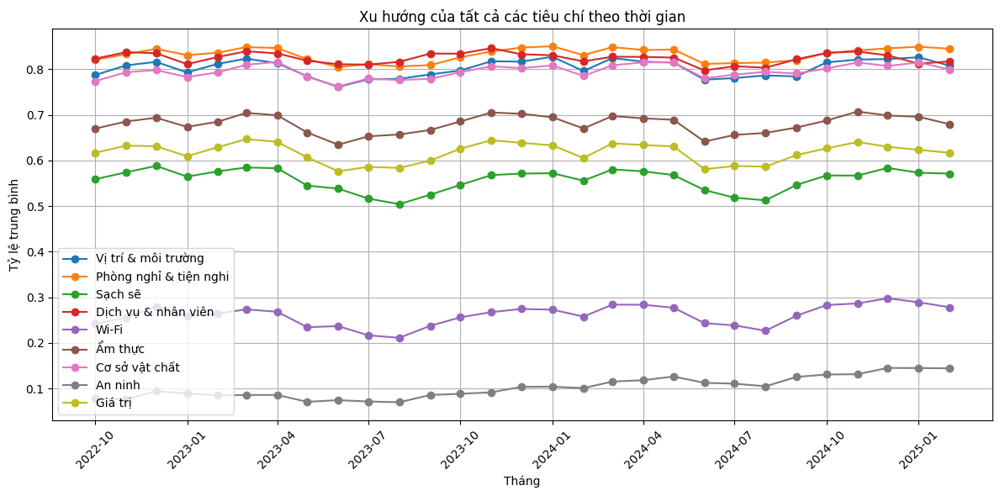

In [26]:


def calculate_summary_stats(df):
    """Tính toán thống kê tóm tắt từ dữ liệu gốc cho mỗi tiêu chí theo tháng."""
    # Danh sách các tiêu chí
    criteria_cols = [col for col in df.columns if '_ratio' in col]
    criteria = [col.replace('_ratio', '') for col in criteria_cols]
    
    # Tạo danh sách để lưu kết quả
    summary_data = []
    
    # Nhóm theo year_month
    grouped = df.groupby('year_month')
    
    for month, group in grouped:
        n_hotels = len(group)
        for criterion, col in zip(criteria, criteria_cols):
            ratios = group[col].dropna()
            if len(ratios) > 0:
                mean = ratios.mean()
                std = ratios.std()
                # Tính khoảng tin cậy 95%
                se = std / np.sqrt(len(ratios))
                ci_lower, ci_upper = stats.t.interval(0.95, len(ratios)-1, loc=mean, scale=se)
                # Bootstrap mean và CI
                bootstrap_means = [np.mean(np.random.choice(ratios, size=len(ratios), replace=True)) for _ in range(1000)]
                bootstrap_mean = np.mean(bootstrap_means)
                bootstrap_ci_lower, bootstrap_ci_upper = np.percentile(bootstrap_means, [2.5, 97.5])
                # Subsampling SD
                subsampling_sd = np.std(bootstrap_means)
                
                summary_data.append({
                    'year_month': month,
                    'Criterion': criterion,
                    'N_Hotels': n_hotels,
                    'Mean': mean,
                    'Std': std,
                    'CI_Lower': ci_lower,
                    'CI_Upper': ci_upper,
                    'Bootstrap_Mean': bootstrap_mean,
                    'Bootstrap_CI_Lower': bootstrap_ci_lower,
                    'Bootstrap_CI_Upper': bootstrap_ci_upper,
                    'Subsampling_SD': subsampling_sd
                })
    
    return pd.DataFrame(summary_data)

def analyze_time_series_patterns_enhanced(results_df, output_dir='output', periods=[12, 6]):
    """Phân tích xu hướng, mùa vụ, tính độc lập và mẫu hình của các tiêu chí theo thời gian."""
    # Tạo thư mục đầu ra
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Đảm bảo year_month là datetime
    results_df['year_month'] = pd.to_datetime(results_df['year_month'])
    
    # Danh sách tiêu chí
    criteria = results_df['Criterion'].unique()
    
    # Khởi tạo danh sách lưu kết quả kiểm định
    test_results = []
    
    # Phân tích tương quan giữa các tiêu chí
    pivot_df = results_df.pivot_table(index='year_month', columns='Criterion', values='Mean')
    correlation_matrix = pivot_df.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
    plt.title('Ma trận tương quan giữa các tiêu chí')
    plt.tight_layout()
    corr_plot_path = os.path.join(output_dir, 'criteria_correlation_heatmap.png')
    plt.show()
    plt.close()
    
    # A/B testing giữa 2022 và 2023
    ab_test_results = []
    for criterion in criteria:
        df_criterion = results_df[results_df['Criterion'] == criterion]
        data_2022 = df_criterion[df_criterion['year_month'].dt.year == 2022]['Mean'].dropna()
        data_2023 = df_criterion[df_criterion['year_month'].dt.year == 2023]['Mean'].dropna()
        if len(data_2022) > 0 and len(data_2023) > 0:
            stat, p_value = mannwhitneyu(data_2022, data_2023, alternative='two-sided')
            ab_test_results.append({
                'Criterion': criterion,
                'MannWhitneyU_Stat': stat,
                'P_Value': p_value,
                'Mean_2022': data_2022.mean(),
                'Mean_2023': data_2023.mean()
            })
    
    ab_test_df = pd.DataFrame(ab_test_results)
    ab_test_path = os.path.join(output_dir, 'ab_test_results.csv')
    ab_test_df.to_csv(ab_test_path, index=False)
    
    for criterion in criteria:
        # Lọc dữ liệu cho tiêu chí
        df_criterion = results_df[results_df['Criterion'] == criterion].sort_values('year_month')
        if len(df_criterion) < 3:
            continue
        
        # Chuẩn bị dữ liệu
        time_series = df_criterion['Mean'].values
        time_index = df_criterion['year_month']
        n = len(time_series)
        
        # 1. Hồi quy tuyến tính
        time_numeric = np.arange(n)
        X = sm.add_constant(time_numeric)
        model = OLS(time_series, X).fit()
        slope = model.params[1]
        p_value_slope = model.pvalues[1]
        trend_linear = 'Tăng' if slope > 0 and p_value_slope < 0.05 else 'Giảm' if slope < 0 and p_value_slope < 0.05 else 'Không rõ'
        
        # Hồi quy đa thức bậc 2
        X_poly = sm.add_constant(np.column_stack((time_numeric, time_numeric**2)))
        model_poly = OLS(time_series, X_poly).fit()
        p_value_poly = model_poly.pvalues[2]
        
        # Kiểm tra giả định phần dư
        shapiro_pvalue = shapiro(model.resid)[1]
        resid_normality = shapiro_pvalue > 0.05
        bp_test = het_breuschpagan(model.resid, X)
        resid_homoscedasticity = bp_test[1] > 0.05
        
        # 2. Kiểm tra Mann-Kendall
        mk_result = original_test(time_series)
        trend_mk = mk_result.trend
        p_value_mk = mk_result.p
        
        # 3. Phân rã STL cho các chu kỳ
        seasonal_results = {}
        for period in periods:
            if n >= 2 * period:
                try:
                    stl = STL(time_series, period=period, robust=True).fit()
                    seasonal_strength = np.var(stl.seasonal) / np.var(time_series)
                    has_seasonality = seasonal_strength > 0.1
                    seasonal_results[period] = {'strength': seasonal_strength, 'has_seasonality': has_seasonality, 'stl': stl}
                except:
                    seasonal_results[period] = {'strength': np.nan, 'has_seasonality': False, 'stl': None}
            else:
                seasonal_results[period] = {'strength': np.nan, 'has_seasonality': False, 'stl': None}
        
        # 4. Kiểm tra tự tương quan (ACF) và PACF
        acf_values, acf_confint = acf(time_series, nlags=min(12, n-1), alpha=0.05)
        pacf_values, pacf_confint = pacf(time_series, nlags=min(12, n-1), alpha=0.05)
        acf_lag12 = acf_values[12] if len(acf_values) > 12 else np.nan
        acf_lag12_significant = abs(acf_lag12) > acf_confint[12, 1] / 1.96 if len(acf_confint) > 12 else False
        
        # 5. Kiểm tra Durbin-Watson
        dw_stat = durbin_watson(model.resid)
        dw_interpretation = 'Tự tương quan dương' if dw_stat < 1.5 else 'Tự tương quan âm' if dw_stat > 2.5 else 'Gần độc lập'
        
        # 6. Kiểm tra Ljung-Box
        lb_results = acorr_ljungbox(time_series, lags=[min(12, n-1)], return_df=True)
        lb_pvalue = lb_results['lb_pvalue'].iloc[-1]
        lb_independent = lb_pvalue > 0.05
        
        # 7. Kiểm tra tính dừng (ADF và KPSS)
        adf_result = adfuller(time_series)
        adf_pvalue = adf_result[1]
        adf_stationary = adf_pvalue < 0.05
        kpss_result = kpss(time_series, regression='c')
        kpss_stat = kpss_result[0]
        kpss_pvalue = kpss_result[1]
        kpss_stationary = kpss_pvalue > 0.05
        
        # Lưu kết quả
        result = {
            'Criterion': criterion,
            'Trend_Linear': trend_linear,
            'Slope_Linear': slope,
            'P_Value_Linear': p_value_slope,
            'P_Value_Poly': p_value_poly,
            'Resid_Normality': resid_normality,
            'Resid_Homoscedasticity': resid_homoscedasticity,
            'Trend_MannKendall': trend_mk,
            'P_Value_MK': p_value_mk,
            'ACF_Lag12': acf_lag12,
            'ACF_Lag12_Significant': acf_lag12_significant,
            'Durbin_Watson': dw_stat,
            'DW_Interpretation': dw_interpretation,
            'Ljung_Box_PValue': lb_pvalue,
            'Independent': lb_independent,
            'ADF_PValue': adf_pvalue,
            'ADF_Stationary': adf_stationary,
            'KPSS_PValue': kpss_pvalue,
            'KPSS_Stationary': kpss_stationary
        }
        for period in periods:
            result[f'Seasonal_Strength_Period_{period}'] = seasonal_results[period]['strength']
            result[f'Has_Seasonality_Period_{period}'] = seasonal_results[period]['has_seasonality']
        test_results.append(result)
        
        # Vẽ biểu đồ phân tích
        plt.figure(figsize=(12, 12))
        
        # Chuỗi thời gian và xu hướng
        plt.subplot(5, 1, 1)
        plt.plot(time_index, time_series, marker='o', label='Mean')
        plt.plot(time_index, model.fittedvalues, linestyle='--', label='Xu hướng tuyến tính')
        plt.fill_between(time_index, df_criterion['CI_Lower'], df_criterion['CI_Upper'], alpha=0.2, label='95% CI')
        plt.title(f'{criterion}: Chuỗi thời gian và xu hướng')
        plt.xlabel('Tháng')
        plt.ylabel('Tỷ lệ trung bình')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.legend()
        
        # Thành phần mùa vụ STL
        for i, period in enumerate(periods, 2):
            if seasonal_results[period]['stl'] is not None:
                plt.subplot(5, 1, i)
                plt.plot(time_index, seasonal_results[period]['stl'].seasonal, marker='s', label=f'Seasonal (Period={period})')
                plt.title(f'Thành phần mùa vụ (STL, Period={period})')
                plt.xlabel('Tháng')
                plt.ylabel('Seasonal')
                plt.xticks(rotation=45)
                plt.grid(True)
                plt.legend()
        
        # ACF
        plt.subplot(5, 1, 4)
        plt.stem(range(min(13, n)), acf_values[:min(13, n)], basefmt=' ')
        plt.fill_between(range(min(13, n)), acf_confint[:min(13, n), 0] - acf_values[:min(13, n)], 
                         acf_confint[:min(13, n), 1] - acf_values[:min(13, n)], alpha=0.2)
        plt.axhline(0, color='black', linestyle='--')
        plt.title('Tự tương quan (ACF)')
        plt.xlabel('Lag')
        plt.ylabel('ACF')
        plt.grid(True)
        
        # PACF
        plt.subplot(5, 1, 5)
        plt.stem(range(min(13, n)), pacf_values[:min(13, n)], basefmt=' ')
        plt.fill_between(range(min(13, n)), pacf_confint[:min(13, n), 0] - pacf_values[:min(13, n)], 
                         pacf_confint[:min(13, n), 1] - pacf_values[:min(13, n)], alpha=0.2)
        plt.axhline(0, color='black', linestyle='--')
        plt.title('Tự tương quan từng phần (PACF)')
        plt.xlabel('Lag')
        plt.ylabel('PACF')
        plt.grid(True)
        
        plt.tight_layout()
        plot_path = os.path.join(output_dir, f'time_series_analysis_{criterion.replace(" ", "_")}.png')
        plt.show()
        plt.close()
    
    # Tạo DataFrame kết quả
    results_summary = pd.DataFrame(test_results)
    
    # Lưu kết quả vào CSV
    output_path = os.path.join(output_dir, 'time_series_result_enhanced.csv')
    results_summary.to_csv(output_path, index=False)
    
    # Vẽ biểu đồ tổng hợp
    plt.figure(figsize=(12, 6))
    for criterion in criteria:
        df_criterion = results_df[results_df['Criterion'] == criterion].sort_values('year_month')
        if len(df_criterion) >= 2:
            plt.plot(df_criterion['year_month'], df_criterion['Mean'], marker='o', label=criterion)
    plt.title('Xu hướng của tất cả các tiêu chí theo thời gian')
    plt.xlabel('Tháng')
    plt.ylabel('Tỷ lệ trung bình')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    all_criteria_plot_path = os.path.join(output_dir, 'all_criteria_plot.pdf')
    plt.show()
    plt.close()
    
    return results_summary, correlation_matrix, ab_test_df


results_df = calculate_summary_stats(results_df_drop_month)


summary_df, corr_matrix, ab_test_df = analyze_time_series_patterns_enhanced(results_df, periods=[12, 6])


In [27]:
summary_df

,Criterion,Trend_Linear,Slope_Linear,P_Value_Linear,P_Value_Poly,Resid_Normality,Resid_Homoscedasticity,Trend_MannKendall,P_Value_MK,ACF_Lag12,...,Ljung_Box_PValue,Independent,ADF_PValue,ADF_Stationary,KPSS_PValue,KPSS_Stationary,Seasonal_Strength_Period_12,Has_Seasonality_Period_12,Seasonal_Strength_Period_6,Has_Seasonality_Period_6
0,Vị trí & môi trường,Không rõ,0.000436,2.994800e-01,0.342094,False,True,no trend,2.373018e-01,0.382775,...,8.120121e-06,False,0.040384,True,0.100000,True,1.013661,True,0.408864,True
1,Phòng nghỉ & tiện nghi,Không rõ,0.000289,3.997646e-01,0.231328,False,True,no trend,2.373018e-01,0.438188,...,1.217074e-10,False,0.053032,False,0.100000,True,0.975528,True,0.401768,True
2,Sạch sẽ,Không rõ,-0.000165,7.638381e-01,0.053626,False,True,no trend,7.215387e-01,0.429328,...,2.979796e-10,False,0.066197,False,0.100000,True,1.062845,True,0.222719,True
3,Dịch vụ & nhân viên,Không rõ,-0.000294,2.875265e-01,0.965129,True,True,no trend,1.955597e-01,0.369129,...,5.866794e-03,False,0.002627,True,0.100000,True,0.923480,True,0.660463,True
4,Wi-Fi,Tăng,0.000984,4.970042e-02,0.101362,False,True,increasing,1.720610e-02,0.296946,...,6.040692e-05,False,0.884837,False,0.100000,True,0.937254,True,0.266881,True
5,Ẩm thực,Không rõ,0.000248,5.843213e-01,0.420637,True,True,no trend,5.114818e-01,0.455867,...,6.207721e-06,False,0.001285,True,0.100000,True,0.927504,True,0.369347,True
6,Cơ sở vật chất,Tăng,0.000680,3.467504e-02,0.716013,True,True,increasing,3.403465e-02,0.243418,...,3.082546e-01,True,0.011352,True,0.100000,True,0.866166,True,0.361925,True
7,An ninh,Tăng,0.002442,1.895945e-10,0.000645,True,True,increasing,2.036407e-07,-0.146394,...,1.031623e-11,False,0.911338,False,0.010775,False,0.249866,True,0.049091,False
8,Giá trị,Không rõ,-0.000089,8.554715e-01,0.386585,False,True,no trend,7.215387e-01,0.459673,...,7.358873e-06,False,0.022041,True,0.100000,True,0.970415,True,0.474835,True


In [28]:
corr_matrix

Criterion,An ninh,Cơ sở vật chất,Dịch vụ & nhân viên,Giá trị,Phòng nghỉ & tiện nghi,Sạch sẽ,Vị trí & môi trường,Wi-Fi,Ẩm thực
Criterion,,,,,,,,,
An ninh,1.000000,0.586191,-0.021057,0.268348,0.479681,0.340248,0.479341,0.695714,0.375346
Cơ sở vật chất,0.586191,1.000000,0.524217,0.812050,0.869547,0.682955,0.901630,0.807379,0.874401
Dịch vụ & nhân viên,-0.021057,0.524217,1.000000,0.833452,0.570187,0.612402,0.666657,0.532647,0.790835
Giá trị,0.268348,0.812050,0.833452,1.000000,0.893880,0.876116,0.907781,0.810720,0.964987
Phòng nghỉ & tiện nghi,0.479681,0.869547,0.570187,0.893880,1.000000,0.909130,0.952686,0.899754,0.906940
Sạch sẽ,0.340248,0.682955,0.612402,0.876116,0.909130,1.000000,0.834884,0.886492,0.809431
Vị trí & môi trường,0.479341,0.901630,0.666657,0.907781,0.952686,0.834884,1.000000,0.873674,0.949885
Wi-Fi,0.695714,0.807379,0.532647,0.810720,0.899754,0.886492,0.873674,1.000000,0.826474
Ẩm thực,0.375346,0.874401,0.790835,0.964987,0.906940,0.809431,0.949885,0.826474,1.000000


In [19]:
results_df

,year_month,Criterion,N_Hotels,Mean,Std,CI_Lower,CI_Upper,Bootstrap_Mean,Bootstrap_CI_Lower,Bootstrap_CI_Upper,Subsampling_SD
0,2022-05-01,Vị trí & môi trường,267,0.704301,0.174950,0.683316,0.725286,0.704375,0.683559,0.725142,0.032022
1,2022-05-01,Phòng nghỉ & tiện nghi,267,0.779589,0.146233,0.762049,0.797129,0.779595,0.761814,0.796449,0.028255
2,2022-05-01,Sạch sẽ,267,0.504972,0.170018,0.484579,0.525366,0.505107,0.484972,0.525406,0.032184
3,2022-05-01,Dịch vụ & nhân viên,267,0.750697,0.161724,0.731299,0.770095,0.750566,0.731453,0.770008,0.029825
4,2022-05-01,Wi-Fi,267,0.162669,0.146057,0.145150,0.180188,0.162748,0.145378,0.180310,0.027324
...,...,...,...,...,...,...,...,...,...,...,...
301,2025-02-01,Wi-Fi,788,0.278123,0.174619,0.265931,0.290315,0.278127,0.265817,0.290742,0.018594
302,2025-02-01,Ẩm thực,788,0.679589,0.188720,0.666412,0.692765,0.679636,0.666468,0.692758,0.020050
303,2025-02-01,Cơ sở vật chất,788,0.799535,0.137843,0.789911,0.809160,0.799566,0.789859,0.809053,0.014862
304,2025-02-01,An ninh,788,0.144340,0.183273,0.131544,0.157136,0.144323,0.131697,0.157156,0.020148


#### **Phân tích tỉ lệ của từng tiêu chí theo dữ liệu thời gian**

In [20]:
exclude_dates = ['2022-02-01', '2022-03-01', '2022-04-01', '2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2025-03-01']
results_df_drop_month = results_df[~results_df['year_month'].isin(exclude_dates)].copy()

In [22]:
results_df_drop_month

,year_month,Criterion,N_Hotels,Mean,Std,CI_Lower,CI_Upper,Bootstrap_Mean,Bootstrap_CI_Lower,Bootstrap_CI_Upper,Subsampling_SD
45,2022-10-01,Vị trí & môi trường,411,0.787301,0.139069,0.773856,0.800746,0.787318,0.773828,0.800495,0.019517
46,2022-10-01,Phòng nghỉ & tiện nghi,411,0.820727,0.115340,0.809576,0.831877,0.820820,0.809546,0.831753,0.016887
47,2022-10-01,Sạch sẽ,411,0.558834,0.149731,0.544358,0.573310,0.558798,0.544546,0.573068,0.022382
48,2022-10-01,Dịch vụ & nhân viên,411,0.823109,0.141960,0.809385,0.836834,0.823144,0.809123,0.836505,0.020947
49,2022-10-01,Wi-Fi,411,0.241946,0.161677,0.226316,0.257577,0.241986,0.226453,0.257424,0.024629
...,...,...,...,...,...,...,...,...,...,...,...
301,2025-02-01,Wi-Fi,788,0.278123,0.174619,0.265931,0.290315,0.278127,0.265817,0.290742,0.018594
302,2025-02-01,Ẩm thực,788,0.679589,0.188720,0.666412,0.692765,0.679636,0.666468,0.692758,0.020050
303,2025-02-01,Cơ sở vật chất,788,0.799535,0.137843,0.789911,0.809160,0.799566,0.789859,0.809053,0.014862
304,2025-02-01,An ninh,788,0.144340,0.183273,0.131544,0.157136,0.144323,0.131697,0.157156,0.020148


In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency, f_oneway
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller, kpss
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')

def calculate_proportions(df):
    """Tính tỷ lệ của từng tiêu chí dựa trên Mean."""
    # Pivot để lấy Mean của mỗi tiêu chí theo tháng
    pivot_df = df.pivot_table(index='year_month', columns='Criterion', values='Mean')
    
    # Tính tổng Mean mỗi tháng
    pivot_df['Total_Mean'] = pivot_df.sum(axis=1)
    
    # Tính tỷ lệ
    criteria = pivot_df.columns[:-1]  # Loại bỏ Total_Mean
    for criterion in criteria:
        pivot_df[f'{criterion}_Proportion'] = pivot_df[criterion] / pivot_df['Total_Mean']
    
    # Tạo DataFrame tỷ lệ
    proportion_cols = [f'{criterion}_Proportion' for criterion in criteria]
    proportion_df = pivot_df[proportion_cols].reset_index()
    proportion_df['year_month'] = pd.to_datetime(proportion_df['year_month'])
    
    return proportion_df

def test_proportion_stability(proportion_df, output_dir='output_proportions'):
    """Kiểm định tính ổn định, độc lập, và đại diện của tỷ lệ."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    criteria = [col.replace('_Proportion', '') for col in proportion_df.columns if '_Proportion' in col]
    test_results = []
    
    # Ma trận tương quan giữa các tỷ lệ
    plt.figure(figsize=(10, 8))
    sns.heatmap(proportion_df.drop('year_month', axis=1).corr(), annot=True, cmap='coolwarm', center=0)
    plt.title('Ma trận tương quan giữa tỷ lệ các tiêu chí')
    plt.tight_layout()
    corr_plot_path = os.path.join(output_dir, 'proportion_correlation_heatmap.png')
    plt.show()
    plt.close()
    
    for criterion in criteria:
        prop_col = f'{criterion}_Proportion'
        time_series = proportion_df[prop_col].values
        time_index = proportion_df['year_month']
        n = len(time_series)
        
        # 1. Kiểm tra tính ổn định bằng ANOVA
        # Chia dữ liệu thành các nhóm (ví dụ: mỗi năm)
        groups = [proportion_df[prop_col][proportion_df['year_month'].dt.year == year].values 
                  for year in proportion_df['year_month'].dt.year.unique()]
        if all(len(g) > 0 for g in groups):
            f_stat, f_pvalue = f_oneway(*groups)
        else:
            f_stat, f_pvalue = np.nan, np.nan
        
        # 2. Kiểm tra độc lập bằng Ljung-Box
        lb_results = acorr_ljungbox(time_series, lags=[min(12, n-1)], return_df=True)
        lb_pvalue = lb_results['lb_pvalue'].iloc[-1]
        lb_independent = lb_pvalue > 0.05
        
        # 3. Kiểm tra tính dừng bằng ADF và KPSS
        adf_result = adfuller(time_series)
        adf_pvalue = adf_result[1]
        adf_stationary = adf_pvalue < 0.05
        kpss_result = kpss(time_series, regression='c')
        kpss_pvalue = kpss_result[1]
        kpss_stationary = kpss_pvalue > 0.05
        
        # 4. Đánh giá đại diện bằng khoảng tin cậy
        prop_mean = time_series.mean()
        prop_std = time_series.std(ddof=1)
        se = prop_std / np.sqrt(n)
        ci_lower, ci_upper = stats.t.interval(0.95, n-1, loc=prop_mean, scale=se)
        
        # Lưu kết quả
        test_results.append({
            'Criterion': criterion,
            'Proportion_Mean': prop_mean,
            'Proportion_Std': prop_std,
            'Proportion_CI_Lower': ci_lower,
            'Proportion_CI_Upper': ci_upper,
            'ANOVA_F_Stat': f_stat,
            'ANOVA_PValue': f_pvalue,
            'Stable_Proportion': f_pvalue > 0.05 if not np.isnan(f_pvalue) else False,
            'Ljung_Box_PValue': lb_pvalue,
            'Independent': lb_independent,
            'ADF_PValue': adf_pvalue,
            'ADF_Stationary': adf_stationary,
            'KPSS_PValue': kpss_pvalue,
            'KPSS_Stationary': kpss_stationary
        })
        
        # Biểu đồ tỷ lệ theo thời gian
        plt.figure(figsize=(10, 5))
        plt.plot(time_index, time_series, marker='o', label='Tỷ lệ')
        plt.fill_between(time_index, ci_lower, ci_upper, alpha=0.2, label='95% CI')
        plt.axhline(prop_mean, color='r', linestyle='--', label='Trung bình')
        plt.title(f'Tỷ lệ của {criterion} theo thời gian')
        plt.xlabel('Tháng')
        plt.ylabel('Tỷ lệ')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plot_path = os.path.join(output_dir, f'proportion_{criterion.replace(" ", "_")}.png')
        plt.show()
        plt.close()
    
    results_df = pd.DataFrame(test_results)
    output_path = os.path.join(output_dir, 'proportion_test_results.csv')
    results_df.to_csv(output_path, index=False)
    
    # Biểu đồ tổng hợp
    plt.figure(figsize=(12, 6))
    for criterion in criteria:
        plt.plot(proportion_df['year_month'], proportion_df[f'{criterion}_Proportion'], 
                 marker='o', label=criterion)
    plt.title('Tỷ lệ của các tiêu chí theo thời gian')
    plt.xlabel('Tháng')
    plt.ylabel('Tỷ lệ')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    all_plot_path = os.path.join(output_dir, 'all_proportions.pdf')
    plt.show()
    plt.close()
    
    return results_df, proportion_df


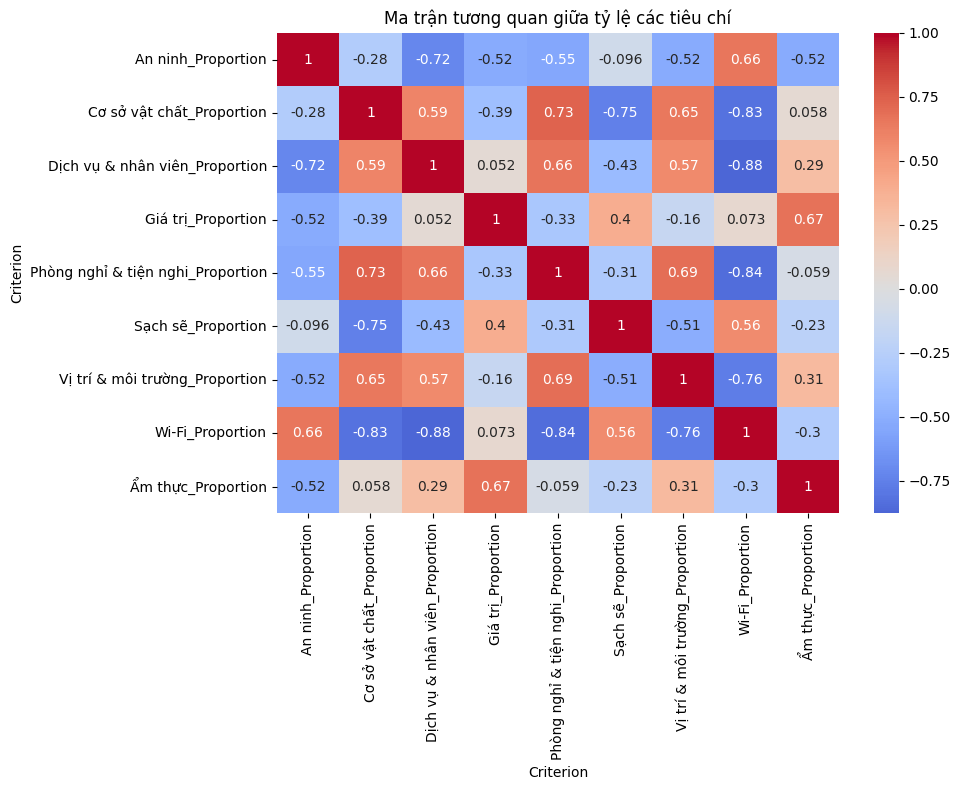

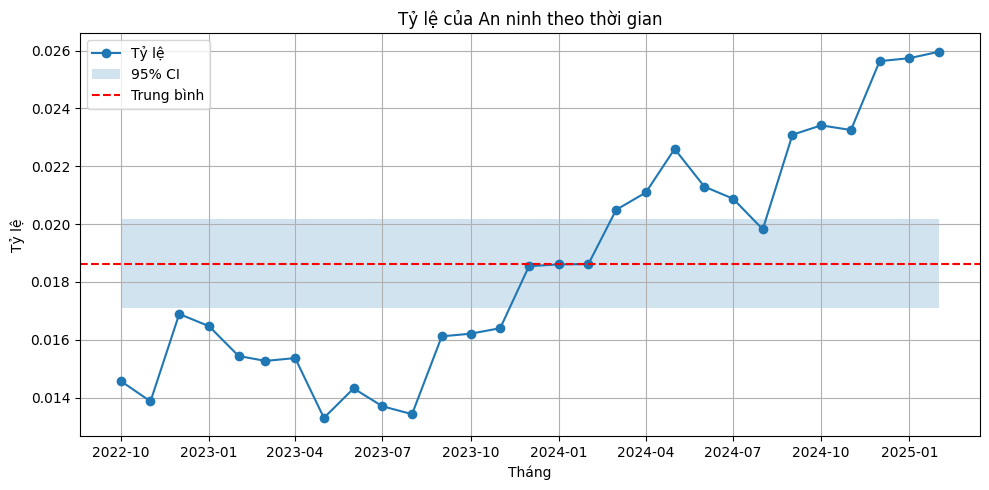

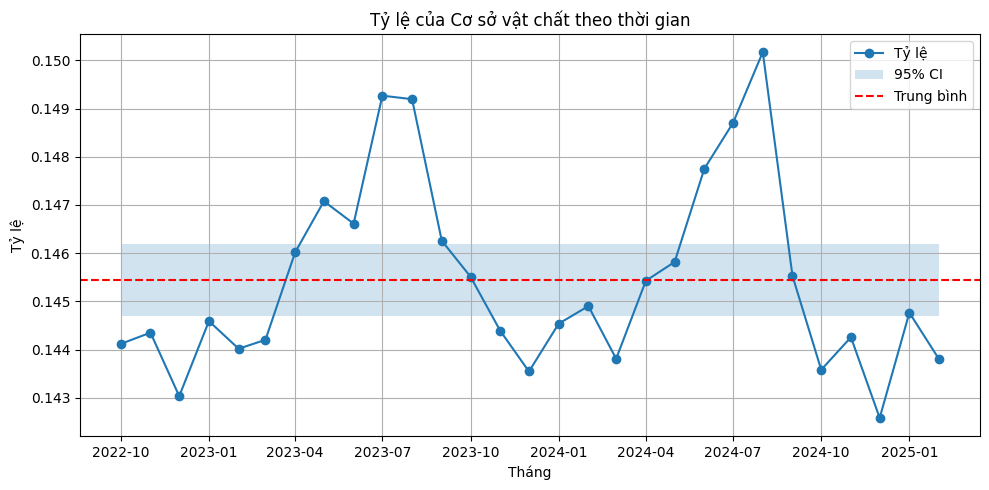

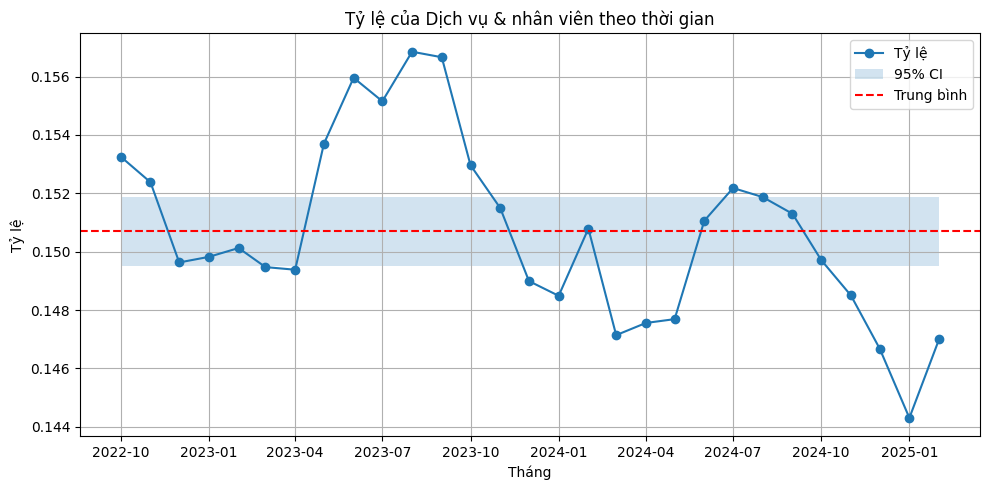

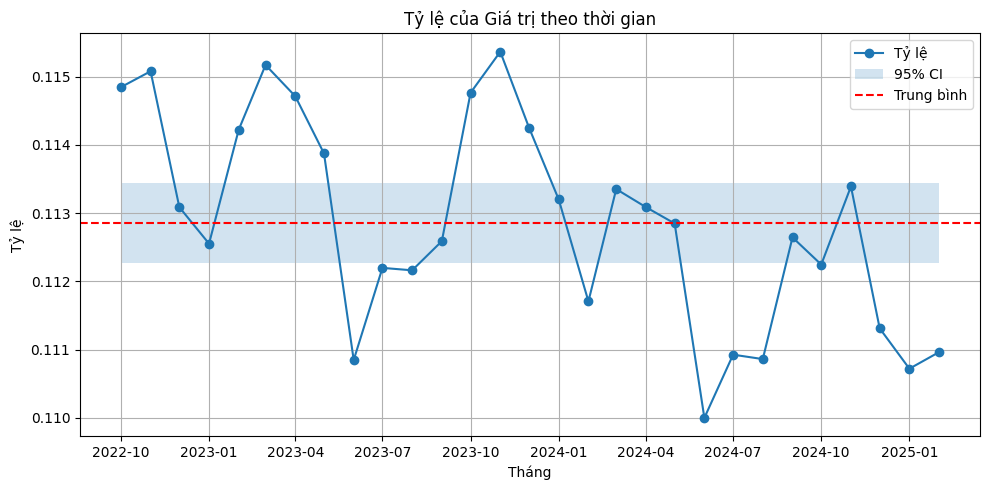

...

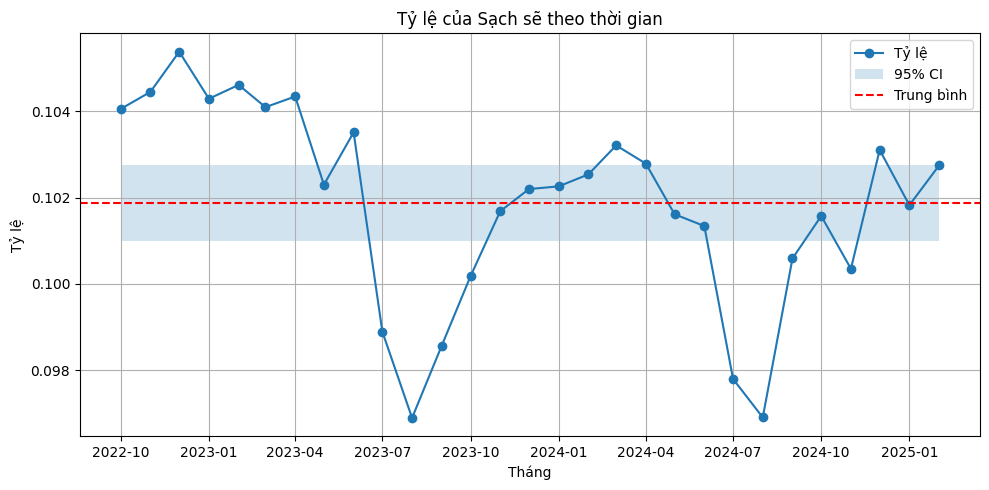

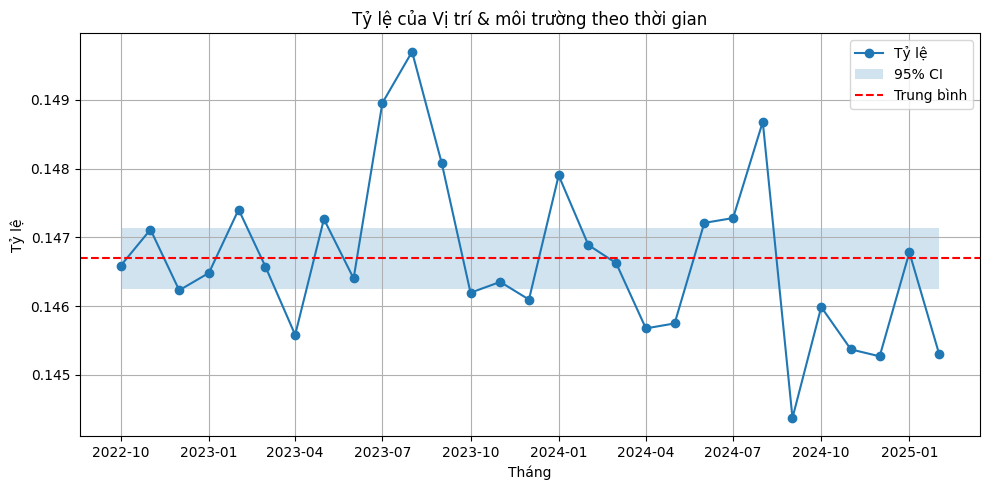

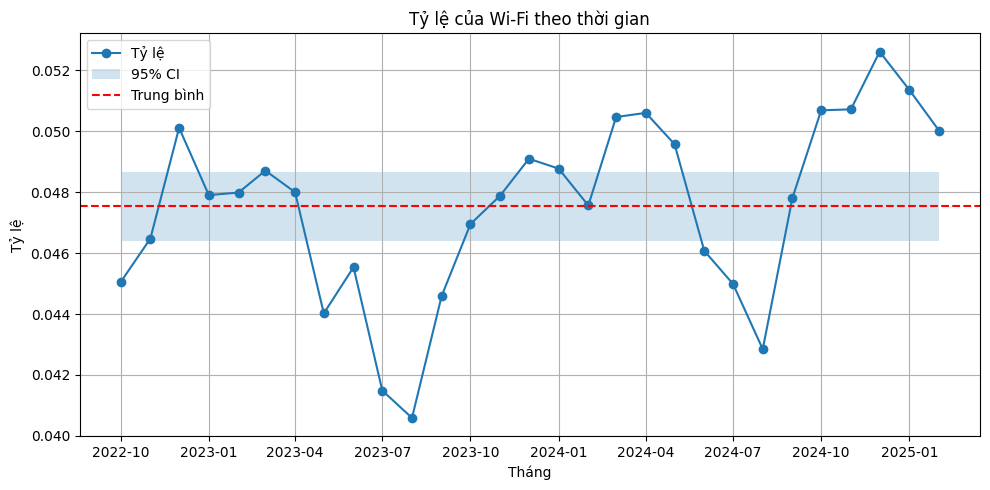

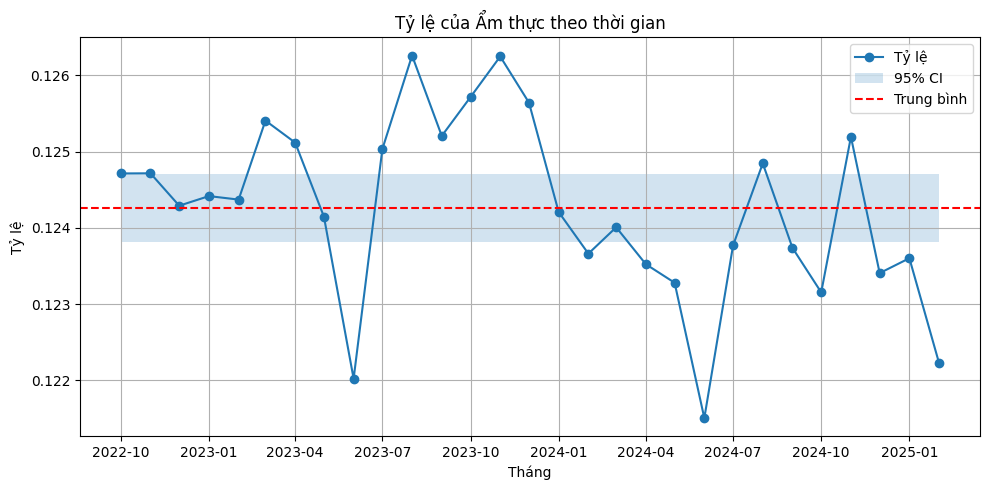

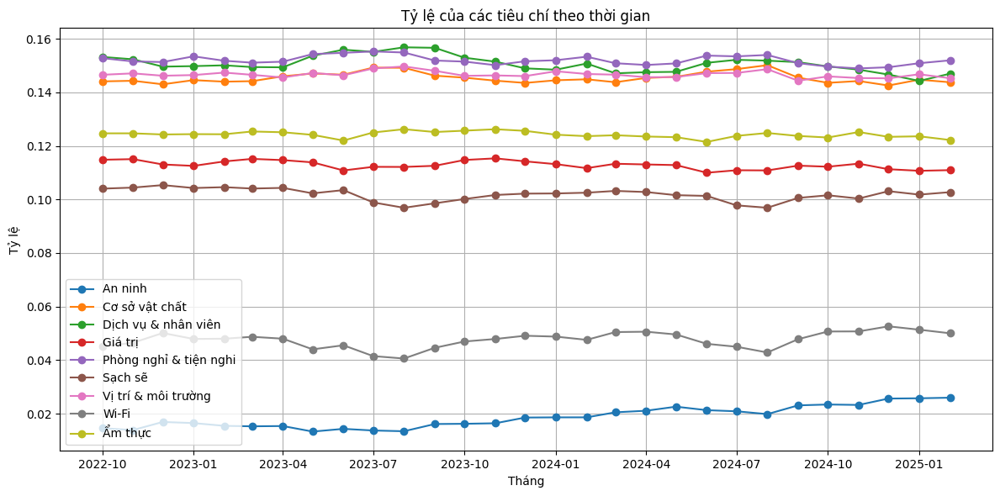

In [ ]:



# Chạy phân tích
results_df, proportion_df = test_proportion_stability(calculate_proportions(results_df_drop_month))


In [23]:
print("\n=== Kết quả kiểm định ===")
print(results_df.round(4))
print("\n=== Tỷ lệ các tiêu chí ===")
print(proportion_df.round(4))


=== Kết quả kiểm định ===
                Criterion  Proportion_Mean  Proportion_Std  \
0                 An ninh           0.0186          0.0040   
1          Cơ sở vật chất           0.1454          0.0020   
2     Dịch vụ & nhân viên           0.1507          0.0031   
3                 Giá trị           0.1129          0.0015   
4  Phòng nghỉ & tiện nghi           0.1520          0.0017   
5                 Sạch sẽ           0.1019          0.0023   
6     Vị trí & môi trường           0.1467          0.0012   
7                   Wi-Fi           0.0475          0.0030   
8                 Ẩm thực           0.1243          0.0012   

   Proportion_CI_Lower  Proportion_CI_Upper  ANOVA_F_Stat  ANOVA_PValue  \
0               0.0171               0.0202       39.0725        0.0000   
1               0.1447               0.1462        1.1287        0.3564   
2               0.1495               0.1519        6.1746        0.0027   
3               0.1123               0.1134        5

In [15]:
ratios_df_min_20 = calculate_criteria_ratios_by_month(reviewer_data, review_count=20)

100%|██████████| 54/54 [02:38<00:00,  2.93s/it]



Đã lưu kết quả vào: output\hotel_criteria_ratios_by_month.csv


In [17]:
results_df_min_20 = calculate_summary_stats(ratios_df_min_20)

In [18]:
exclude_dates = ['2022-02-01', '2022-03-01', '2022-04-01', '2022-05-01', '2022-06-01', '2022-07-01', '2022-08-01', '2022-09-01', '2025-03-01']
results_df_drop_month = results_df_min_20[~results_df_min_20['year_month'].isin(exclude_dates)].copy()

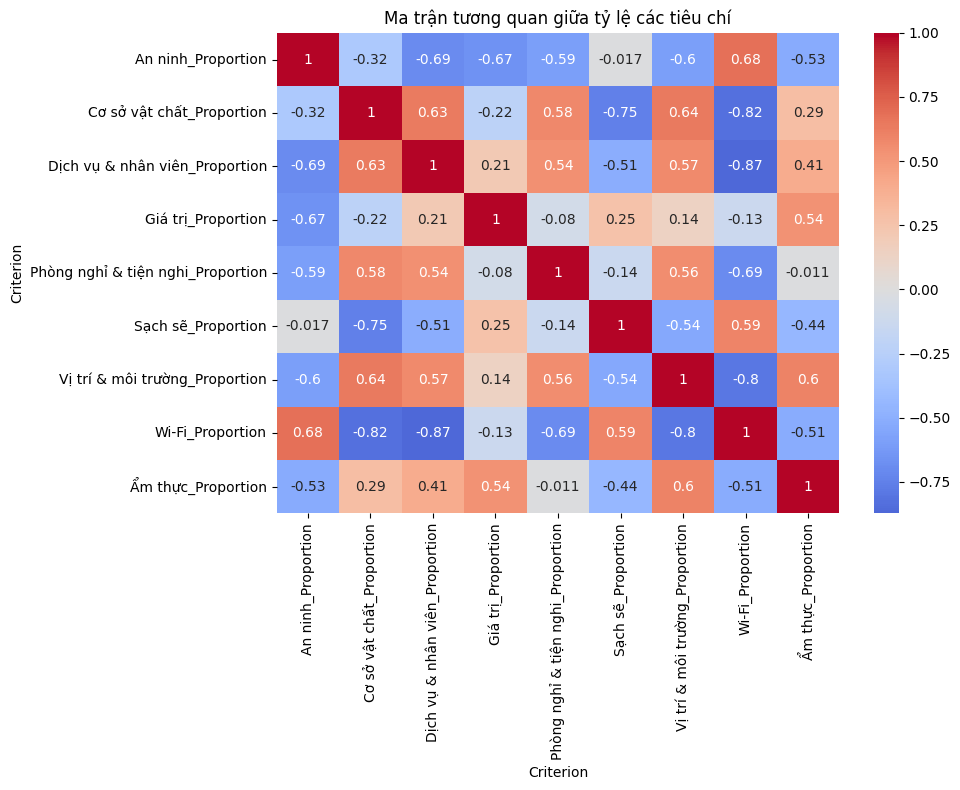

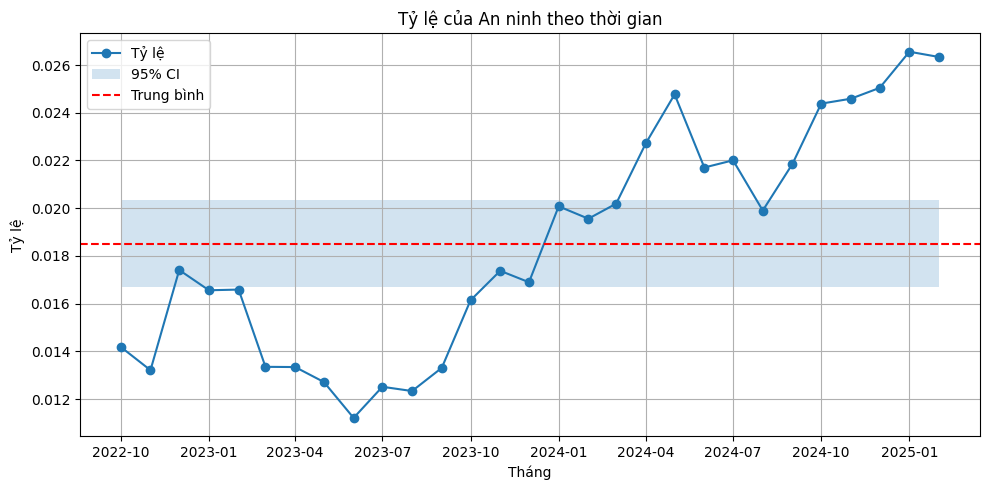

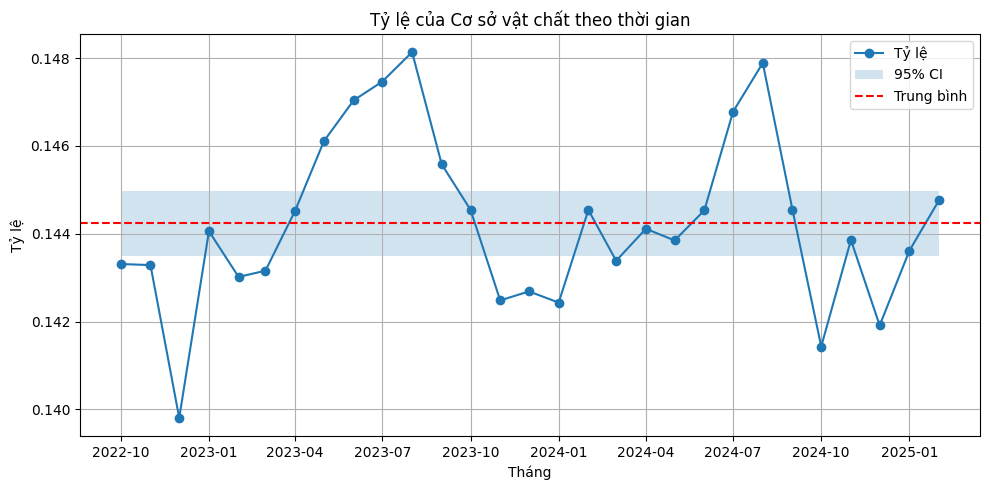

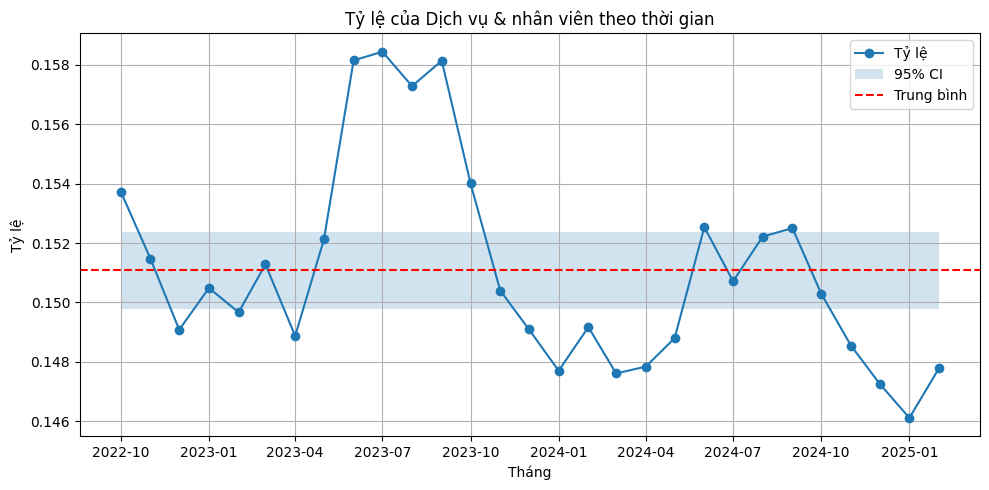

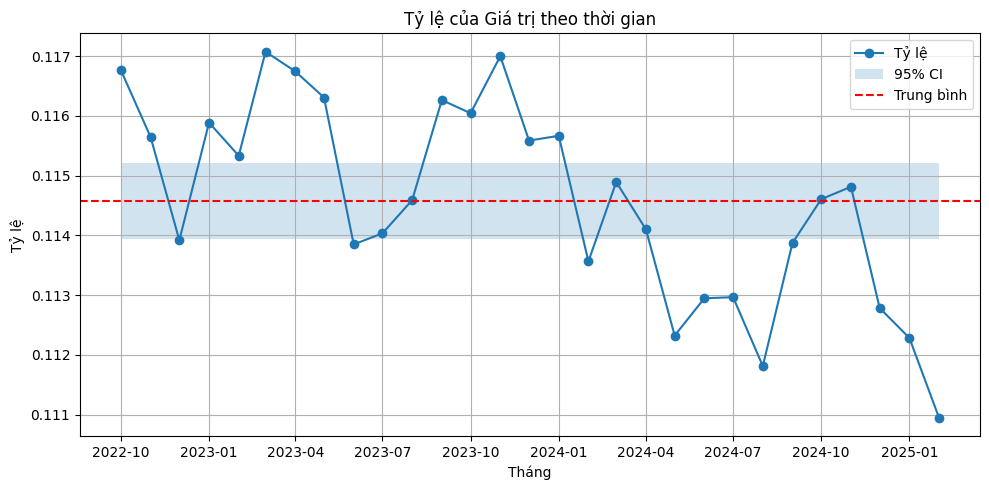

...

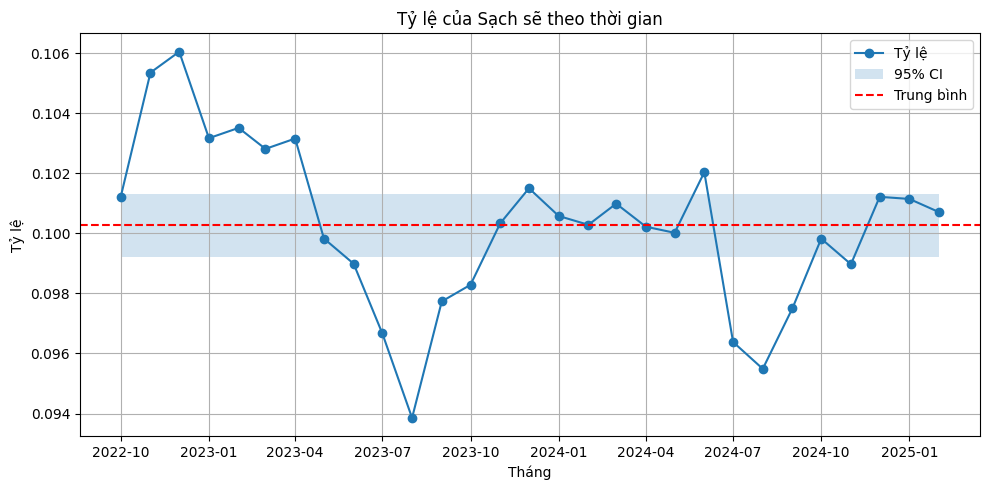

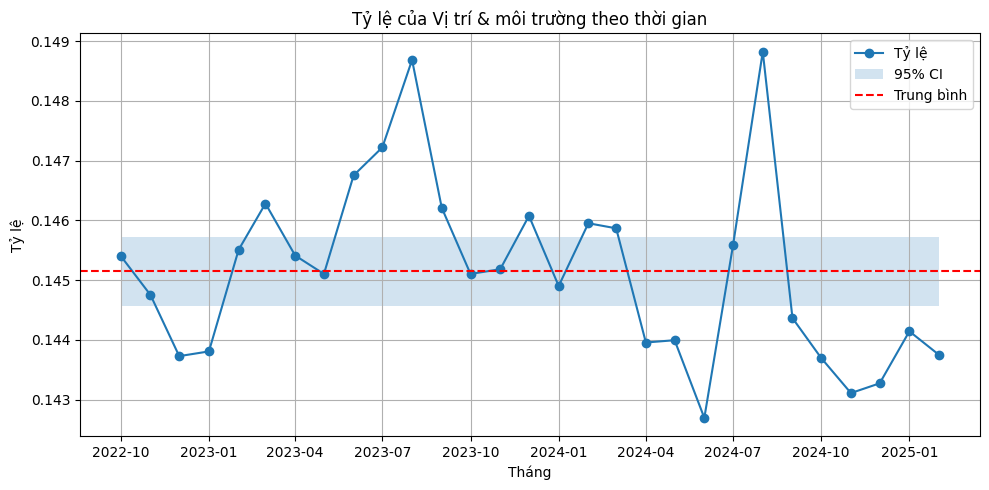

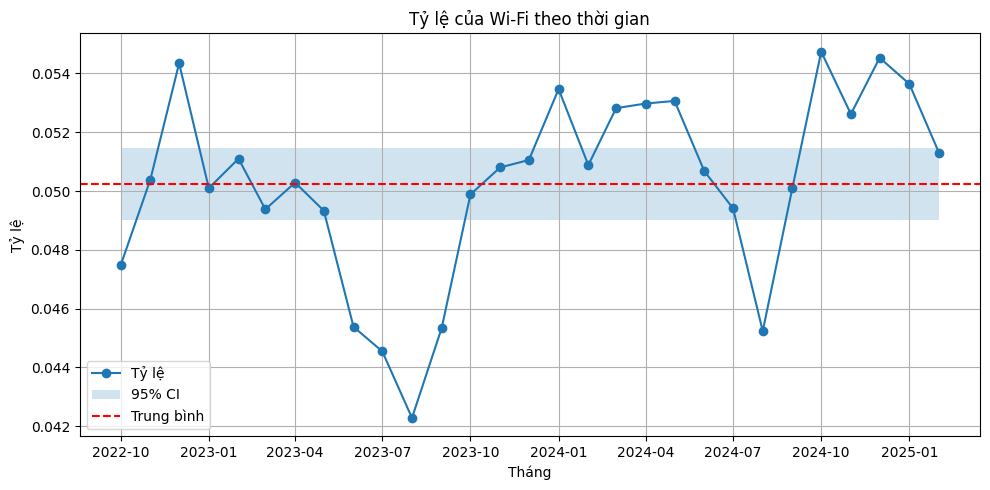

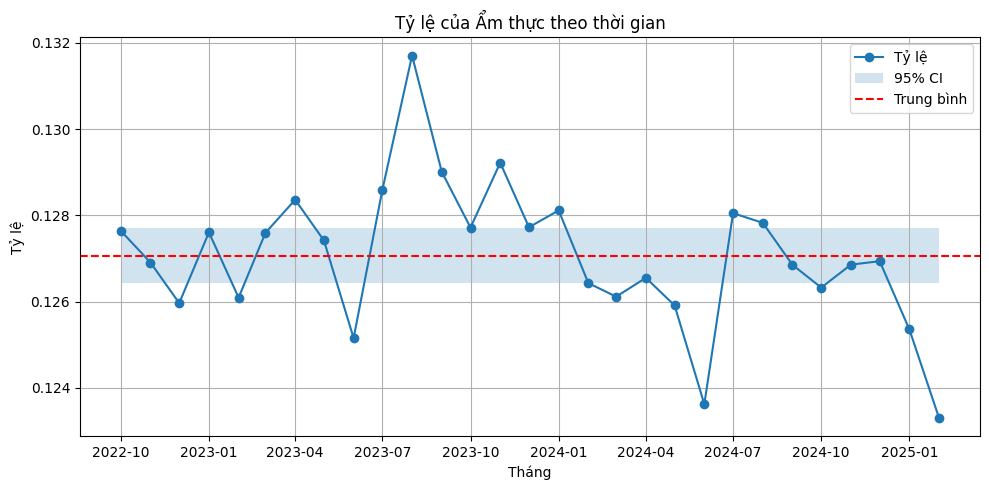

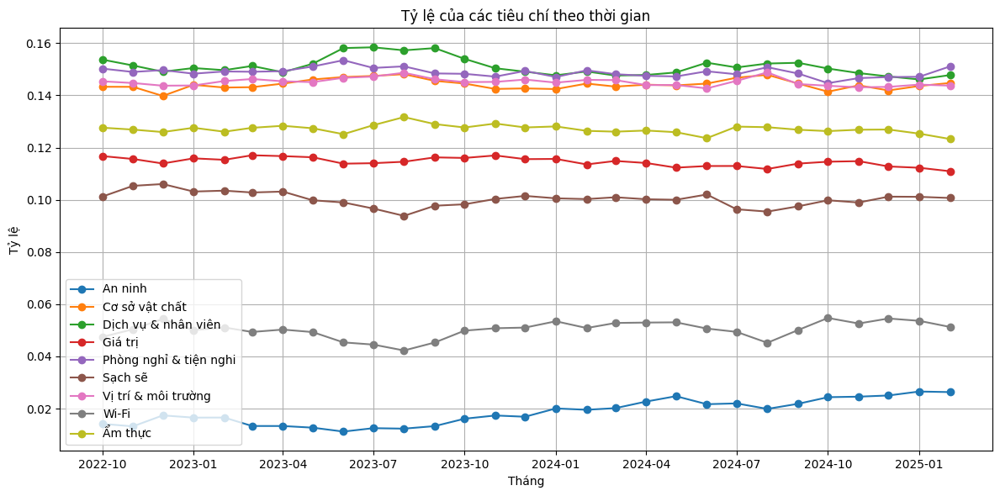

In [21]:
results_df, proportion_df = test_proportion_stability(calculate_proportions(results_df_drop_month))


In [22]:
results_df

,Criterion,Proportion_Mean,Proportion_Std,Proportion_CI_Lower,Proportion_CI_Upper,ANOVA_F_Stat,ANOVA_PValue,Stable_Proportion,Ljung_Box_PValue,Independent,ADF_PValue,ADF_Stationary,KPSS_PValue,KPSS_Stationary
0,An ninh,0.018512,0.004801,0.016686,0.020338,41.421285,7.530361e-10,False,2.345063e-13,False,0.892918,False,0.012797,False
1,Cơ sở vật chất,0.144236,0.001954,0.143493,0.144979,1.774765,1.777314e-01,True,4.310217e-06,False,0.059757,False,0.100000,True
2,Dịch vụ & nhân viên,0.151080,0.003431,0.149775,0.152386,4.317235,1.387868e-02,False,3.891929e-06,False,0.081031,False,0.100000,True
3,Giá trị,0.114574,0.001668,0.113939,0.115209,11.339752,6.953205e-05,False,1.236760e-02,False,0.998242,False,0.019467,False
4,Phòng nghỉ & tiện nghi,0.148865,0.001775,0.148189,0.149540,2.524814,8.053662e-02,True,3.464729e-01,True,0.691449,False,0.096221,True
5,Sạch sẽ,0.100271,0.002770,0.099217,0.101325,2.953040,5.196492e-02,True,7.945344e-06,False,0.001561,True,0.100000,True
6,Vị trí & môi trường,0.145150,0.001511,0.144575,0.145724,2.314830,1.002294e-01,True,4.142082e-01,True,0.035882,True,0.100000,True
7,Wi-Fi,0.050247,0.003204,0.049028,0.051465,3.342732,3.521993e-02,False,6.565163e-03,False,0.128626,False,0.100000,True
8,Ẩm thực,0.127067,0.001657,0.126436,0.127697,4.840233,8.622454e-03,False,5.773871e-01,True,0.047988,True,0.083131,True


#### Thực hiện phân loại theo sao khách sạn

In [63]:
import pandas as pd
import numpy as np
import os
from scipy import stats
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import acf, adfuller, kpss
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.regression.linear_model import OLS
import statsmodels.api as sm
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import shapiro
from pymannkendall import original_test
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

def assign_star_cluster(stars):
    """Phân cụm sao thành 3 cụm."""
    if pd.isna(stars) or stars is None:
        return None
    stars = float(stars)
    if 1 <= stars < 2:
        return '1 sao'
    elif 2 <= stars < 3:
        return '2 sao'
    elif stars == 3:
        return '3 sao'
    elif 4 <= stars < 5:
        return '4 sao'
    elif 5 == stars:
        return '5 sao'
    return None

def calculate_criteria_ratios_by_month(df, output_dir='output', review_count=10):
    """Tính tỷ lệ cho mỗi tiêu chí theo id khách sạn và theo tháng, lưu kết quả."""
    # Tạo thư mục đầu ra nếu chưa tồn tại
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Danh sách tiêu chí
    criteria_list = [
        'Vị trí & môi trường', 'Phòng nghỉ & tiện nghi', 'Sạch sẽ', 'Dịch vụ & nhân viên',
        'Wi-Fi', 'Ẩm thực', 'Cơ sở vật chất', 'An ninh', 'Giá trị'
    ]
    
    # Chuyển cột date thành định dạng datetime
    df['date'] = pd.to_datetime(df['date'])
    
    # Tạo cột year_month để nhóm theo tháng
    df['year_month'] = df['date'].dt.to_period('M')
    
    # Khởi tạo danh sách để lưu kết quả
    all_ratios = []
    
    # Nhóm theo year_month
    for year_month, month_group in tqdm(df.groupby('year_month'), total = len(df.groupby('year_month'))):
        # Tính tổng số review theo id trong tháng đó
        total_reviews = month_group.groupby('id').size().reset_index(name='total_reviews')
        
        # Tính số lần mỗi tiêu chí được nhắc đến theo id trong tháng
        ratios = []
        for id_hotel, group in month_group.groupby('id'):
            # Lấy thông tin price và stars_rating (lấy giá trị đầu tiên)
            #price = group['original_price'].iloc[0]
            stars = group['stars_rating'].iloc[0]
            total = total_reviews[total_reviews['id'] == id_hotel]['total_reviews'].iloc[0]
            
            # Đếm số lần mỗi tiêu chí xuất hiện
            counts = {crit: 0 for crit in criteria_list}
            for _, row in group.iterrows():
                # Xử lý cột criteria (danh sách các cặp [tiêu chí, cảm xúc])
                for crit, _ in row['criteria']:
                    if crit in criteria_list:
                        counts[crit] += 1
            
            # Tạo hàng kết quả
            ratio_row = {
                'year_month': year_month.to_timestamp(),
                'id_hotel': id_hotel,
                #'original_price': price,
                'stars_rating': stars,
                'total_reviews': total
            }
            for crit in criteria_list:
                ratio_row[f'{crit}_ratio'] = counts[crit] / total if total > 0 else np.nan
            ratios.append(ratio_row)
        
        # Tạo DataFrame kết quả cho tháng này
        ratios_df = pd.DataFrame(ratios)
        # Lọc các dòng có total_reviews >= review_count
        filtered_df = ratios_df[ratios_df['total_reviews'] >= review_count].reset_index(drop=True)
        all_ratios.append(filtered_df)
    
    # Gộp tất cả các kết quả
    final_df = pd.concat(all_ratios, ignore_index=True)
    
    # Sắp xếp theo year_month và id_hotel
    final_df = final_df.sort_values(['year_month', 'id_hotel']).reset_index(drop=True)
    
    
    return final_df

def calculate_summary_stats(ratios_df):
    """Tính thống kê tóm tắt từ ratios_df."""
    criteria_cols = [col for col in ratios_df.columns if '_ratio' in col]
    criteria = [col.replace('_ratio', '') for col in criteria_cols]
    summary_data = []
    
    grouped = ratios_df.groupby('year_month')
    for month, group in grouped:
        n_hotels = len(group['id_hotel'].unique())
        for criterion, col in zip(criteria, criteria_cols):
            ratios = group[col].dropna()
            if len(ratios) > 0:
                mean = ratios.mean()
                std = ratios.std(ddof=1)
                se = std / np.sqrt(len(ratios))
                ci_lower, ci_upper = stats.t.interval(0.95, len(ratios)-1, loc=mean, scale=se)
                bootstrap_means = [np.mean(np.random.choice(ratios, size=len(ratios), replace=True)) for _ in range(1000)]
                bootstrap_mean = np.mean(bootstrap_means)
                bootstrap_ci_lower, bootstrap_ci_upper = np.percentile(bootstrap_means, [2.5, 97.5])
                subsampling_sd = np.std(bootstrap_means)
                
                summary_data.append({
                    'year_month': month,
                    'Criterion': criterion,
                    'N_Hotels': n_hotels,
                    'Mean': mean,
                    'Std': std,
                    'CI_Lower': ci_lower,
                    'CI_Upper': ci_upper,
                    'Bootstrap_Mean': bootstrap_mean,
                    'Bootstrap_CI_Lower': bootstrap_ci_lower,
                    'Bootstrap_CI_Upper': bootstrap_ci_upper,
                    'Subsampling_SD': subsampling_sd
                })
    
    return pd.DataFrame(summary_data)

def analyze_time_series(summary_df, output_dir, cluster_name):
    """Phân tích chuỗi thời gian cho một cụm."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    summary_df['year_month'] = pd.to_datetime(summary_df['year_month'])
    criteria = summary_df['Criterion'].unique()
    test_results = []
    
    for criterion in criteria:
        df_criterion = summary_df[summary_df['Criterion'] == criterion].sort_values('year_month')
        if len(df_criterion) < 3:
            continue
        
        time_series = df_criterion['Mean'].values
        time_index = df_criterion['year_month']
        n = len(time_series)
        
        # Hồi quy tuyến tính
        time_numeric = np.arange(n)
        X = sm.add_constant(time_numeric)
        model = OLS(time_series, X).fit()
        slope = model.params[1]
        p_value_slope = model.pvalues[1]
        trend_linear = 'Tăng' if slope > 0 and p_value_slope < 0.05 else 'Giảm' if slope < 0 and p_value_slope < 0.05 else 'Không rõ'
        
        # Kiểm tra giả định
        shapiro_pvalue = shapiro(model.resid)[1]
        resid_normality = shapiro_pvalue > 0.05
        bp_test = het_breuschpagan(model.resid, X)
        resid_homoscedasticity = bp_test[1] > 0.05
        
        # Mann-Kendall
        mk_result = original_test(time_series)
        trend_mk = mk_result.trend
        p_value_mk = mk_result.p
        
        # STL (chu kỳ 12 tháng)
        if n >= 24:
            try:
                stl = STL(time_series, period=12, robust=True).fit()
                seasonal_strength = np.var(stl.seasonal) / np.var(time_series)
                has_seasonality = seasonal_strength > 0.1
            except:
                seasonal_strength = np.nan
                has_seasonality = False
        else:
            seasonal_strength = np.nan
            has_seasonality = False
        
        # ACF
        acf_values, acf_confint = acf(time_series, nlags=min(12, n-1), alpha=0.05)
        acf_lag12 = acf_values[12] if len(acf_values) > 12 else np.nan
        acf_lag12_significant = abs(acf_lag12) > acf_confint[12, 1] / 1.96 if len(acf_confint) > 12 else False
        
        # Durbin-Watson
        dw_stat = durbin_watson(model.resid)
        dw_interpretation = 'Tự tương quan dương' if dw_stat < 1.5 else 'Tự tương quan âm' if dw_stat > 2.5 else 'Gần độc lập'
        
        # Ljung-Box
        lb_results = acorr_ljungbox(time_series, lags=[min(12, n-1)], return_df=True)
        lb_pvalue = lb_results['lb_pvalue'].iloc[-1]
        lb_independent = lb_pvalue > 0.05
        
        # ADF và KPSS
        adf_result = adfuller(time_series)
        adf_pvalue = adf_result[1]
        adf_stationary = adf_pvalue < 0.05
        kpss_result = kpss(time_series, regression='c')
        kpss_pvalue = kpss_result[1]
        kpss_stationary = kpss_pvalue > 0.05
        
        test_results.append({
            'Criterion': criterion,
            'Trend_Linear': trend_linear,
            'Slope_Linear': slope,
            'P_Value_Linear': p_value_slope,
            'Resid_Normality': resid_normality,
            'Resid_Homoscedasticity': resid_homoscedasticity,
            'Trend_MannKendall': trend_mk,
            'P_Value_MK': p_value_mk,
            'Seasonal_Strength': seasonal_strength,
            'Has_Seasonality': has_seasonality,
            'ACF_Lag12': acf_lag12,
            'ACF_Lag12_Significant': acf_lag12_significant,
            'Durbin_Watson': dw_stat,
            'DW_Interpretation': dw_interpretation,
            'Ljung_Box_PValue': lb_pvalue,
            'Independent': lb_independent,
            'ADF_PValue': adf_pvalue,
            'ADF_Stationary': adf_stationary,
            'KPSS_PValue': kpss_pvalue,
            'KPSS_Stationary': kpss_stationary
        })
        
        # Biểu đồ
        plt.figure(figsize=(12, 8))
        plt.subplot(3, 1, 1)
        plt.plot(time_index, time_series, marker='o', label='Mean')
        plt.plot(time_index, model.fittedvalues, linestyle='--', label='Xu hướng tuyến tính')
        plt.fill_between(time_index, df_criterion['CI_Lower'], df_criterion['CI_Upper'], alpha=0.2, label='95% CI')
        plt.title(f'{criterion}: Chuỗi thời gian ({cluster_name})')
        plt.legend()
        plt.grid(True)
        
        if has_seasonality and not np.isnan(seasonal_strength):
            plt.subplot(3, 1, 2)
            plt.plot(time_index, stl.seasonal, marker='s', label='Seasonal')
            plt.title(f'Mùa vụ STL ({cluster_name})')
            plt.legend()
            plt.grid(True)
        
        plt.subplot(3, 1, 3)
        plt.stem(range(min(13, n)), acf_values[:min(13, n)], basefmt=' ')
        plt.title(f'ACF ({cluster_name})')
        plt.grid(True)
        
        plt.tight_layout()
        plot_path = os.path.join(output_dir, f'time_series_{cluster_name}_{criterion.replace(" ", "_")}.png')
        plt.show()
        plt.close()
    
    results_summary = pd.DataFrame(test_results)
    output_path = os.path.join(output_dir, f'time_series_{cluster_name}.csv')
    results_summary.to_csv(output_path, index=False)
    return results_summary

def kmeans_clustering(ratios_df, n_clusters=3, output_dir='output'):
    """Phân cụm khách sạn bằng K-means dựa trên tỷ lệ đánh giá."""
    criteria_cols = [col for col in ratios_df.columns if '_ratio' in col]
    pivot_df = ratios_df.groupby('id_hotel')[criteria_cols].mean().dropna()
    
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(pivot_df)
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    pivot_df['Cluster'] = kmeans.fit_predict(scaled_data)
    
    # Trực quan hóa
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_df.groupby('Cluster')[criteria_cols].mean(), annot=True, cmap='viridis')
    plt.title('Tỷ lệ trung bình theo cụm K-means')
    plt.tight_layout()
    plot_path = os.path.join(output_dir, 'kmeans_heatmap.png')
    plt.show()
    plt.close()
    
    return pivot_df





In [74]:
merged_df_star

,id_hotel,room_normalized,criteria,date,id,stars_rating,star_cluster
0,10000593,bungalow deluxe nhìn ra khu vườn,"[[Phòng nghỉ & tiện nghi, Positive], [Cơ sở vậ...",2023-09-01,10000593,3.0,3 sao
1,10000593,bungalow nhìn ra vườn,"[[Vị trí & môi trường, Positive], [Ẩm thực, Mi...",2023-09-01,10000593,3.0,3 sao
2,10000593,bungalow deluxe nhìn ra khu vườn,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-08-01,10000593,3.0,3 sao
3,10000593,suite gia đình,"[[Vị trí & môi trường, Positive], [Dịch vụ & n...",2023-06-01,10000593,3.0,3 sao
4,10000593,bungalow nhìn ra vườn,"[[Dịch vụ & nhân viên, Positive], [Vị trí & mô...",2023-07-01,10000593,3.0,3 sao
...,...,...,...,...,...,...,...
638197,9952428,căn hộ 1 phòng ngủ,"[[Dịch vụ & nhân viên, Mixed], [Phòng nghỉ & t...",2023-08-01,9952428,3.0,3 sao
638198,9952428,căn hộ 1 phòng ngủ,"[[Cơ sở vật chất, Mixed], [Phòng nghỉ & tiện n...",2023-05-01,9952428,3.0,3 sao
638199,9952428,căn hộ 1 phòng ngủ,"[[Cơ sở vật chất, Positive], [Ẩm thực, Negativ...",2024-02-01,9952428,3.0,3 sao
638200,5386288,căn hộ 3 phòng ngủ,"[[Phòng nghỉ & tiện nghi, Positive], [Cơ sở vậ...",2023-07-01,5386288,4.0,4 sao


In [75]:
# Phân cụm theo sao
merged_df_star['star_cluster'] = merged_df_star['stars_rating'].apply(assign_star_cluster)


In [61]:
cluster_df = merged_df_star[merged_df_star['star_cluster'] == '3 sao']
ratios_df = calculate_criteria_ratios_by_month(cluster_df)

100%|██████████| 44/44 [00:30<00:00,  1.46it/s]


In [62]:
ratios_df

,year_month,id_hotel,stars_rating,total_reviews,Vị trí & môi trường_ratio,Phòng nghỉ & tiện nghi_ratio,Sạch sẽ_ratio,Dịch vụ & nhân viên_ratio,Wi-Fi_ratio,Ẩm thực_ratio,Cơ sở vật chất_ratio,An ninh_ratio,Giá trị_ratio
0,2022-02-01,1587298,3.0,11,0.454545,0.727273,0.181818,0.636364,0.090909,0.272727,0.363636,0.090909,0.454545
1,2022-03-01,1986106,3.0,14,0.785714,0.857143,0.285714,0.714286,0.000000,0.285714,0.428571,0.000000,0.357143
2,2022-03-01,266695,3.0,19,0.736842,0.842105,0.473684,0.578947,0.105263,0.526316,0.631579,0.105263,0.473684
3,2022-03-01,2682186,3.0,10,0.500000,0.800000,0.700000,0.600000,0.000000,0.100000,0.400000,0.000000,0.000000
4,2022-03-01,2979747,3.0,12,0.666667,0.750000,0.250000,0.833333,0.000000,0.250000,0.666667,0.000000,0.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6163,2025-02-01,9841566,3.0,11,0.727273,0.818182,0.818182,0.727273,0.181818,0.363636,0.727273,0.000000,0.727273
6164,2025-02-01,9920949,3.0,10,0.200000,0.100000,0.100000,1.000000,0.000000,0.100000,0.200000,0.000000,0.100000
6165,2025-02-01,9938326,3.0,23,0.782609,0.869565,0.434783,0.608696,0.130435,0.608696,0.739130,0.000000,0.478261
6166,2025-03-01,10957450,3.0,10,0.900000,0.900000,0.500000,0.900000,0.300000,0.400000,0.700000,0.200000,0.500000


In [67]:
analysis_df = analyze_hotels_and_reviews_by_month(ratios_df)
analysis_df


Đã lưu kết quả phân tích vào: output\hotels_and_reviews_by_month.csv


,year_month,num_hotels,total_reviews
0,2022-02-01,1,11
1,2022-03-01,11,167
2,2022-04-01,42,594
3,2022-05-01,67,974
4,2022-06-01,76,1181
5,2022-07-01,104,1709
6,2022-08-01,103,1760
7,2022-09-01,105,1832
8,2022-10-01,118,2216
9,2022-11-01,131,2375


In [68]:
exclude_dates = ['2022-02-01', '2022-03-01', '2022-04-01', '2025-03-01']
ratios_df = ratios_df[~ratios_df['year_month'].isin(exclude_dates)].copy()

In [69]:
summary_df = calculate_summary_stats(ratios_df)

In [71]:
summary_df

,year_month,Criterion,N_Hotels,Mean,Std,CI_Lower,CI_Upper,Bootstrap_Mean,Bootstrap_CI_Lower,Bootstrap_CI_Upper,Subsampling_SD
0,2022-05-01,Vị trí & môi trường,67,0.697095,0.172476,0.655024,0.739165,0.697987,0.657365,0.739083,0.021169
1,2022-05-01,Phòng nghỉ & tiện nghi,67,0.794301,0.143219,0.759367,0.829235,0.794886,0.759862,0.829920,0.017884
2,2022-05-01,Sạch sẽ,67,0.510715,0.176851,0.467578,0.553853,0.509862,0.466894,0.552576,0.021624
3,2022-05-01,Dịch vụ & nhân viên,67,0.747745,0.178237,0.704269,0.791220,0.749319,0.708134,0.791753,0.021008
4,2022-05-01,Wi-Fi,67,0.145177,0.138025,0.111510,0.178844,0.144763,0.114156,0.177704,0.016205
...,...,...,...,...,...,...,...,...,...,...,...
301,2025-02-01,Wi-Fi,194,0.263649,0.175877,0.238744,0.288555,0.263115,0.238591,0.286747,0.012288
302,2025-02-01,Ẩm thực,194,0.651041,0.204852,0.622033,0.680049,0.651419,0.622343,0.679008,0.014544
303,2025-02-01,Cơ sở vật chất,194,0.777990,0.146839,0.757197,0.798783,0.777896,0.755531,0.799360,0.010582
304,2025-02-01,An ninh,194,0.141137,0.188906,0.114387,0.167887,0.141750,0.115621,0.169590,0.013448


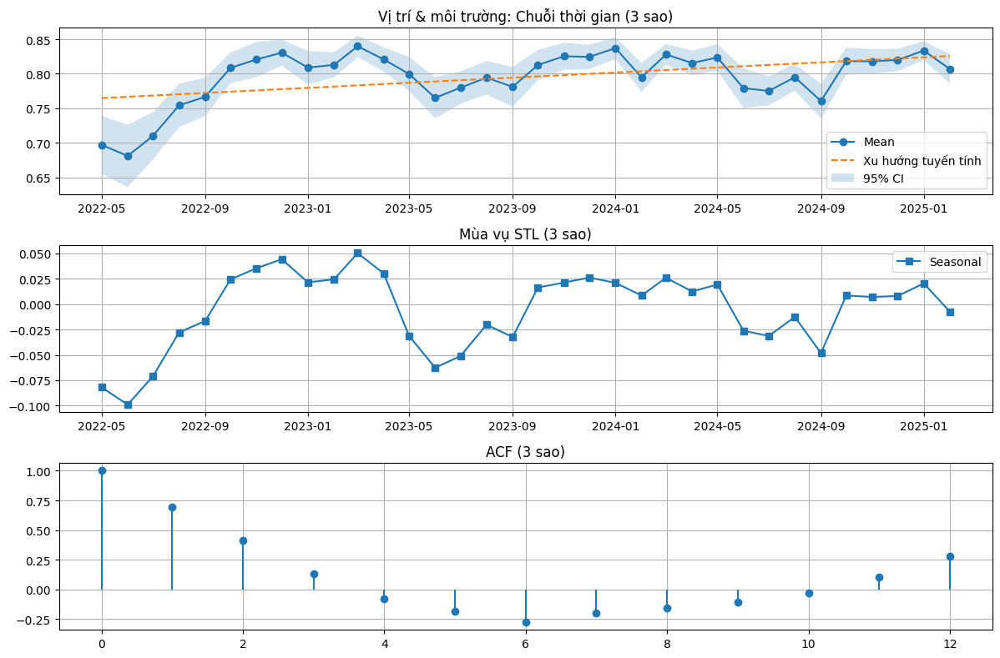

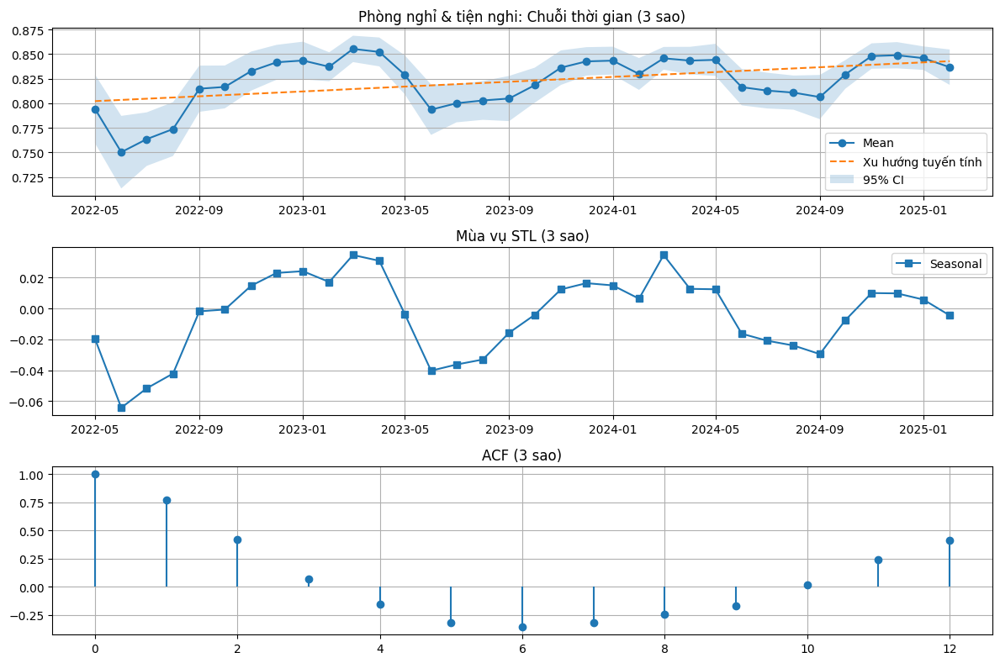

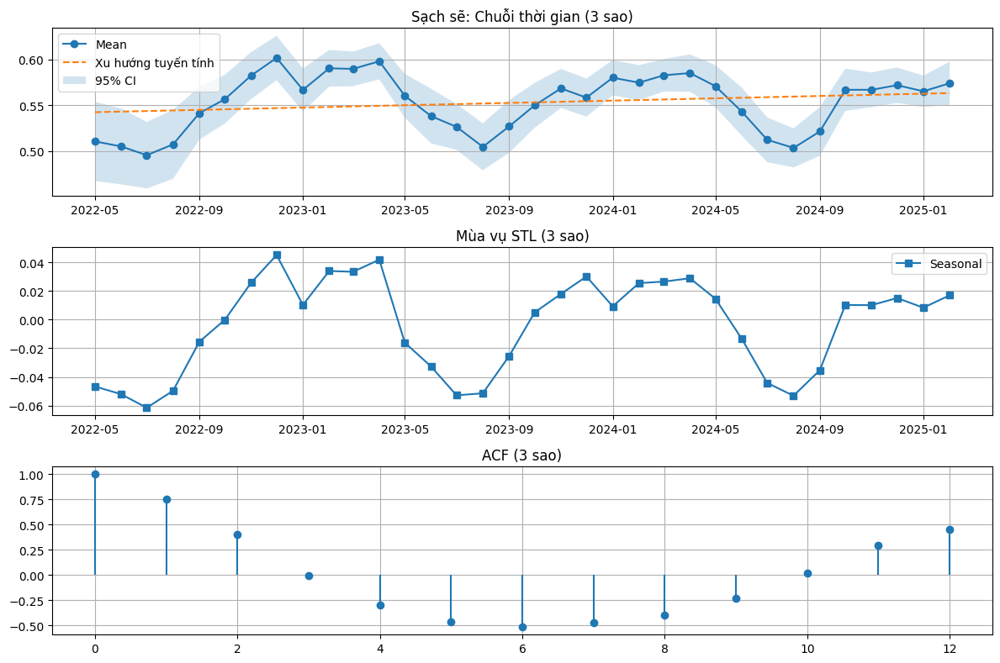

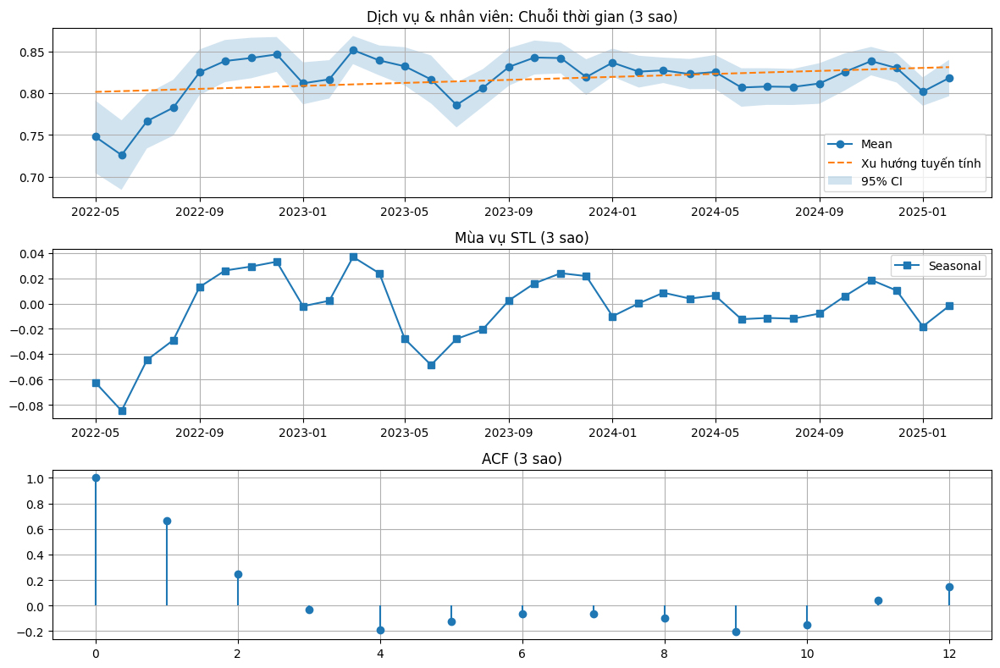

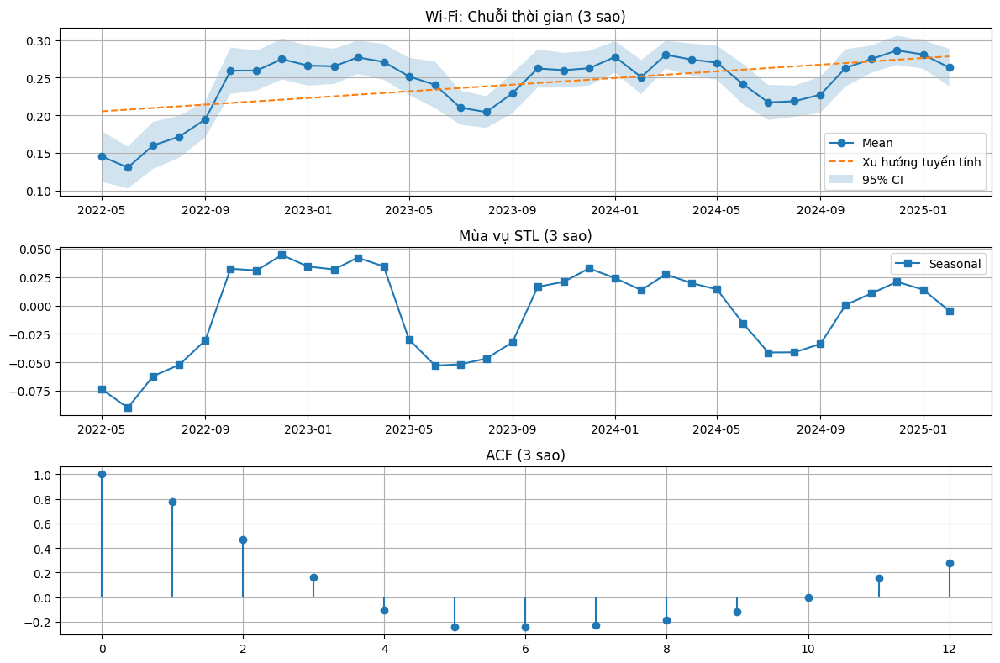

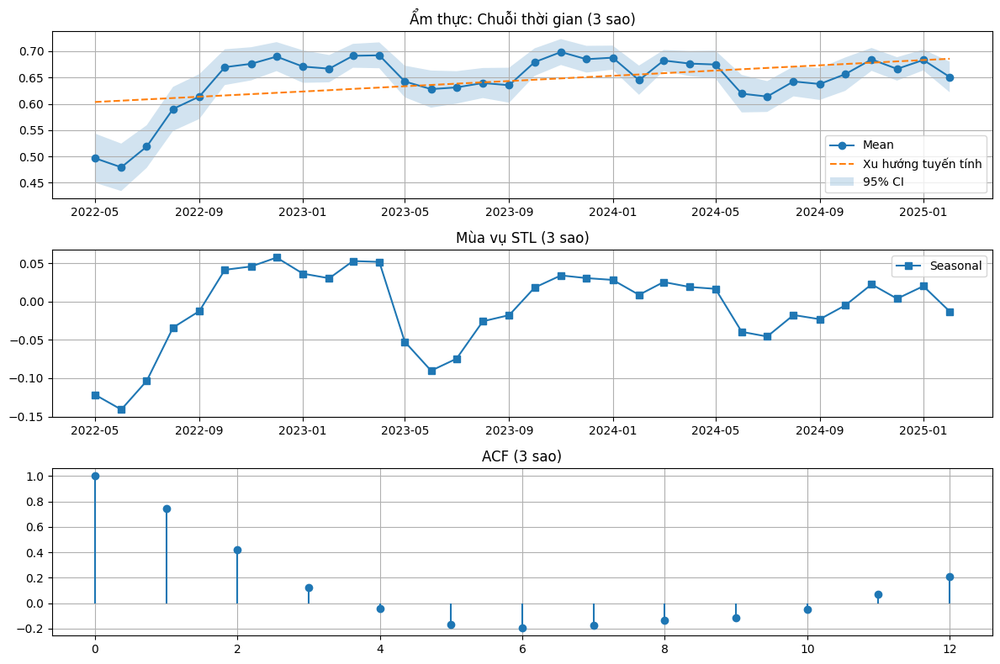

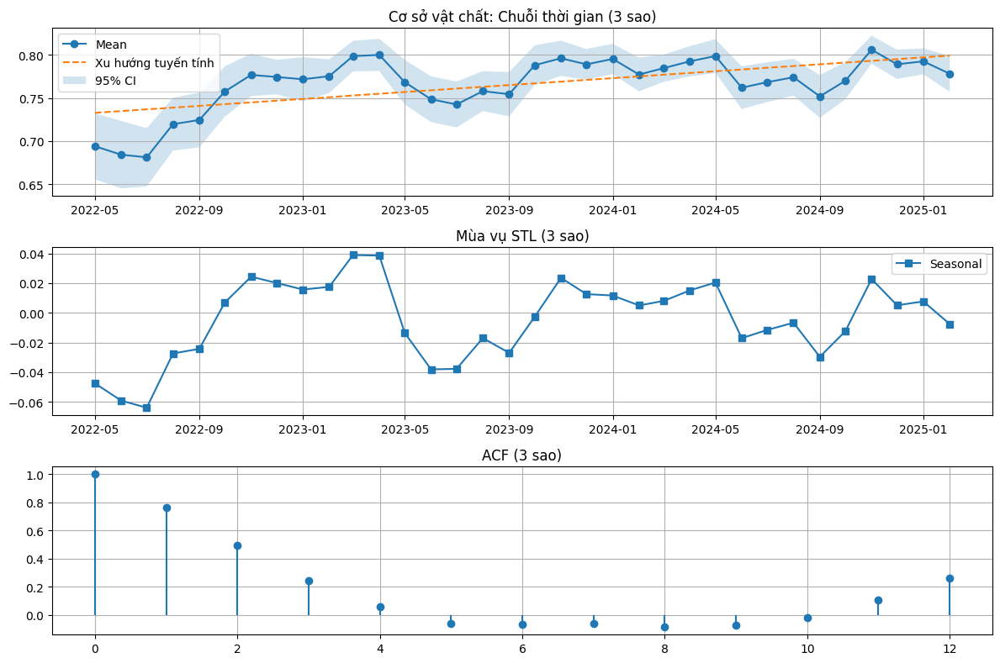

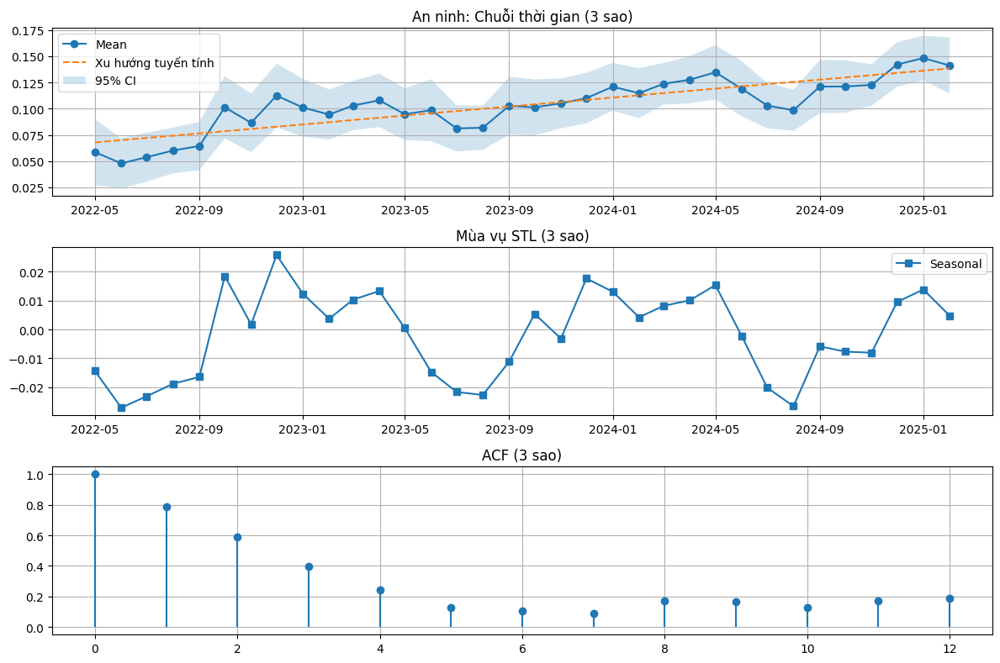

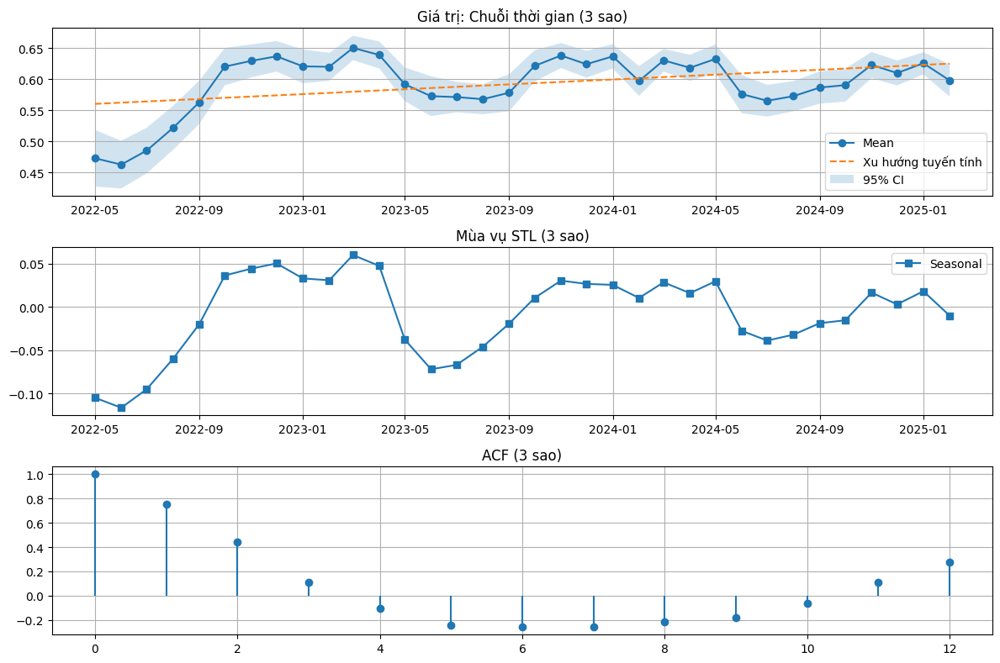

In [72]:
results_summary = analyze_time_series(summary_df, os.path.join('output_dir', '3 sao'), '3 sao')

In [73]:
results_summary

,Criterion,Trend_Linear,Slope_Linear,P_Value_Linear,Resid_Normality,Resid_Homoscedasticity,Trend_MannKendall,P_Value_MK,Seasonal_Strength,Has_Seasonality,ACF_Lag12,ACF_Lag12_Significant,Durbin_Watson,DW_Interpretation,Ljung_Box_PValue,Independent,ADF_PValue,ADF_Stationary,KPSS_PValue,KPSS_Stationary
0,Vị trí & môi trường,Tăng,0.001846,4.935549e-03,True,False,no trend,5.036787e-02,0.928181,True,0.281591,False,0.536158,Tự tương quan dương,1.274925e-04,False,0.061129,False,0.100000,True
1,Phòng nghỉ & tiện nghi,Tăng,0.001232,4.882274e-03,True,False,increasing,9.078017e-03,0.950695,True,0.416372,False,0.529362,Tự tương quan dương,1.349581e-08,False,0.240809,False,0.100000,True
2,Sạch sẽ,Không rõ,0.000631,2.530998e-01,True,True,no trend,3.427405e-01,1.112794,True,0.451665,False,0.440848,Tự tương quan dương,1.039695e-13,False,0.000044,True,0.100000,True
3,Dịch vụ & nhân viên,Không rõ,0.000898,6.257557e-02,True,False,no trend,8.125085e-01,0.995987,True,0.145130,False,0.536192,Tự tương quan dương,9.806915e-03,False,0.000336,True,0.100000,True
4,Wi-Fi,Tăng,0.002213,1.104331e-03,True,False,increasing,4.852825e-03,0.861900,True,0.275557,False,0.362654,Tự tương quan dương,3.418374e-06,False,0.074759,False,0.090296,True
5,Ẩm thực,Tăng,0.002490,5.969663e-03,True,False,no trend,1.160919e-01,0.912030,True,0.210885,False,0.355122,Tự tương quan dương,2.734075e-04,False,0.025611,True,0.100000,True
6,Cơ sở vật chất,Tăng,0.002006,1.075407e-04,True,False,increasing,2.259361e-03,0.659394,True,0.262141,False,0.503794,Tự tương quan dương,1.083692e-04,False,0.109200,False,0.043731,False
7,An ninh,Tăng,0.002138,5.044514e-10,True,True,increasing,2.098969e-08,0.344863,True,0.185746,False,0.853674,Tự tương quan dương,3.295317e-07,False,0.954445,False,0.010000,False
8,Giá trị,Tăng,0.001958,1.600551e-02,True,False,no trend,1.821384e-01,0.957745,True,0.274859,False,0.354498,Tự tương quan dương,4.911859e-06,False,0.005595,True,0.100000,True


100%|██████████| 44/44 [00:32<00:00,  1.36it/s]



Đã lưu kết quả phân tích vào: output\hotels_and_reviews_by_month.csv


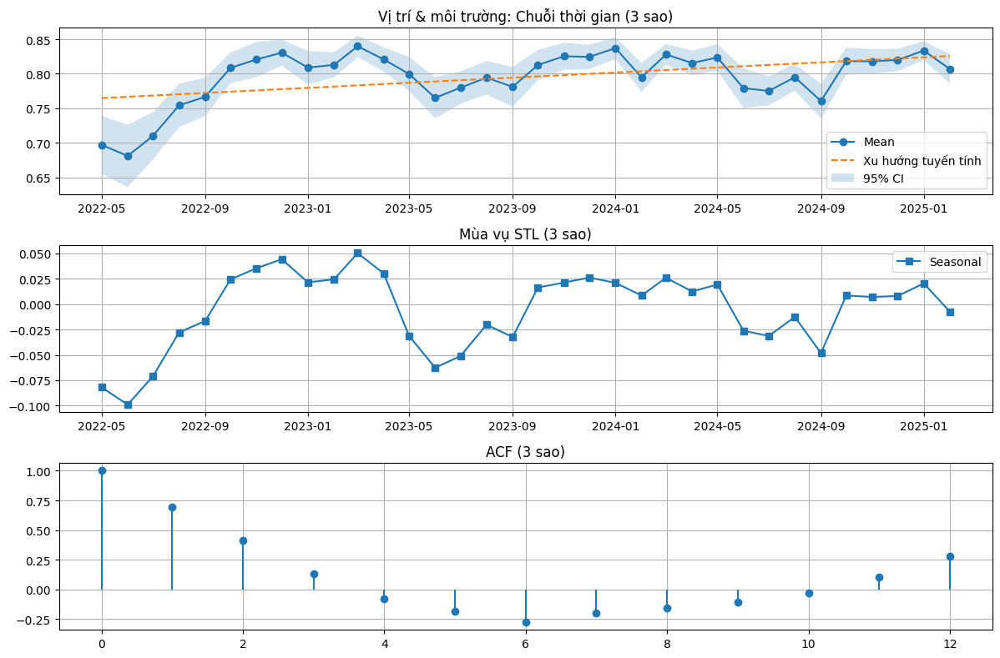

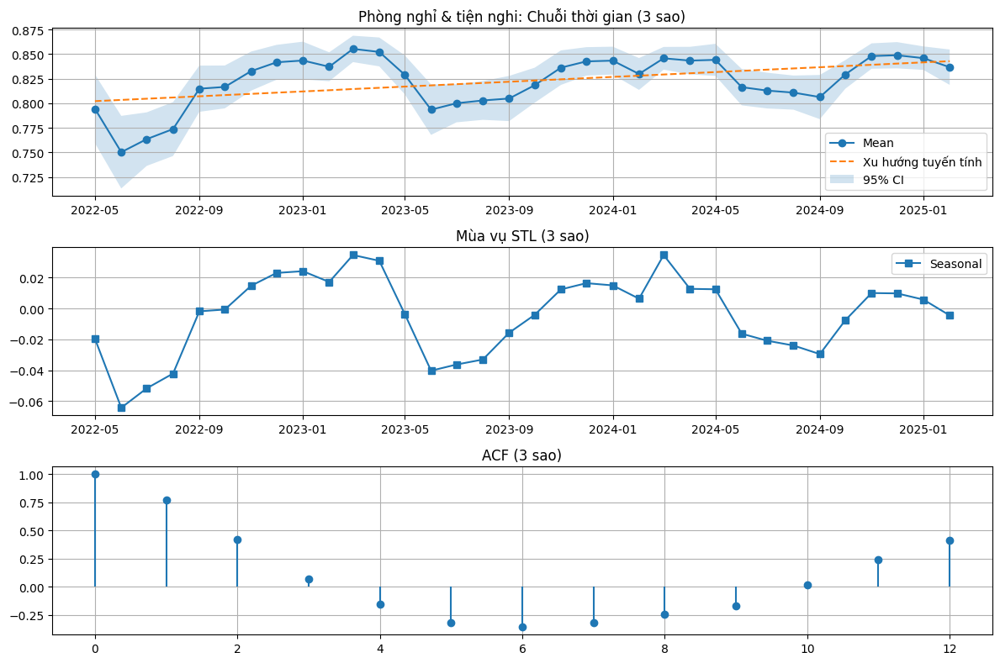

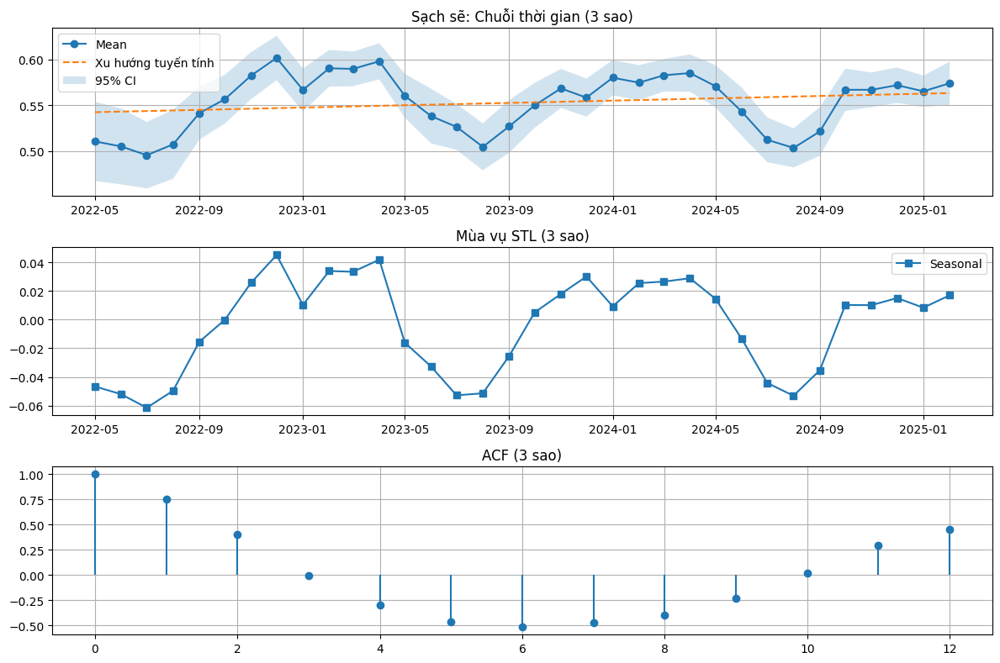

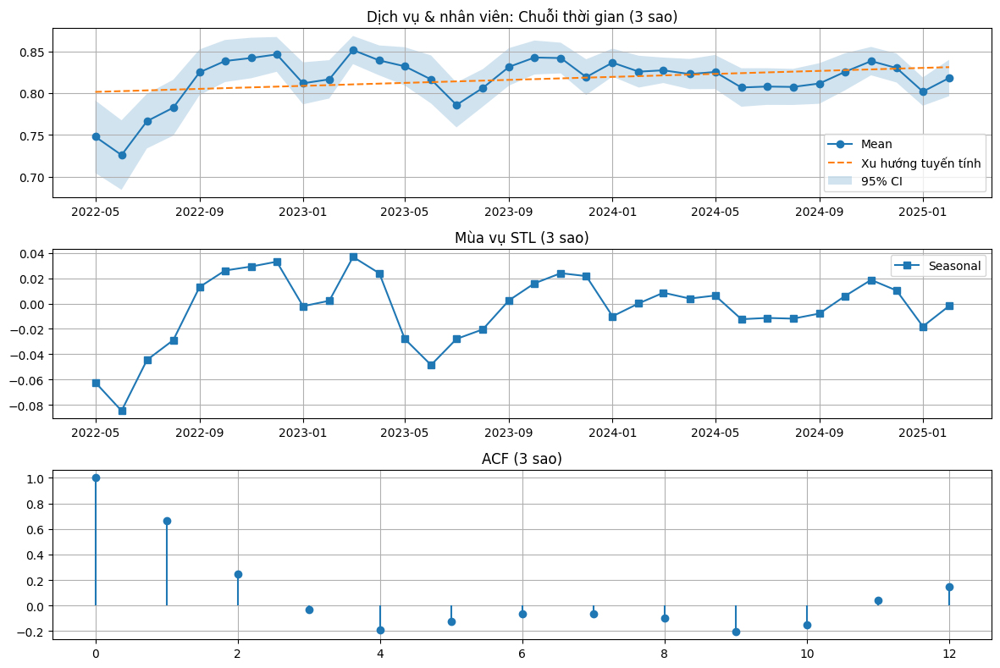

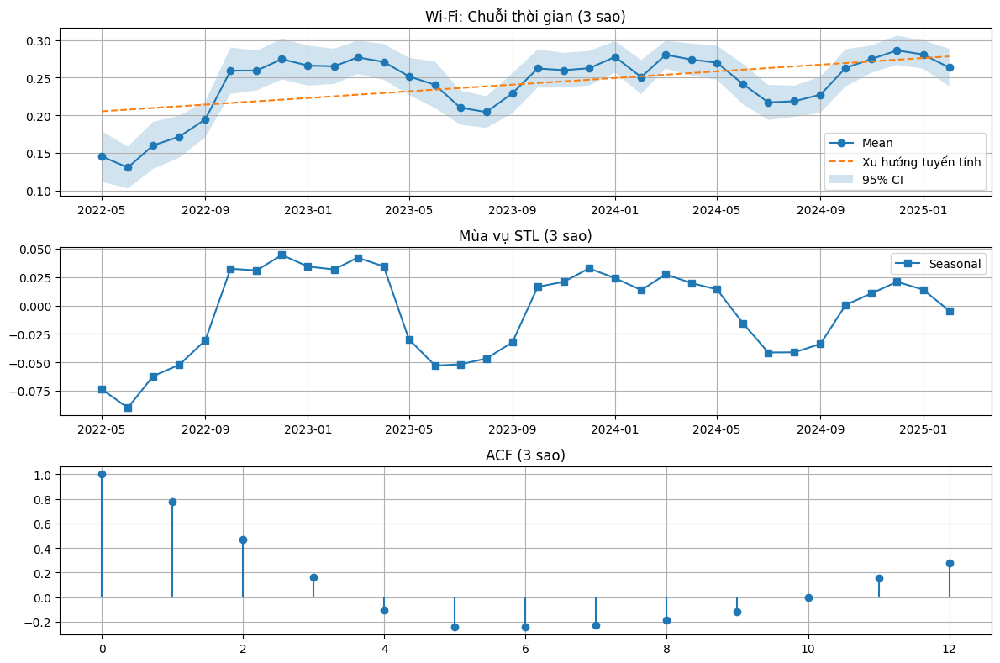

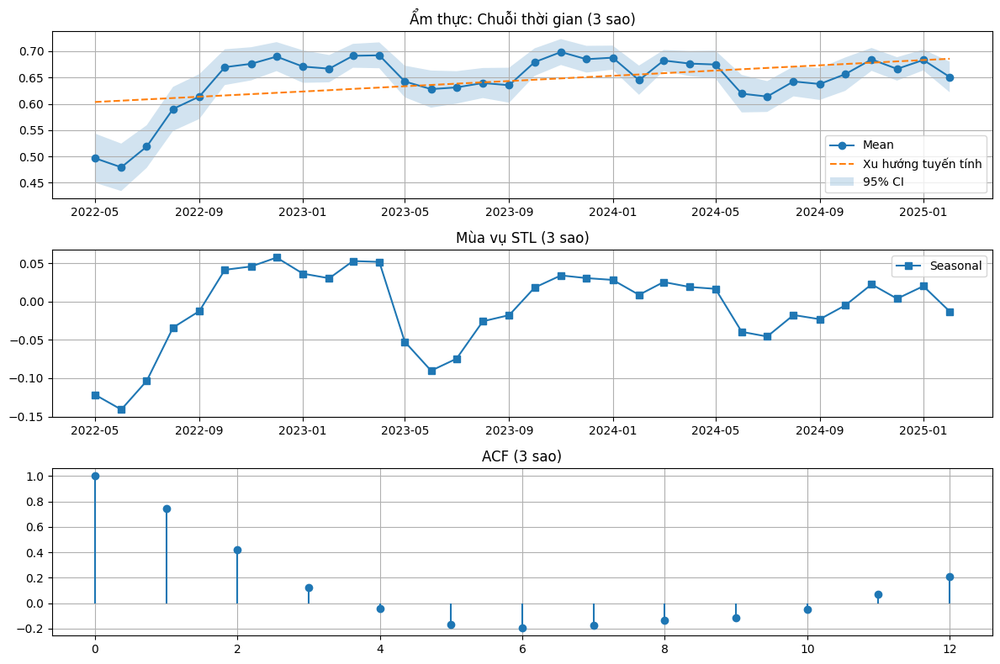

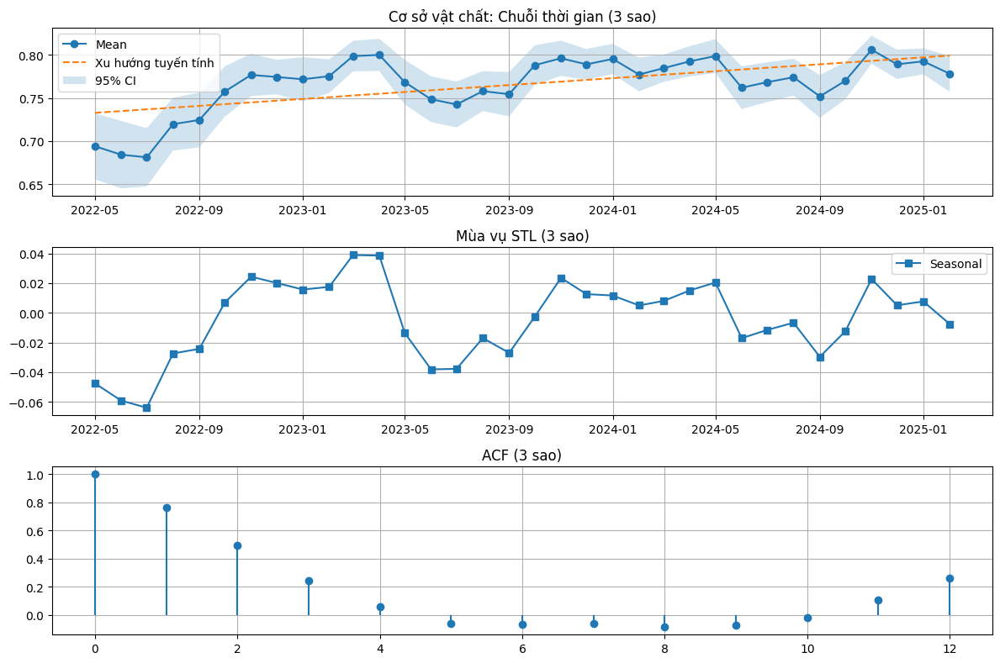

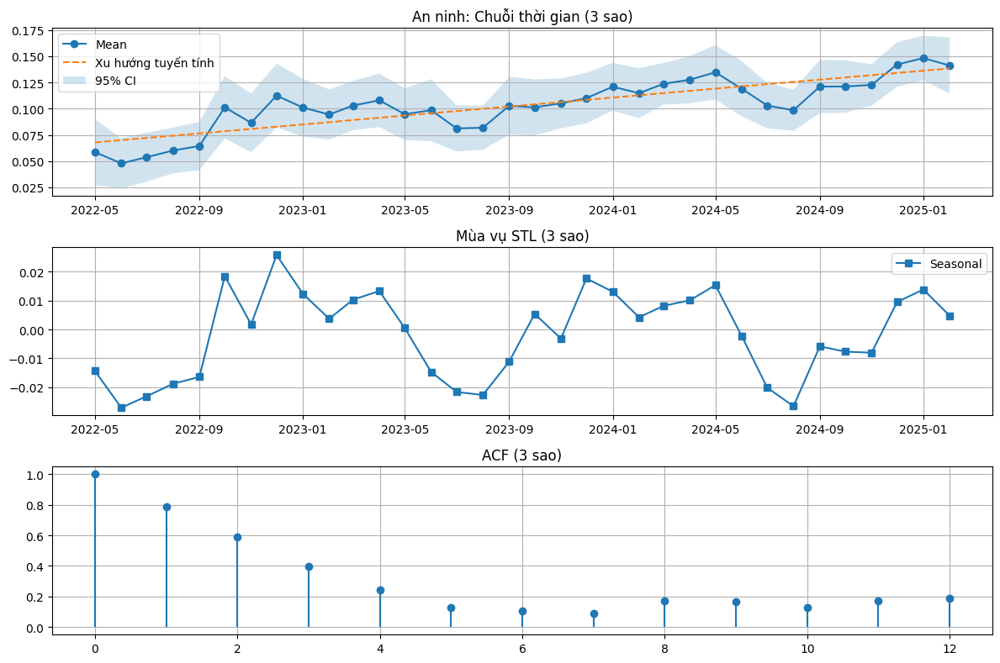

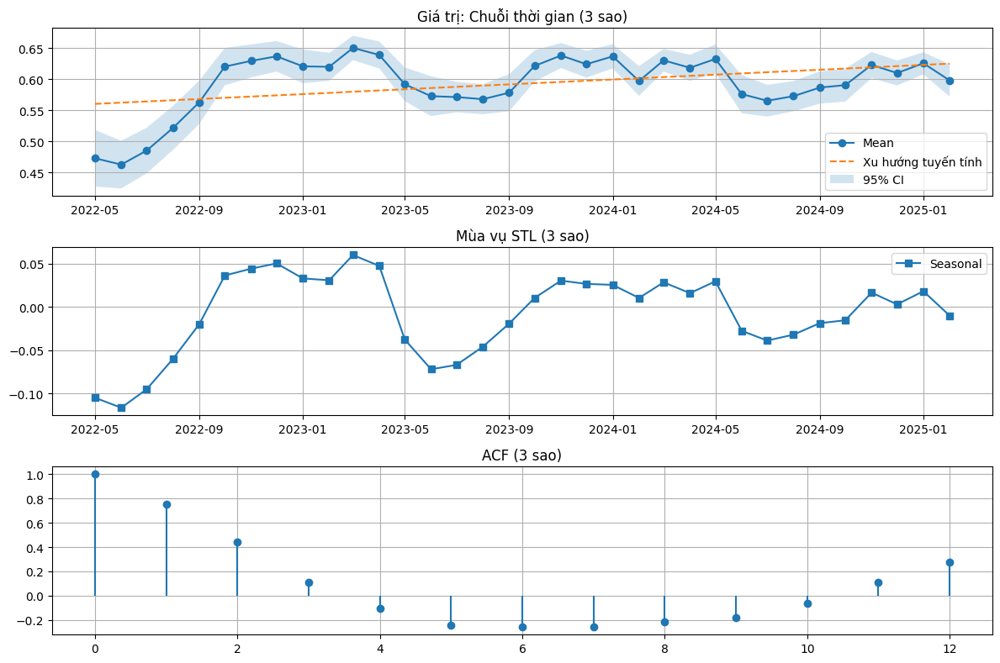


Kết quả phân tích cho cụm 3 sao:
                 Criterion Trend_Linear  Slope_Linear  P_Value_Linear  \
0     Vị trí & môi trường         Tăng        0.0018          0.0049   
1  Phòng nghỉ & tiện nghi         Tăng        0.0012          0.0049   
2                 Sạch sẽ     Không rõ        0.0006          0.2531   
3     Dịch vụ & nhân viên     Không rõ        0.0009          0.0626   
4                   Wi-Fi         Tăng        0.0022          0.0011   
5                 Ẩm thực         Tăng        0.0025          0.0060   
6          Cơ sở vật chất         Tăng        0.0020          0.0001   
7                 An ninh         Tăng        0.0021          0.0000   
8                 Giá trị         Tăng        0.0020          0.0160   

   Resid_Normality  Resid_Homoscedasticity Trend_MannKendall  P_Value_MK  \
0             True                   False          no trend      0.0504   
1             True                   False        increasing      0.0091   
2             Tr

100%|██████████| 40/40 [00:16<00:00,  2.42it/s]



Đã lưu kết quả phân tích vào: output\hotels_and_reviews_by_month.csv


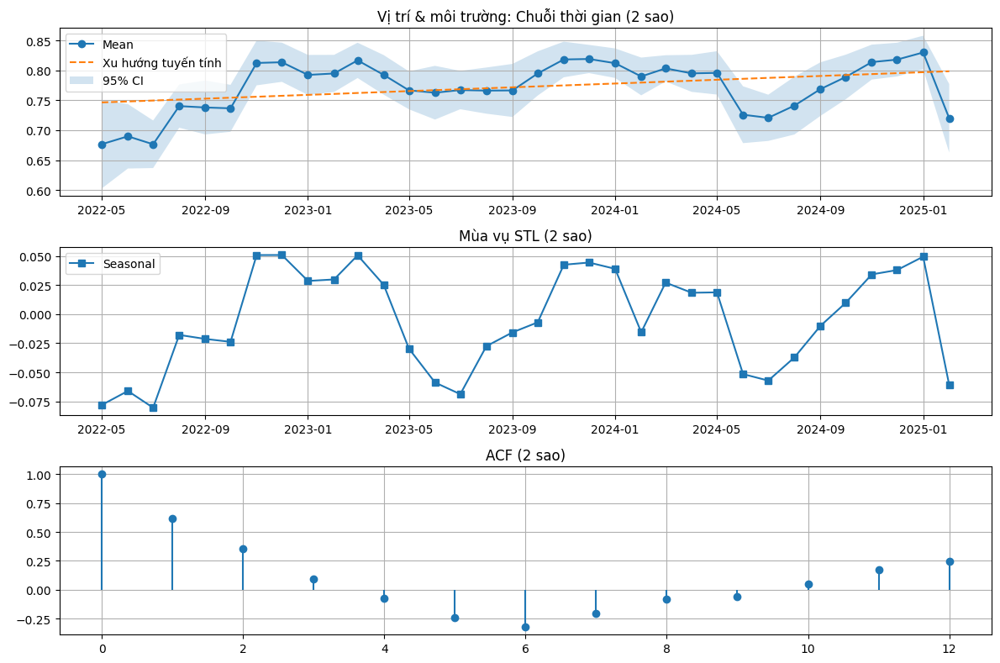

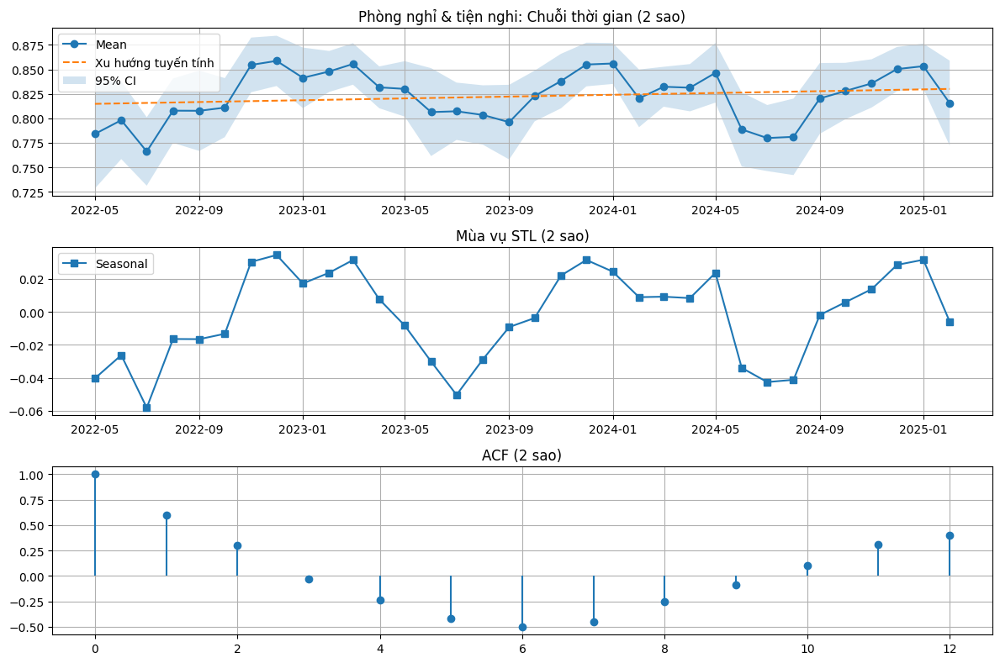

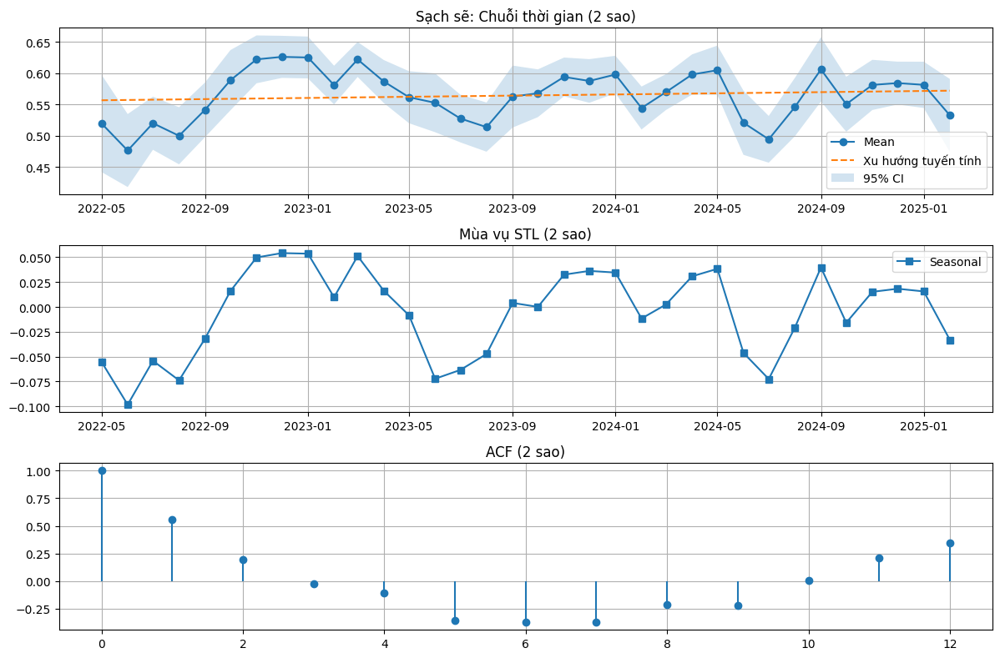

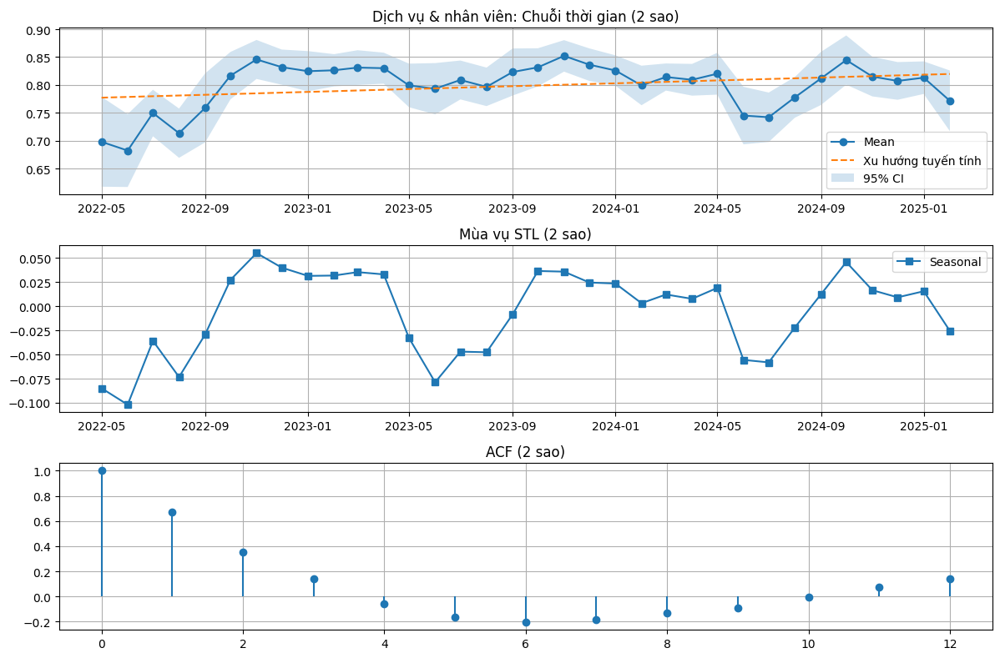

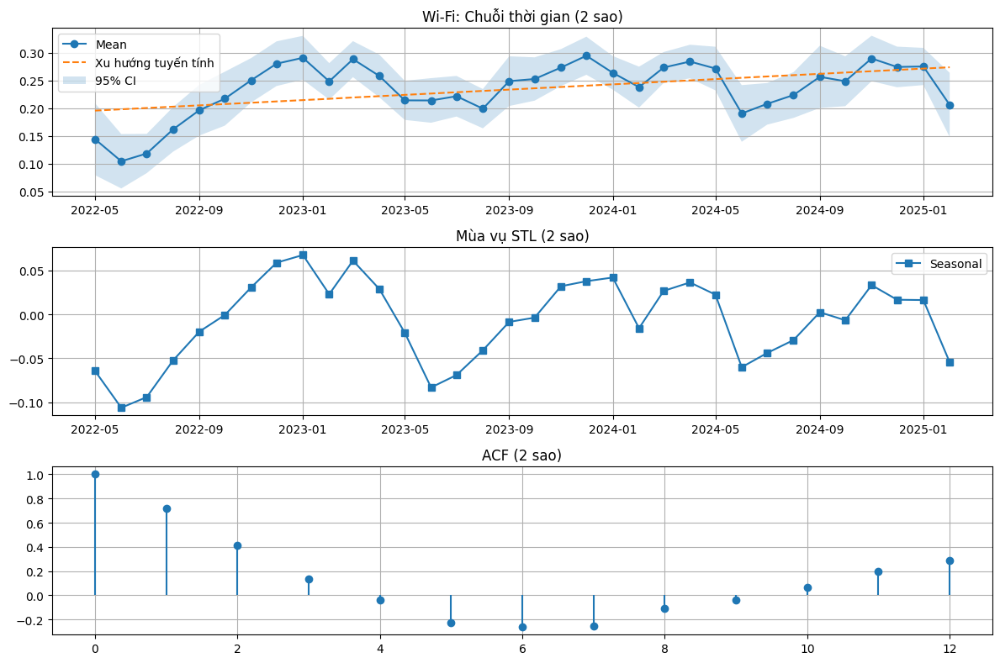

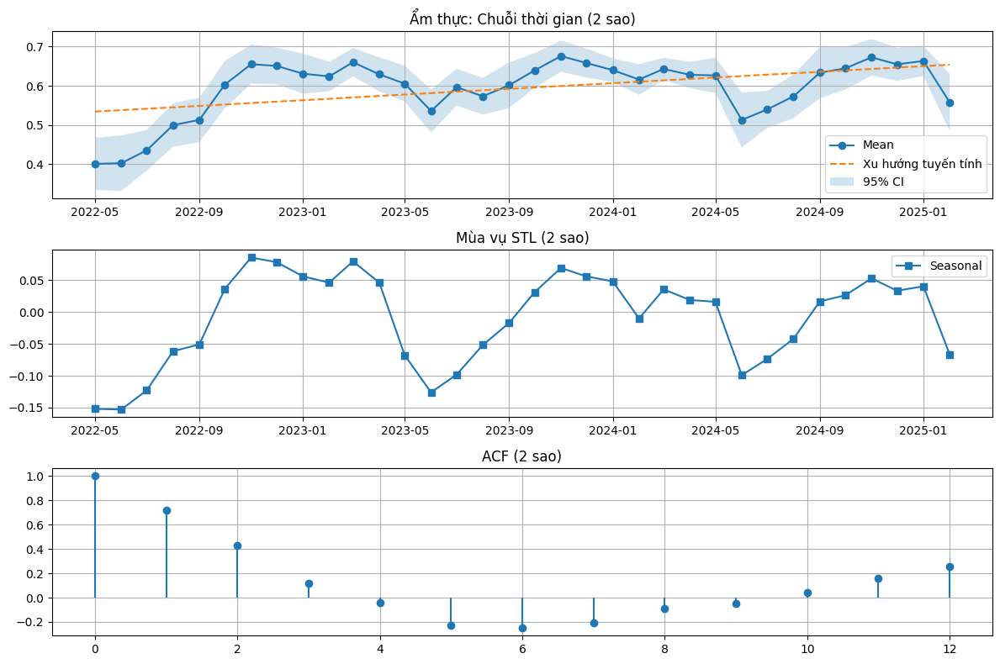

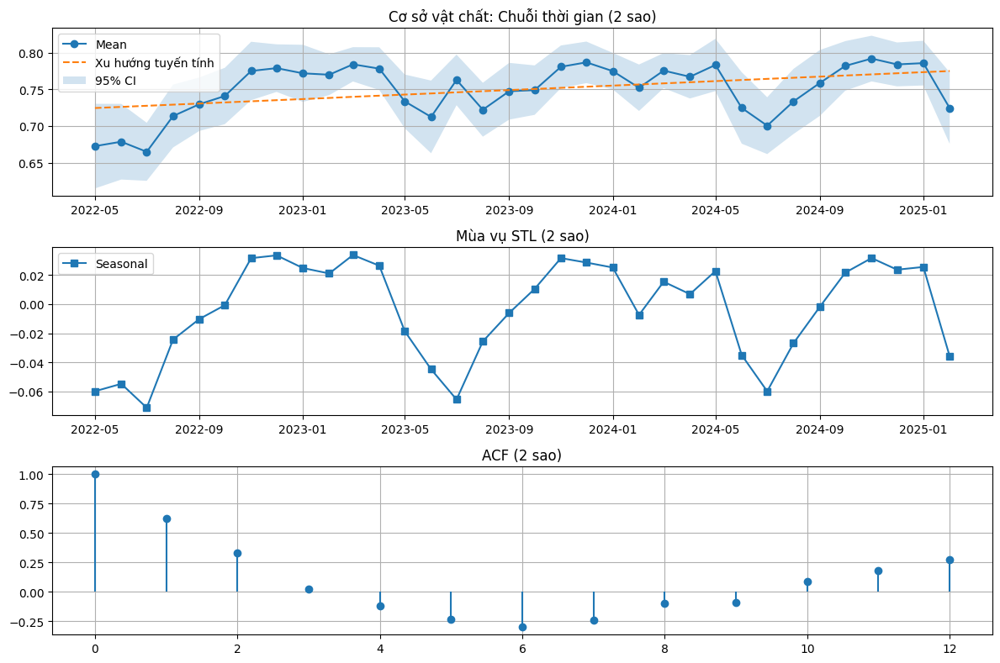

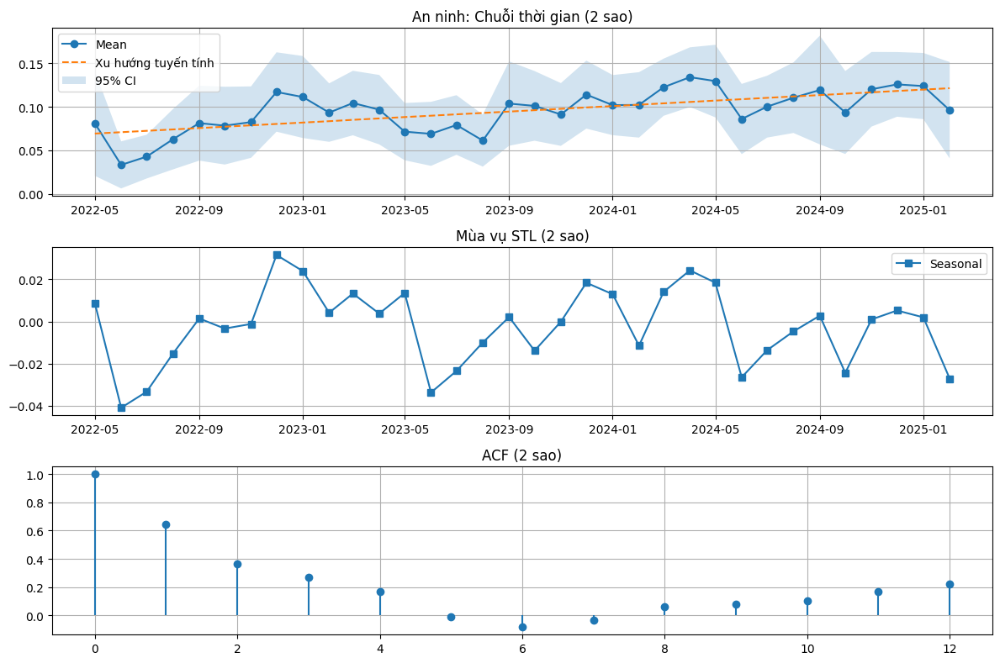

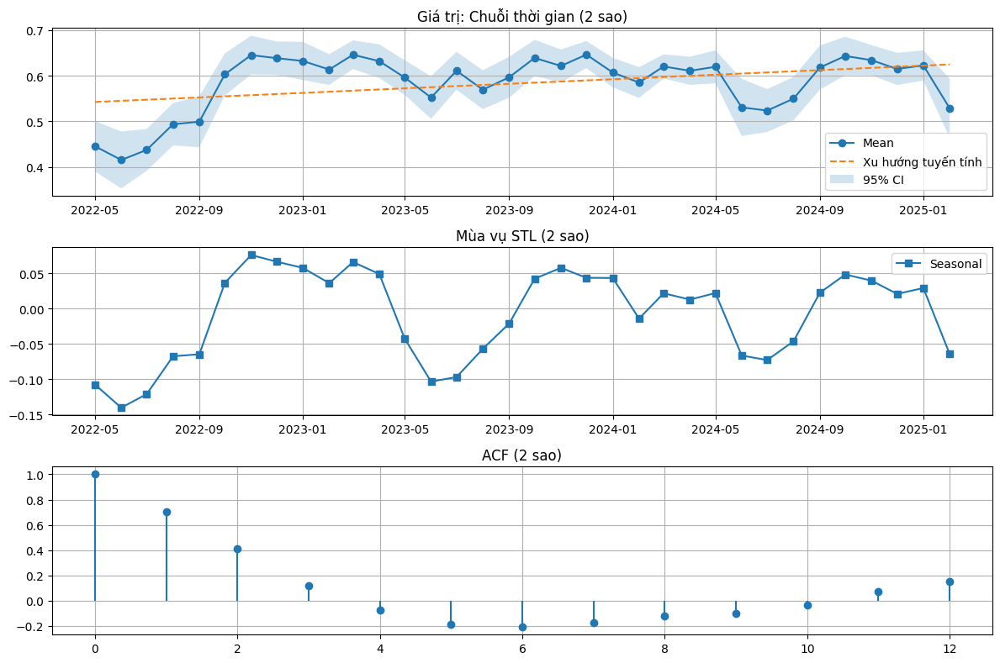


Kết quả phân tích cho cụm 2 sao:
                 Criterion Trend_Linear  Slope_Linear  P_Value_Linear  \
0     Vị trí & môi trường         Tăng        0.0016          0.0322   
1  Phòng nghỉ & tiện nghi     Không rõ        0.0005          0.3106   
2                 Sạch sẽ     Không rõ        0.0005          0.5154   
3     Dịch vụ & nhân viên     Không rõ        0.0013          0.0836   
4                   Wi-Fi         Tăng        0.0024          0.0040   
5                 Ẩm thực         Tăng        0.0036          0.0038   
6          Cơ sở vật chất         Tăng        0.0015          0.0112   
7                 An ninh         Tăng        0.0016          0.0000   
8                 Giá trị         Tăng        0.0025          0.0238   

   Resid_Normality  Resid_Homoscedasticity Trend_MannKendall  P_Value_MK  \
0            False                    True        increasing      0.0470   
1             True                    True          no trend      0.4586   
2             Tr

100%|██████████| 41/41 [00:23<00:00,  1.74it/s]



Đã lưu kết quả phân tích vào: output\hotels_and_reviews_by_month.csv


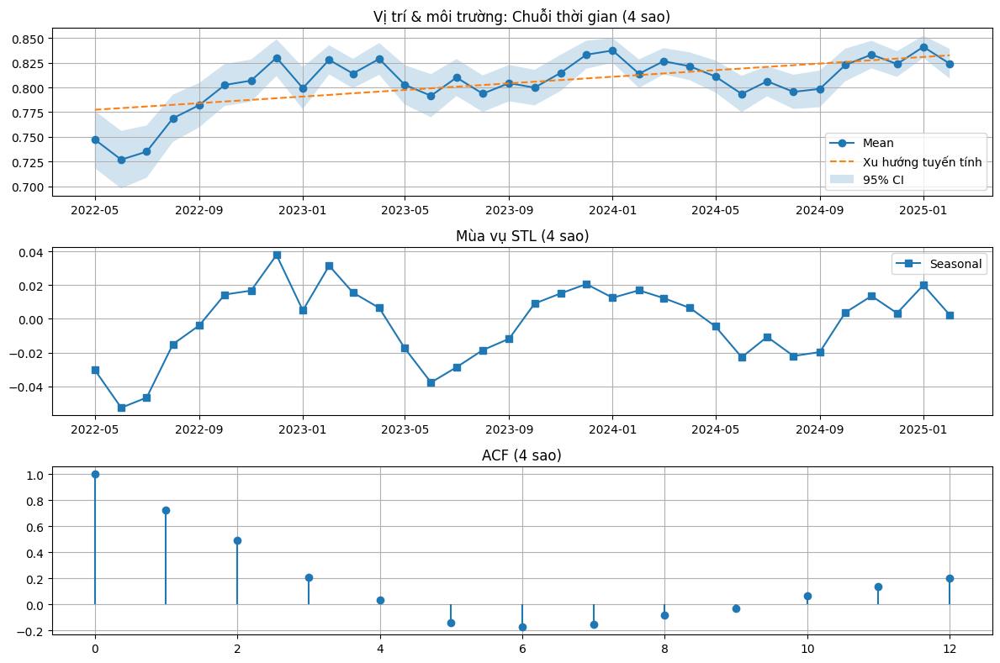

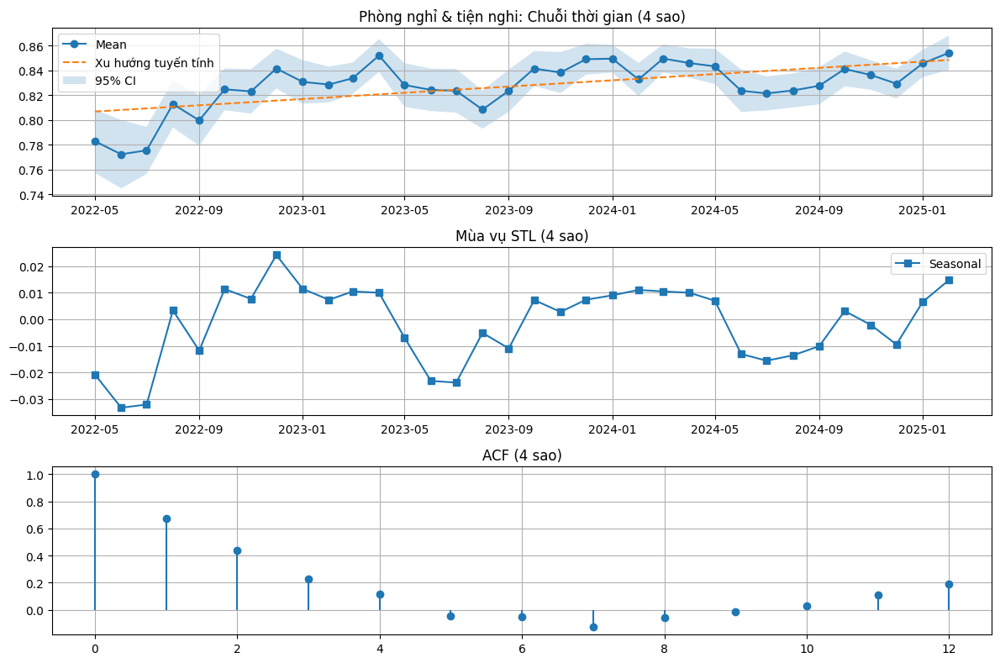

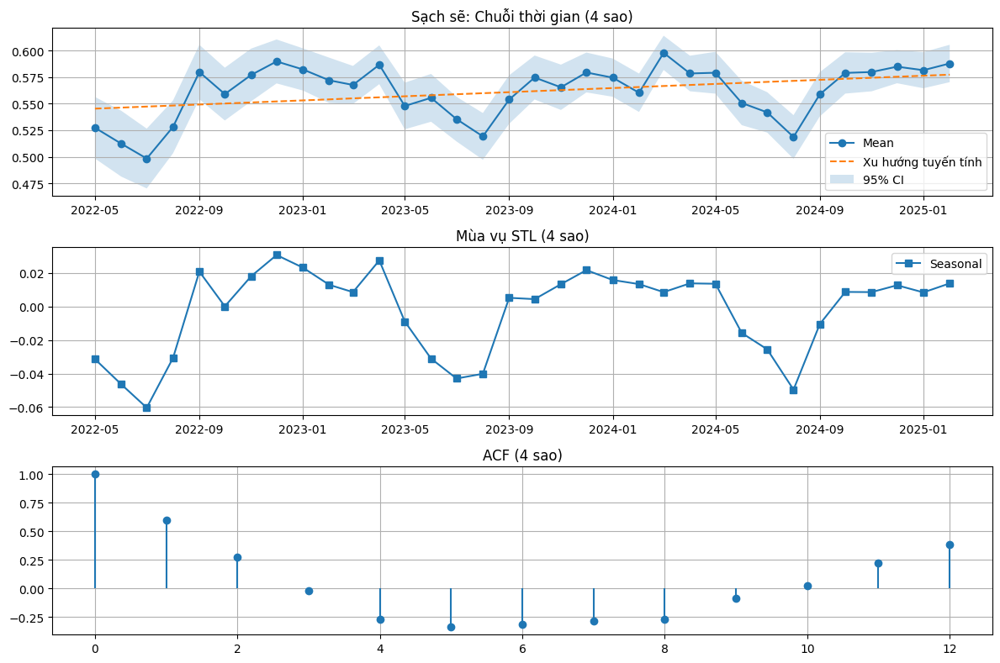

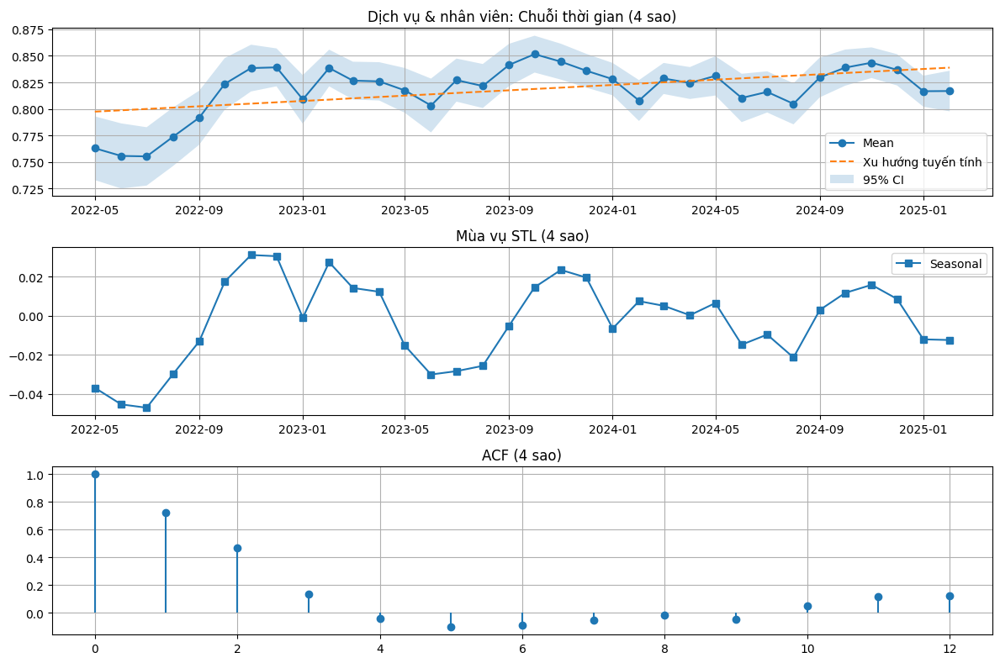

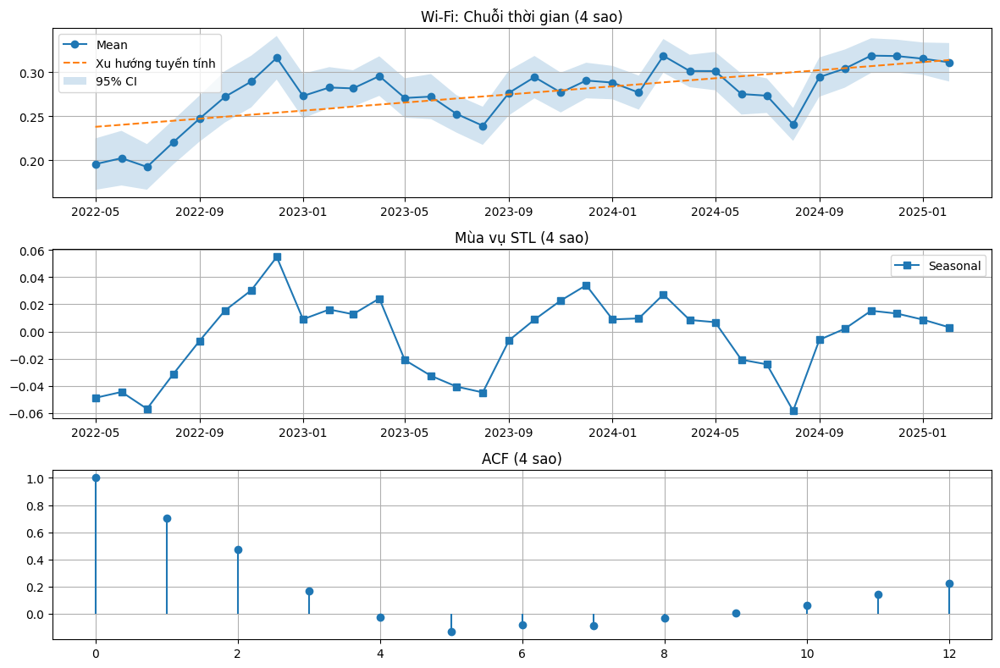

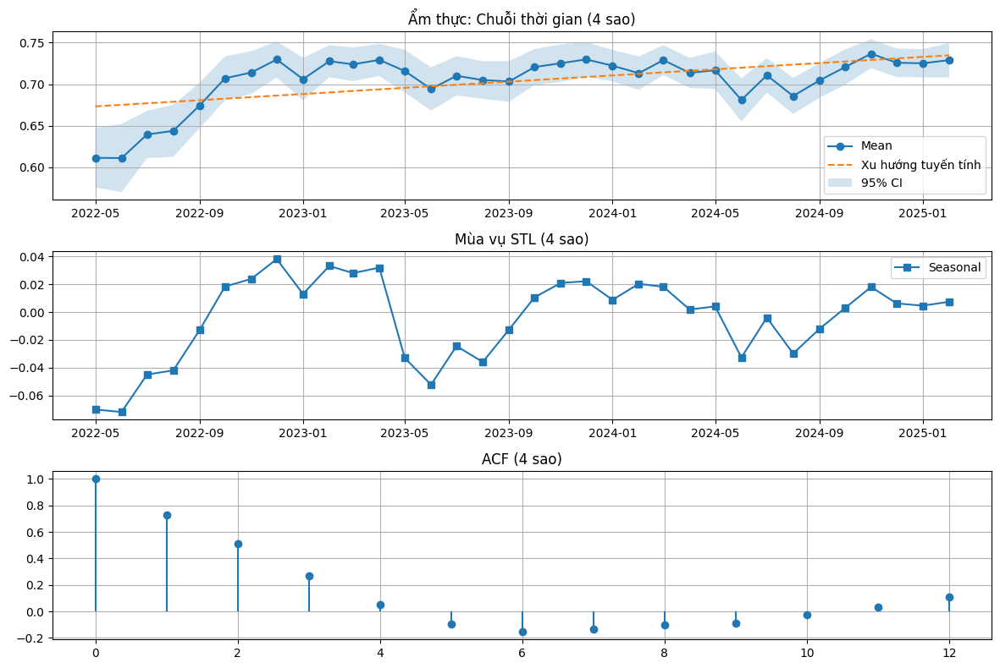

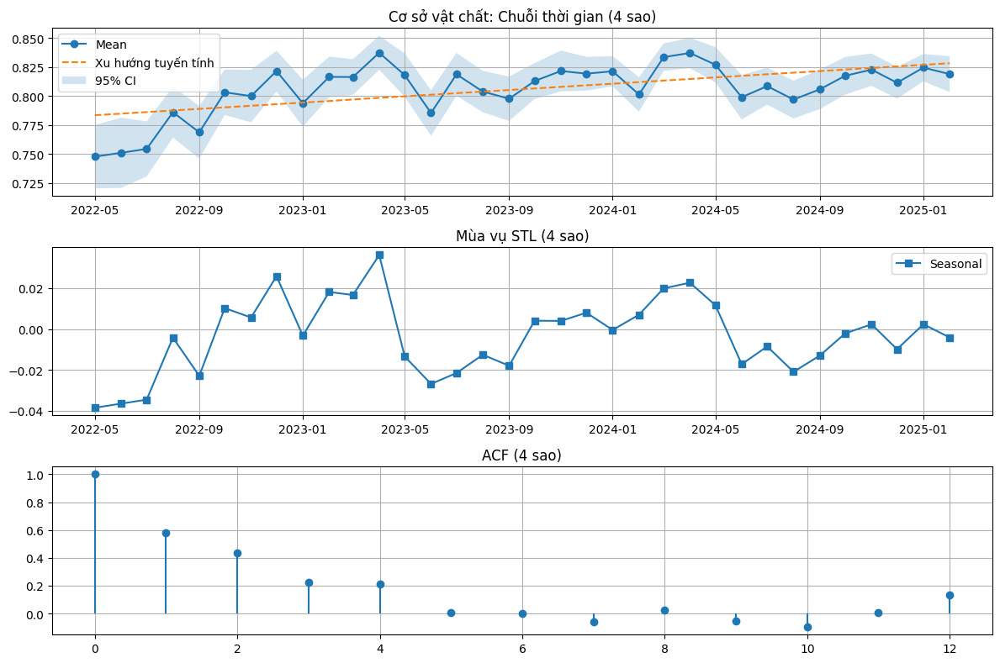

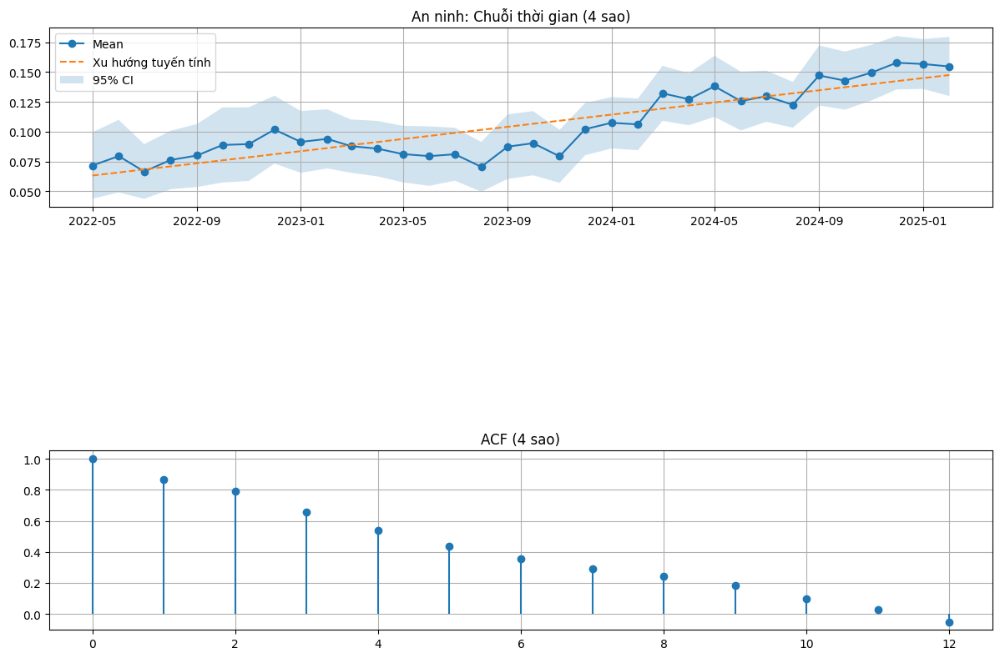

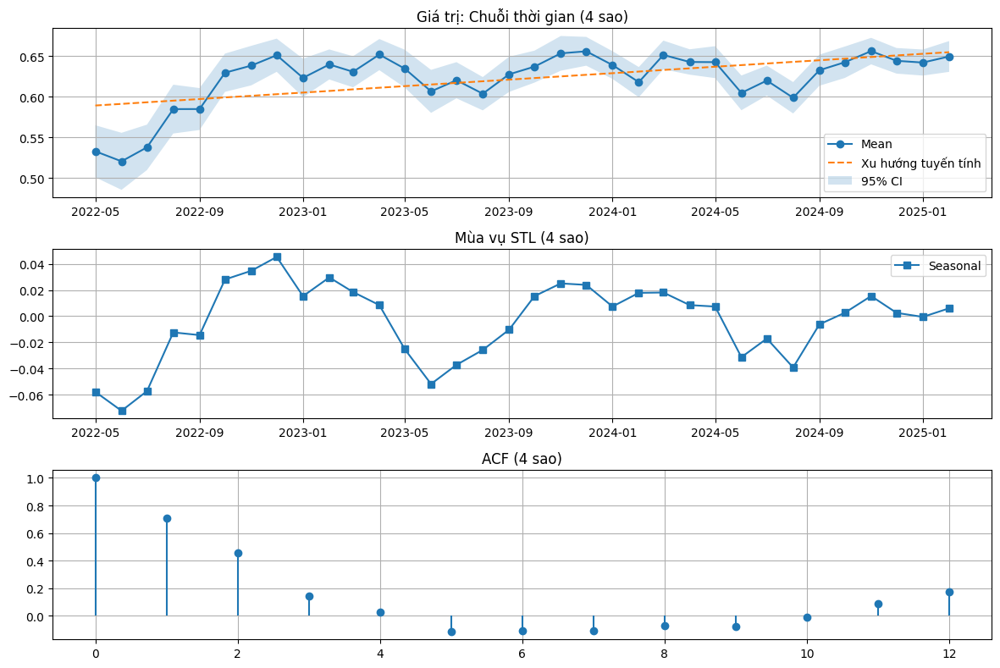


Kết quả phân tích cho cụm 4 sao:
                 Criterion Trend_Linear  Slope_Linear  P_Value_Linear  \
0     Vị trí & môi trường         Tăng        0.0017          0.0001   
1  Phòng nghỉ & tiện nghi         Tăng        0.0013          0.0001   
2                 Sạch sẽ         Tăng        0.0010          0.0266   
3     Dịch vụ & nhân viên         Tăng        0.0013          0.0024   
4                   Wi-Fi         Tăng        0.0023          0.0000   
5                 Ẩm thực         Tăng        0.0019          0.0004   
6          Cơ sở vật chất         Tăng        0.0014          0.0002   
7                 An ninh         Tăng        0.0026          0.0000   
8                 Giá trị         Tăng        0.0020          0.0004   

   Resid_Normality  Resid_Homoscedasticity Trend_MannKendall  P_Value_MK  \
0             True                   False        increasing      0.0015   
1             True                   False        increasing      0.0015   
2             Tr

100%|██████████| 39/39 [00:03<00:00, 10.26it/s]



Đã lưu kết quả phân tích vào: output\hotels_and_reviews_by_month.csv


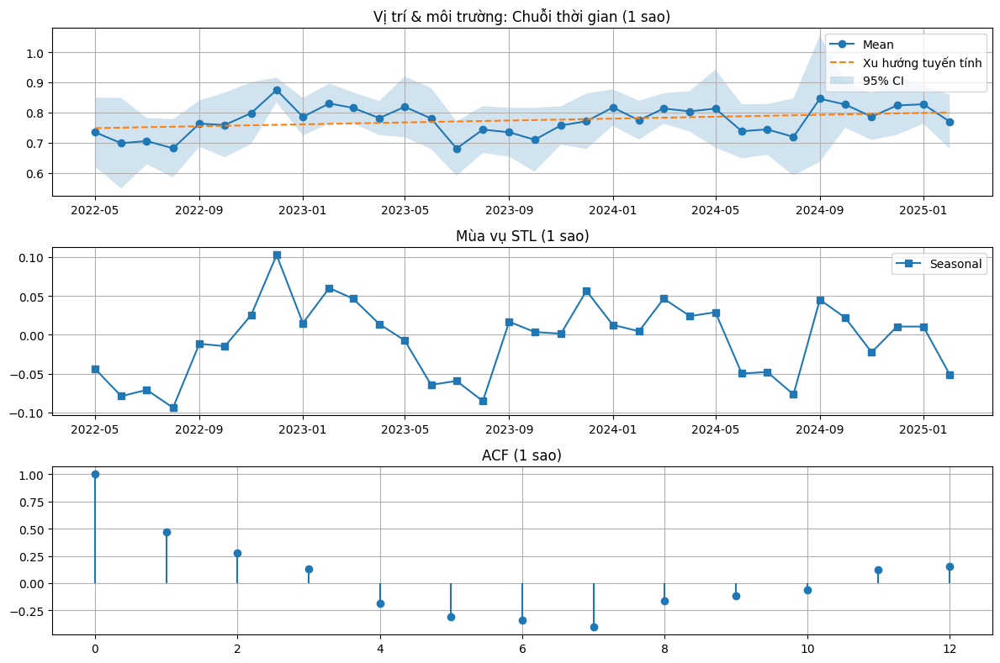

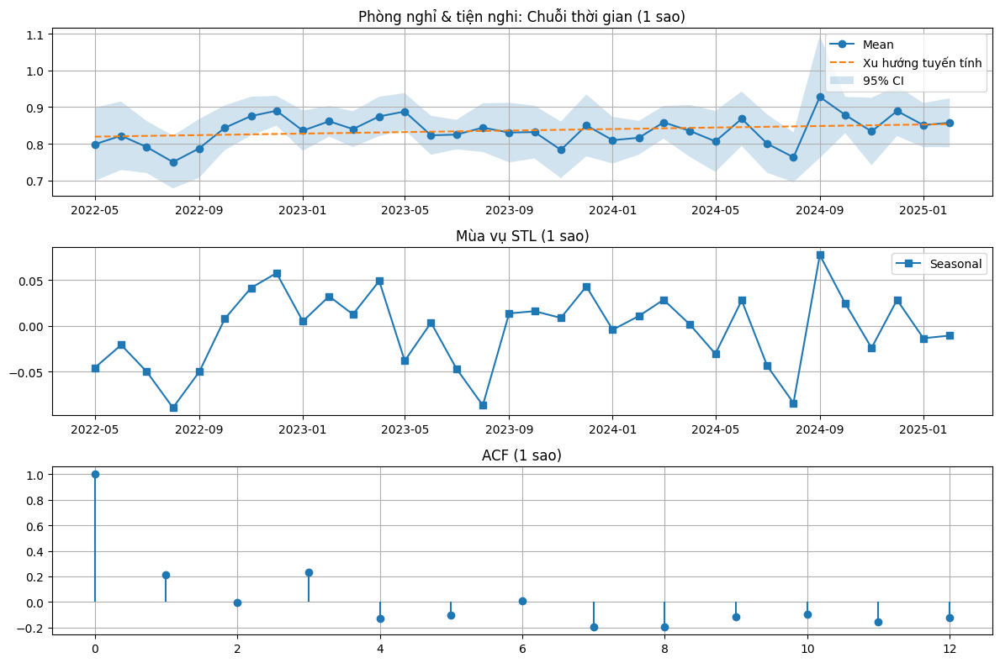

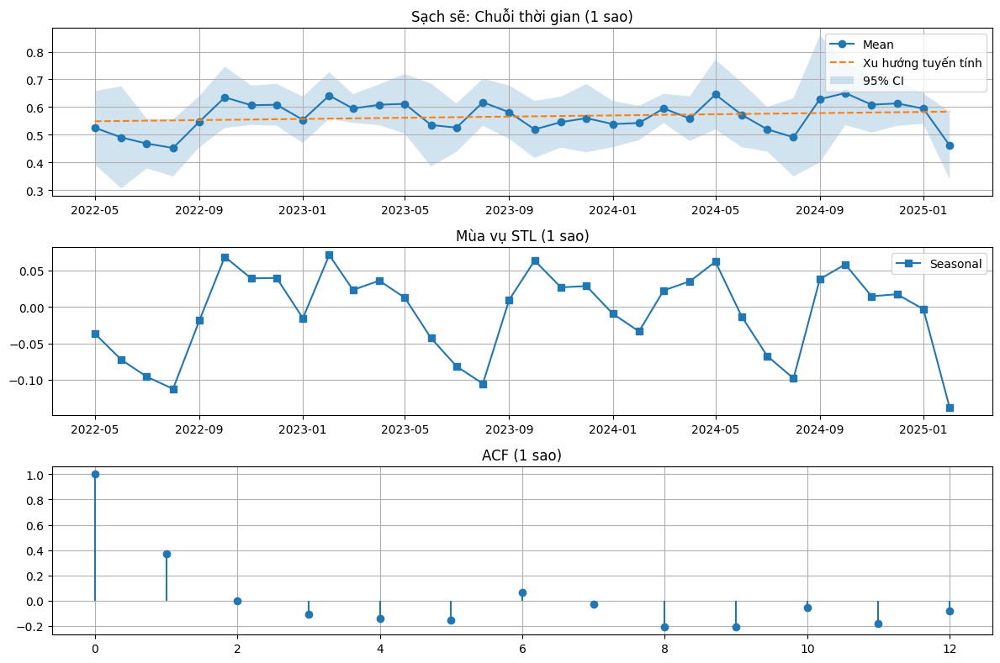

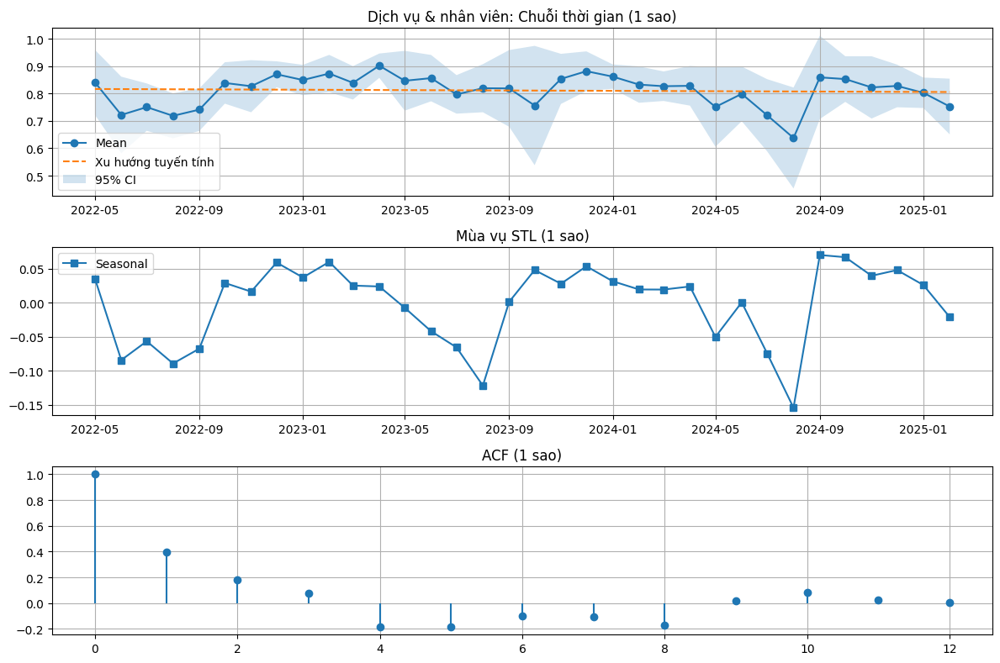

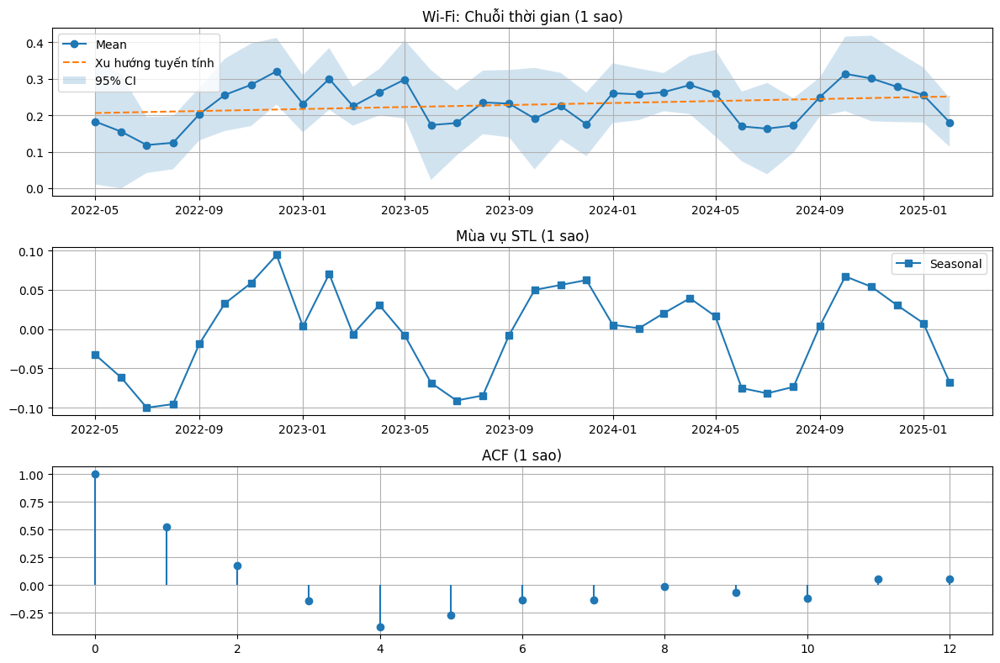

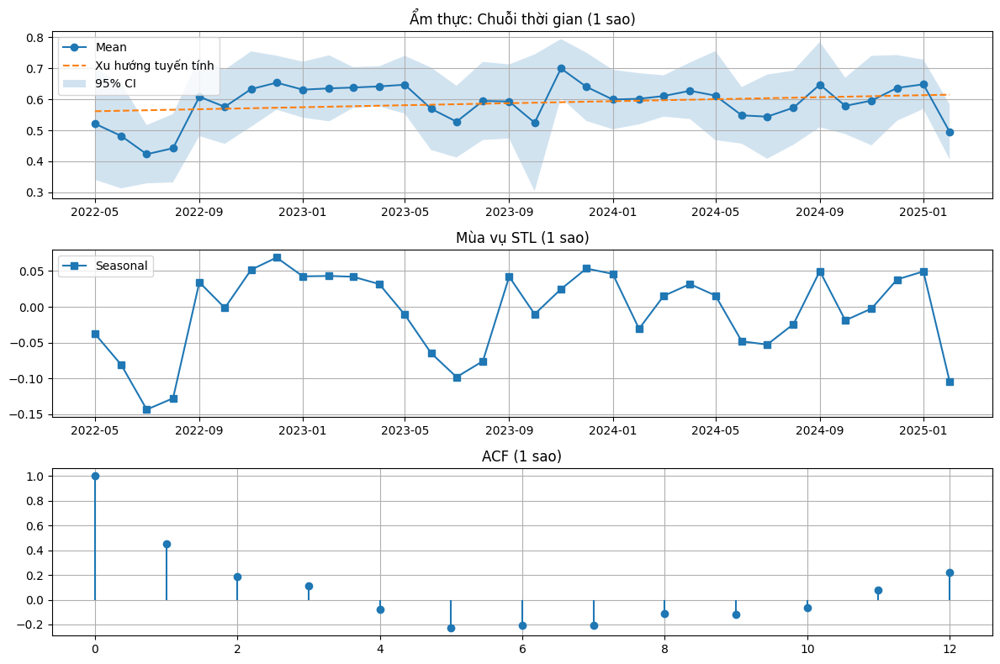

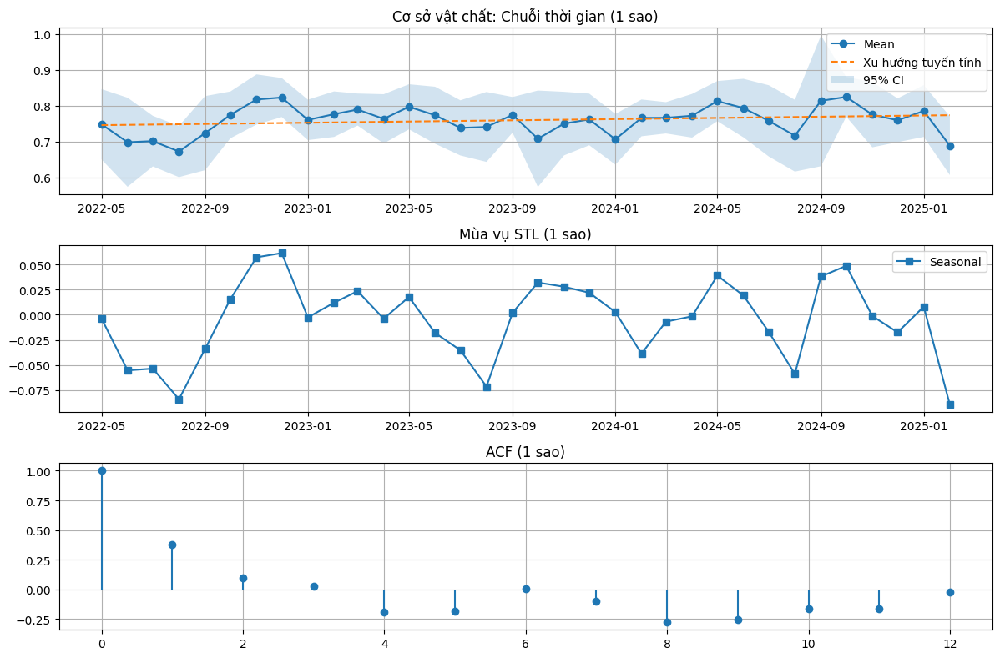

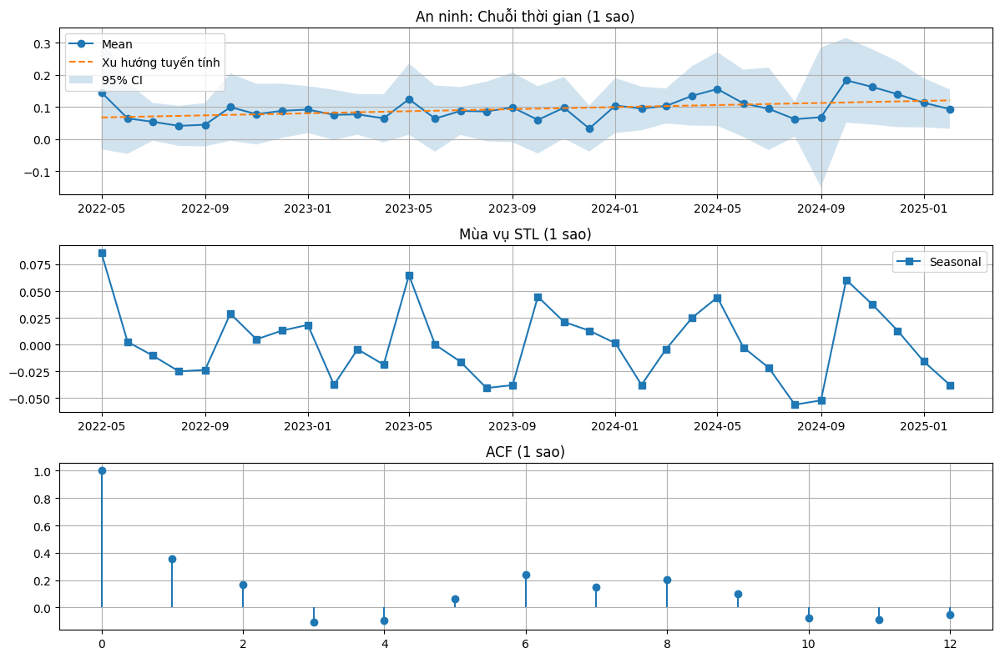

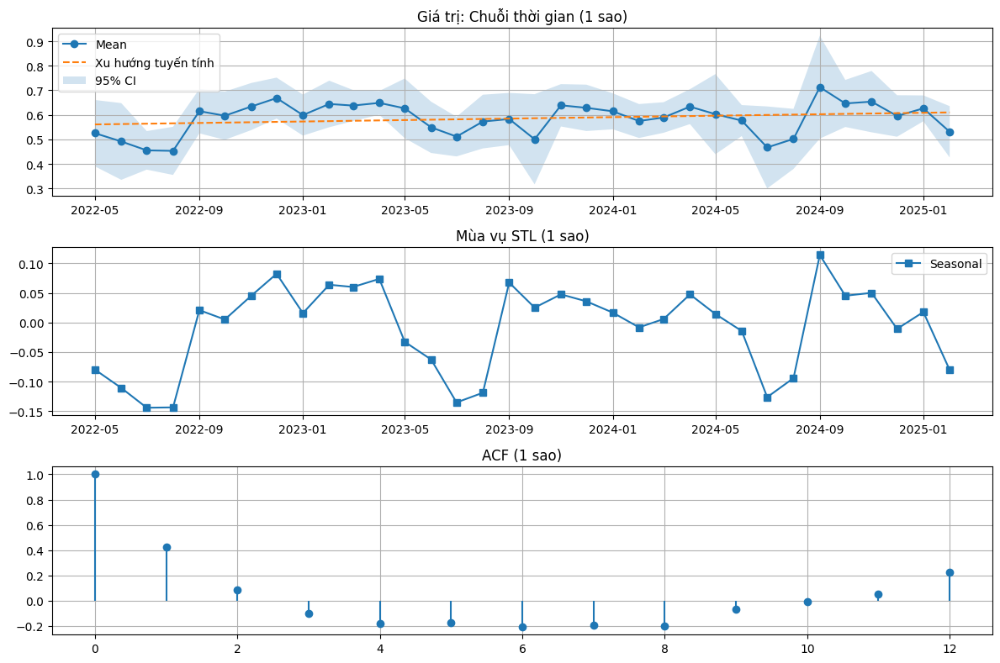


Kết quả phân tích cho cụm 1 sao:
                 Criterion Trend_Linear  Slope_Linear  P_Value_Linear  \
0     Vị trí & môi trường     Không rõ        0.0016          0.0638   
1  Phòng nghỉ & tiện nghi     Không rõ        0.0010          0.1296   
2                 Sạch sẽ     Không rõ        0.0011          0.2812   
3     Dịch vụ & nhân viên     Không rõ       -0.0003          0.7477   
4                   Wi-Fi     Không rõ        0.0014          0.1589   
5                 Ẩm thực     Không rõ        0.0016          0.1466   
6          Cơ sở vật chất     Không rõ        0.0008          0.2328   
7                 An ninh         Tăng        0.0016          0.0075   
8                 Giá trị     Không rõ        0.0015          0.2007   

   Resid_Normality  Resid_Homoscedasticity Trend_MannKendall  P_Value_MK  \
0             True                    True          no trend      0.0705   
1             True                    True          no trend      0.2023   
2             Tr

100%|██████████| 43/43 [00:08<00:00,  5.05it/s]



Đã lưu kết quả phân tích vào: output\hotels_and_reviews_by_month.csv


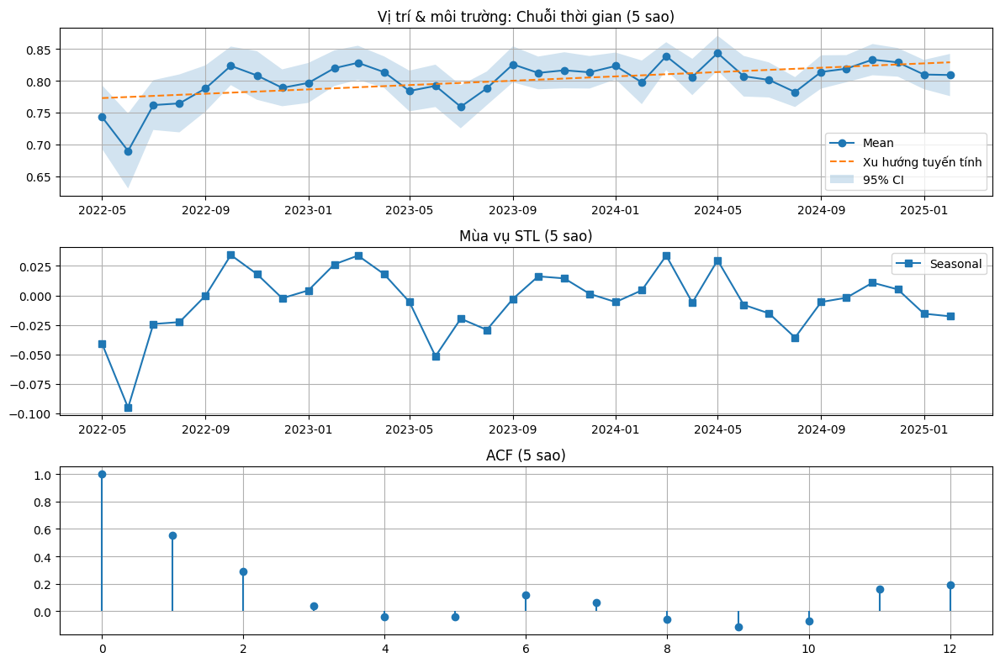

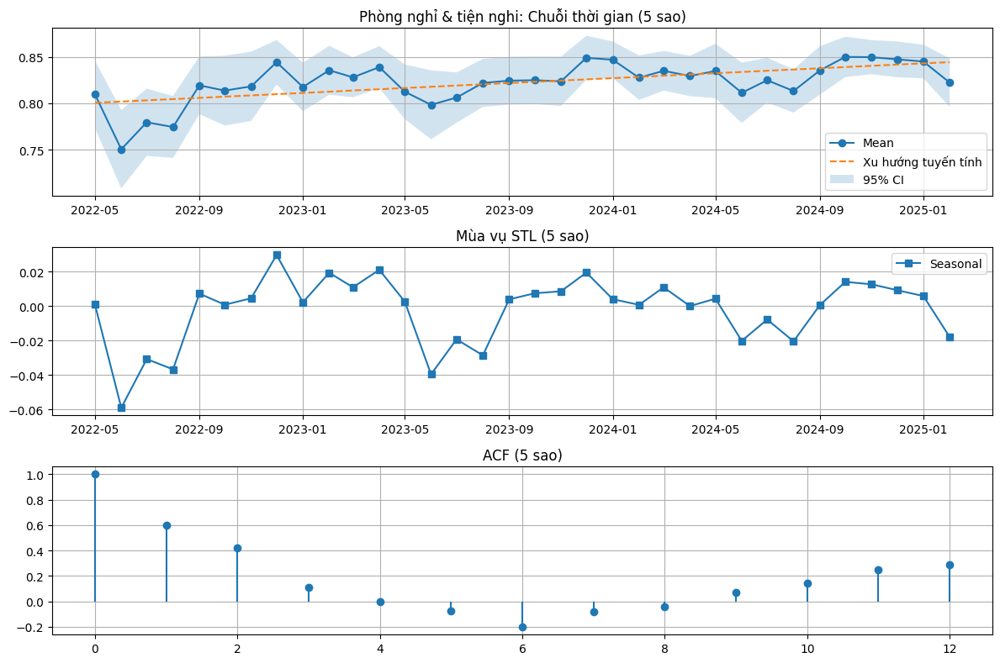

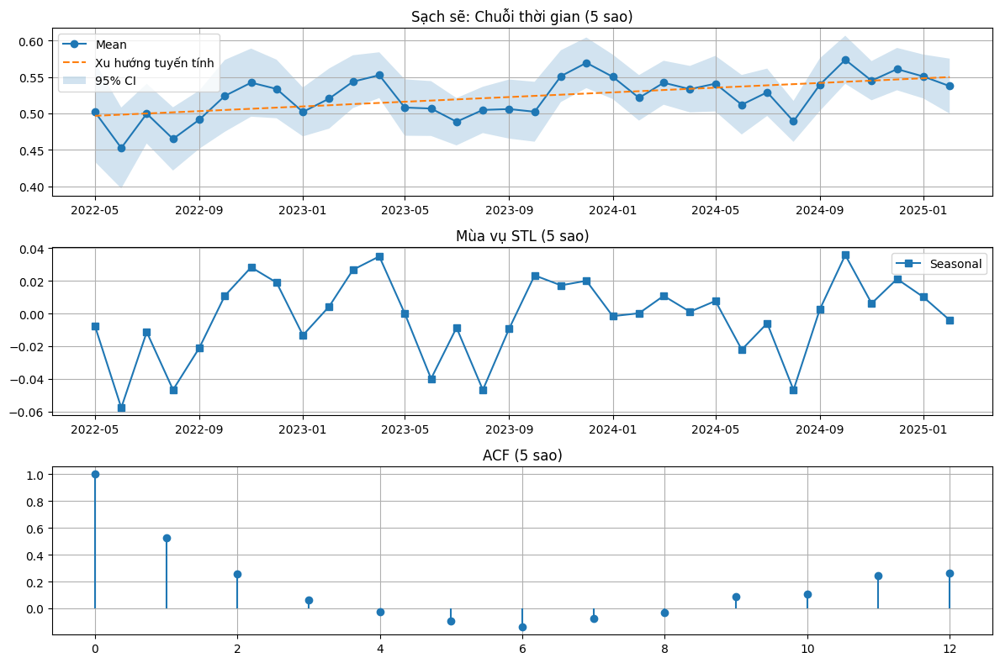

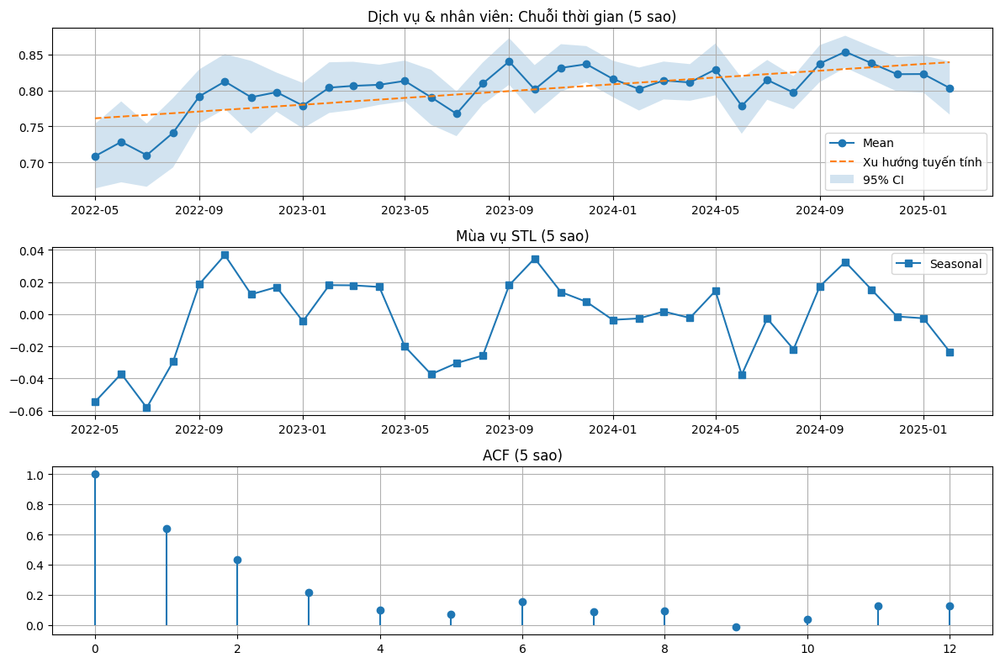

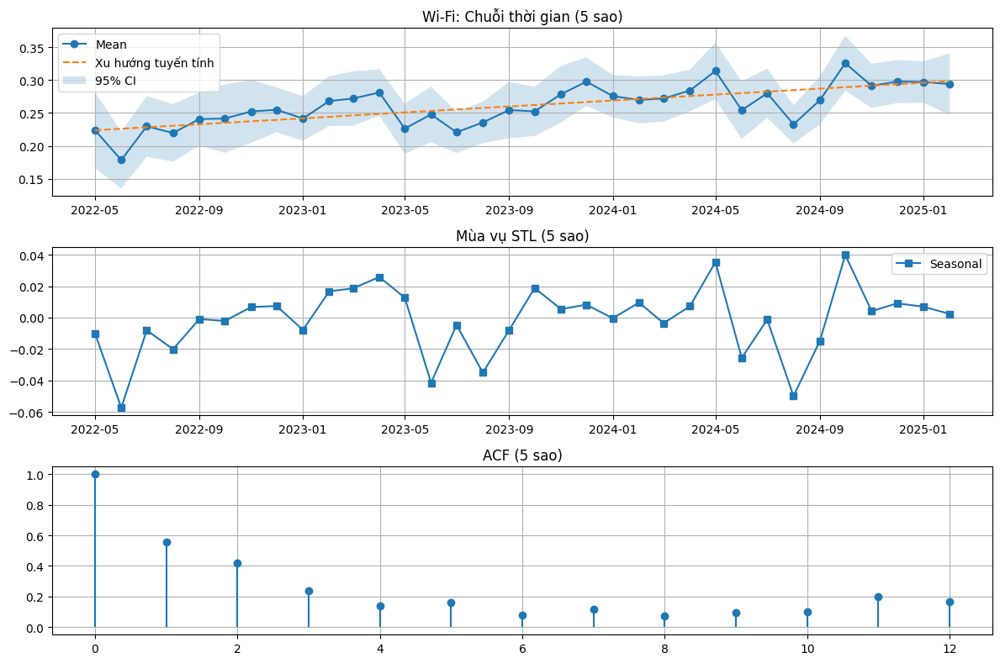

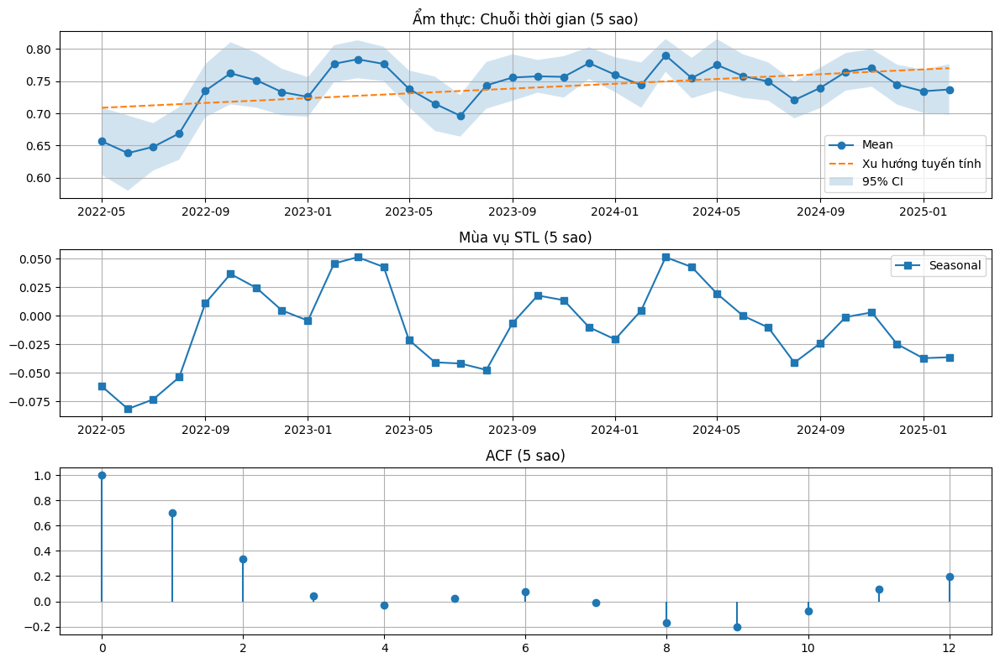

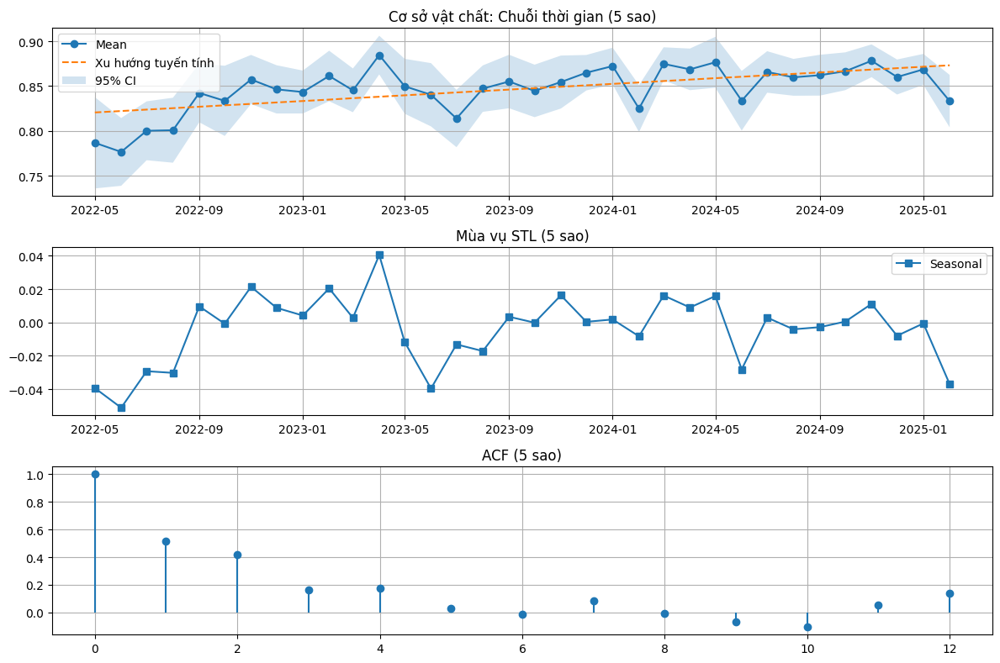

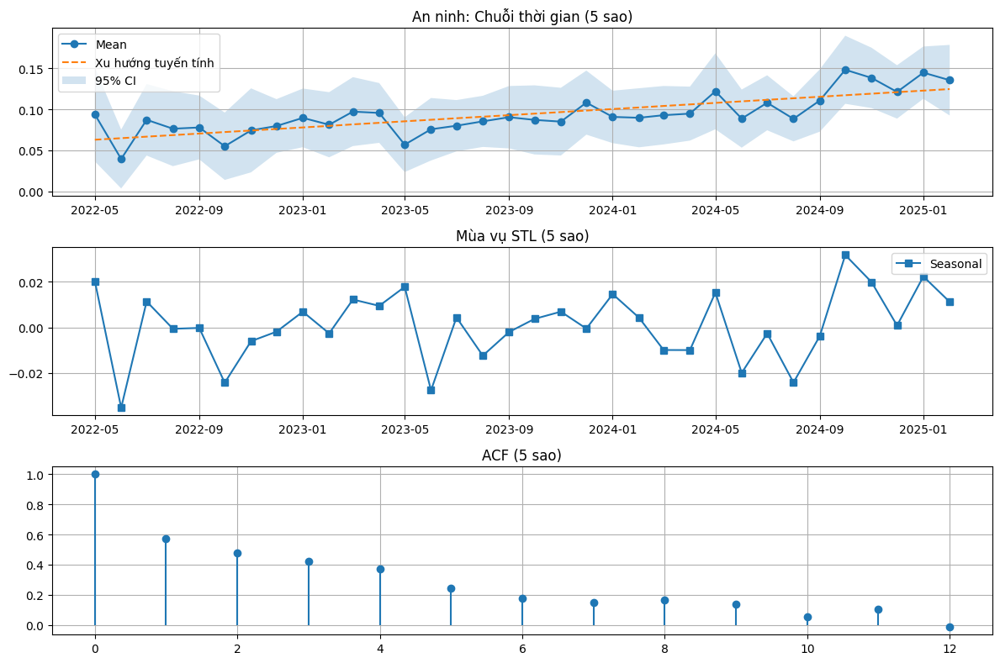

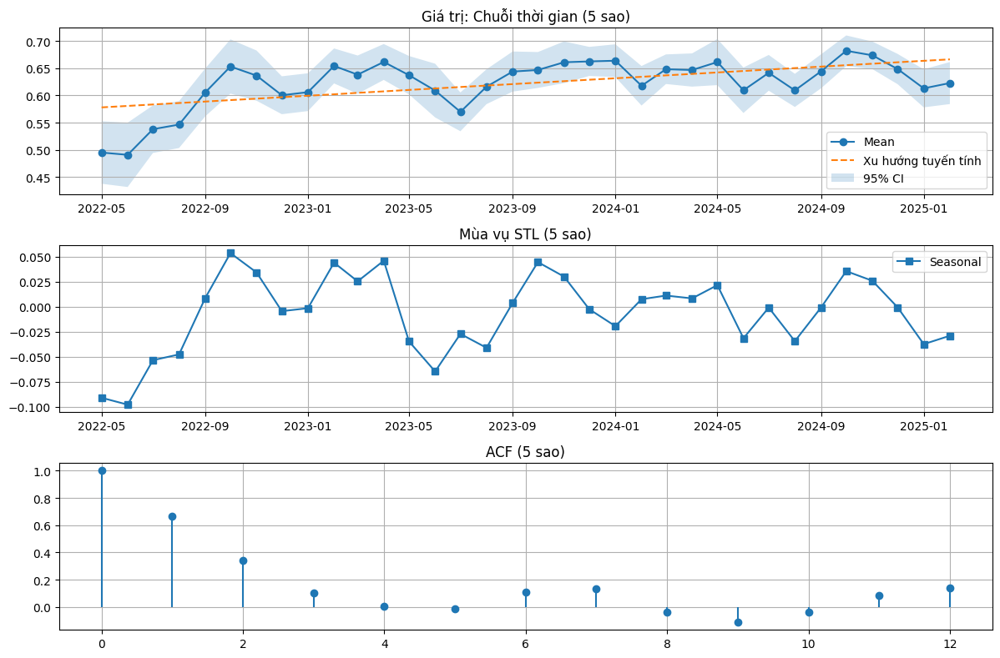


Kết quả phân tích cho cụm 5 sao:
                 Criterion Trend_Linear  Slope_Linear  P_Value_Linear  \
0     Vị trí & môi trường         Tăng        0.0017          0.0007   
1  Phòng nghỉ & tiện nghi         Tăng        0.0013          0.0002   
2                 Sạch sẽ         Tăng        0.0016          0.0005   
3     Dịch vụ & nhân viên         Tăng        0.0024          0.0000   
4                   Wi-Fi         Tăng        0.0023          0.0000   
5                 Ẩm thực         Tăng        0.0019          0.0036   
6          Cơ sở vật chất         Tăng        0.0016          0.0002   
7                 An ninh         Tăng        0.0019          0.0000   
8                 Giá trị         Tăng        0.0027          0.0004   

   Resid_Normality  Resid_Homoscedasticity Trend_MannKendall  P_Value_MK  \
0             True                   False        increasing      0.0040   
1             True                   False        increasing      0.0007   
2             Tr

In [76]:

# Phân tích cho từng cụm sao
output_dir = 'output_clusters'
results_by_cluster = {}
for cluster in merged_df_star['star_cluster'].unique():
    if cluster is not None:
        cluster_df = merged_df_star[merged_df_star['star_cluster'] == cluster]
        ratios_df = calculate_criteria_ratios_by_month(cluster_df)
        exclude_dates = ['2022-02-01', '2022-03-01', '2022-04-01', '2025-03-01']
        ratios_df = ratios_df[~ratios_df['year_month'].isin(exclude_dates)].copy()
        summary_df = calculate_summary_stats(ratios_df)
        analysis_df = analyze_hotels_and_reviews_by_month(ratios_df)
        results_summary = analyze_time_series(summary_df, os.path.join(output_dir, cluster), cluster)
        results_by_cluster[cluster] = results_summary
        print(f"\nKết quả phân tích cho cụm {cluster}:\n", results_summary.round(4))


## Phân tích trên tổng thể

## Phân tích dựa vào phân cụm